In [35]:
%pylab inline

%load_ext autoreload
%autoreload 2

Populating the interactive namespace from numpy and matplotlib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import sys
# from rim_utils import build_rim_parallel, myAdam, build_rim_parallel_single


In [4]:

import tensorflow as tf
import tensorflow_probability as tfp
# import mesh_tensorflow as mtf

sys.path.append('../utils/')
sys.path.append('/mnt/home/cmodi/Research/Projects/flowpm')

import flowpm
# import flowpm.mesh_ops as mpm
# import flowpm.mtfpm as mtfpm
# import flowpm.mesh_utils as mesh_utils
from astropy.cosmology import Planck15
from flowpm.tfpm import PerturbationGrowth
from flowpm import linear_field, lpt_init, nbody, cic_paint
from flowpm.utils import r2c3d, c2r3d
from flowpm.tfpm import lpt1


import tools
import diagnostics as dg

import contextlib
import functools
import math, time
from scipy.interpolate import InterpolatedUnivariateSpline as iuspline
import scipy.optimize as sopt


sys.path.append('../code/clean_rim/')
from rim_utils import  build_rim_parallel, myAdam
from modelhalo import HaloData, check_2pt, check_im, get_data
from recon_models import Recon_Bias
# from test_rim import standardrecon

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
from scipy.optimize import minimize

from pmesh.pm import ParticleMesh
from scipy.interpolate import InterpolatedUnivariateSpline as ius
from nbodykit.lab import BigFileMesh, BigFileCatalog, FFTPower
from nbodykit.cosmology import Planck15, Cosmology



In [6]:

parser = {}
parser['nc'] = 32
parser['ncf'] = 256
parser['bs'] = 400
parser['nsteps'] = 3
parser['numd'] = 1e-3
parser['niter'] = 100
parser['nbody'] = False
parser['lpt_order'] = 2
parser['input_size'] = 8
parser['cell_size'] = 8 
parser['adam_iter'] = 10
parser['rim_iter'] = 10
parser['suffix'] = ' '
parser['posdata'] = True
parser['parallel'] = True
parser['nsims'] = 100
parser['anneal'] = True
parser['stdinit'] = False
parser['prior'] = False


class Struct:
    def __init__(self, **entries):
        self.__dict__.update(entries)
        
args = Struct(**parser)


In [7]:

nc, bs = args.nc, args.bs
numd = args.numd
num = int(numd*bs**3)
ncf = args.ncf
niter = args.niter
lr = 1e-3
a0, af, nsteps = 0.1, 1.0,  args.nsteps
stages = np.linspace(a0, af, nsteps, endpoint=True)
args.stages = stages
args.a0, args.af = a0, af
args.world_size = 1
if args.posdata : datatype = 'pos'
else : datatype = 'mass'
seed = 599

#
klin = np.loadtxt('../data/Planck15_a1p00.txt').T[0]
plin = np.loadtxt('../data//Planck15_a1p00.txt').T[1]
ipklin = iuspline(klin, plin)
# Compute necessary Fourier kernels                                                                                          
kvec = tools.fftk((nc, nc, nc), boxsize=bs, symmetric=False)
kmesh = (sum(k**2 for k in kvec)**0.5).astype(np.float32)
priorwt = ipklin(kmesh)

args.kmesh = kmesh
args.ipklin = ipklin
args.priorwt = priorwt

datamodel = HaloData(args)


In [8]:
traindata, testdata = get_data(args)


In [9]:

@tf.function
def standardrecon(base, pos, bias, R):

    smwts = tf.exp(tf.multiply(-kmesh**2, R**2))
    basek = r2c3d(base, norm=nc**3)
    basek = tf.multiply(basek, tf.cast(smwts, tf.complex64))
    basesm = c2r3d(basek, norm=nc**3)

    grid = bs/nc*np.indices((nc, nc, nc)).reshape(3, -1).T.astype(np.float32)
    grid = tf.constant(np.expand_dims(grid, 0))
    grid = grid *nc/bs
    pos = pos *nc/bs
        
    mesh = basesm 
    meshk = r2c3d(mesh, norm=nc**3)
    
    DX = lpt1(meshk, pos, kvec=kvec)
    DX = tf.multiply(DX, -1/bias)
    pos = tf.add(pos, DX)
    displaced = tf.zeros_like(mesh)
    displaced = cic_paint(displaced, pos, name='displaced')
    
    DXrandom = lpt1(meshk, grid, kvec)
    DXrandom = tf.multiply(DXrandom, -1/bias)
    posrandom = tf.add(grid, DXrandom)
    random = tf.zeros_like(mesh)
    random = cic_paint(random, posrandom, name='random')
    displaced = displaced / tf.reduce_mean(displaced, axis=(1, 2, 3)) - 1.
    random = random / tf.reduce_mean(random, axis=(1, 2, 3)) - 1.
    recon = displaced - random 
    return recon, displaced, random


In [10]:

def get_sim(seed=599):
    path = '//mnt/ceph/users/cmodi/cosmo4d/z00/'
    dyn = "%02dstep"%3
    hpath = path + '/L%04d_N%04d_%s//'%(bs, ncf, '20step')
    path = path + '/L%04d_N%04d_%s//'%(bs, nc, dyn)

    ic = tools.readbigfile(path + '/L%04d_N%04d_S%04d_%s/mesh/s/'%(bs, nc, seed, dyn))
    final = tools.readbigfile(path + '/L%04d_N%04d_S%04d_%s/mesh/d/'%(bs, nc, seed, dyn))
    
    hpos = tools.readbigfile(hpath + '/L%04d_N%04d_S%04d_20step/FOF/PeakPosition/'%(bs, ncf, seed))[:num]
    hmassall = tools.readbigfile(hpath + '/L%04d_N%04d_S%04d_20step/FOF/Mass/'%(bs, ncf, seed)).flatten()
    print(hmassall.shape, hmassall.shape[0]/bs**3, hmassall.shape[0]/bs**3 /numd)
    hmass = hmassall[:num]
    print(hmass.shape, hmass.shape[0]/bs**3, hmass.shape[0]/bs**3 /numd)
    hmeshpos = tools.paintcic(hpos, bs, nc)
    hmeshmass = tools.paintcic(hpos, bs, nc, hmass.flatten()*1e10)
    hmeshmass /= hmeshmass.mean()
    hmeshmass -= 1
    hmeshpos /= hmeshpos.mean()
    hmeshpos -= 1
    return ic, final, hmeshpos, hmeshmass, hpos

In [11]:
ic, final, hmeshpos, hmeshmass, hpos = get_sim()
xx = ic.reshape(1, nc, nc, nc).astype(np.float32)
if args.posdata: yy = hmeshpos.reshape(1, nc, nc, nc).astype(np.float32)
else: yy = hmeshmass.reshape(1, nc, nc, nc).astype(np.float32)



###Standard recon
pfin = tools.power(final, boxsize=bs)[1]
ph = tools.power(1+hmeshpos, boxsize=bs)[1]
bias1 = ((ph[1:5]/pfin[1:5])**0.5).mean()
print("Bias : ", bias1)

    

(62455,) 0.000975859375 0.975859375
(62455,) 0.000975859375 0.975859375
Bias :  1.2375483508203386


In [12]:
###RIM Recon
bias, errormesh = datamodel.setupbias(traindata, nsims=10);
print(bias)
grad_params = [bias, errormesh]
b1, b2 = bias.numpy()[0], bias.numpy()[1]


ZA/2LPT sim

Bias fit params are :  1.1058012887249968 -0.31252349521411216 0.0
ZA/2LPT sim

Bias fit params are :  1.0873334807819628 -0.3130114697903309 0.0

Bias fit params are :  1.1012641618589512 -0.34015062010193886 0.0

Bias fit params are :  1.0988018267621975 -0.3392426732342041 0.0

Bias fit params are :  1.1209142432949353 -0.30539933846299333 0.0

Bias fit params are :  1.122635933119219 -0.3602636867431659 0.0

Bias fit params are :  1.1202327352504535 -0.29896965067755366 0.0

Bias fit params are :  1.1137386121851804 -0.29262150560493083 0.0

Bias fit params are :  1.1262830013611842 -0.3231313355992451 0.0

Bias fit params are :  1.0996538928282058 -0.3262739577050161 0.0
b1 : 1.110 $\pm$ 0.01
b2 : : -0.321 $\pm$ 0.02
tf.Tensor([ 1.1096659  -0.32115877], shape=(2,), dtype=float32)


In [13]:
bmodeltf = datamodel.biasfield(xx, bias).numpy()
k, ph = tools.power(yy[0], boxsize=bs)
k, pb = tools.power(bmodeltf[0], boxsize=bs)
k, px = tools.power(yy[0], f2=bmodeltf[0], boxsize=bs)

plt.plot(k, px/(pb*ph)**0.5)
plt.plot(k, (pb/ph)**0.5)
plt.semilogx()
plt.ylim(0.5, 1.2)
plt.grid(which='both')

Add 1 to get nonzero mean of 9.313e-10
Add 1 to get nonzero mean of -4.657e-09
Add 1 to get nonzero mean of 9.313e-10
Add 1 to get nonzero mean of -4.657e-09


In [14]:


stdpred, displaced, random = standardrecon(tf.constant(yy), 
                                           tf.expand_dims(tf.constant(hpos, dtype=tf.float32), 0),
                                           tf.constant(bias1, dtype=tf.float32), R=tf.constant(128, dtype=tf.float32))



In [15]:
lr = 0.5

x_initstd = np.load('/mnt/ceph/users/cmodi/cosmo4d/z00/L0400_N%04d_D0010/stdR128_S%04d.npy'%(nc, 599))
x_initstd = (x_initstd / bias1).astype(np.float32).reshape(1, nc, nc, nc)

if args.stdinit: x_init = x_initstd 
else: x_init = np.random.normal(size=xx.size).reshape(xx.shape).astype(np.float32)
    
print("Loss at truth : ", datamodel.recon(tf.constant(xx), tf.constant(yy),  *[bias, errormesh]))
print("Loss at init : ", datamodel.recon(tf.constant(x_init), tf.constant(yy),  *[bias, errormesh]))

pred_adam = datamodel.reconstruct(tf.constant(yy), bias, errormesh, RRs=[0.0], niter=args.rim_iter, lr=lr, x_init=x_init)
print("Loss at adam 10x : ", datamodel.recon(tf.constant(pred_adam[0]), tf.constant(yy),  *[bias, errormesh]))


pred_adam10 = datamodel.reconstruct(tf.constant(yy), bias, errormesh, RRs=[0.0], niter=args.rim_iter*10, lr=lr, x_init=x_init)
print("Loss at adam 10x : ", datamodel.recon(tf.constant(pred_adam10[0]), tf.constant(yy),  *[bias, errormesh]))

minic, minfin = datamodel.reconstruct(tf.constant(yy), bias, errormesh, RRs=[2.0, 1.0, 0.0], niter=args.rim_iter*20, lr=lr, x_init=x_init)
print("Loss at best recon: ", datamodel.recon(tf.constant(minic), tf.constant(yy),  *[bias, errormesh]))

compares =  [stdpred, pred_adam, pred_adam10, [minic[0], minfin[0]]]
print('Test set generated')


RIM does not use prior

Loss at truth :  (<tf.Tensor: shape=(), dtype=float32, numpy=0.00050717336>, <tf.Tensor: shape=(), dtype=float32, numpy=0.00050717336>, <tf.Tensor: shape=(), dtype=float32, numpy=0.0>)
Loss at init :  (<tf.Tensor: shape=(), dtype=float32, numpy=0.0019729761>, <tf.Tensor: shape=(), dtype=float32, numpy=0.0019729761>, <tf.Tensor: shape=(), dtype=float32, numpy=0.0>)
reconstructing
For smoothing scale :  0.0

Add annealing section to graph


minimized

Loss at adam 10x :  (<tf.Tensor: shape=(), dtype=float32, numpy=0.0013720673>, <tf.Tensor: shape=(), dtype=float32, numpy=0.0013720673>, <tf.Tensor: shape=(), dtype=float32, numpy=0.0>)
reconstructing
For smoothing scale :  0.0

Add annealing section to graph


minimized

Loss at adam 10x :  (<tf.Tensor: shape=(), dtype=float32, numpy=0.00073150964>, <tf.Tensor: shape=(), dtype=float32, numpy=0.00073150964>, <tf.Tensor: shape=(), dtype=float32, numpy=0.0>)
reconstructing
For smoothing scale :  2.0

Add annealing sec

# LBFGS

In [16]:
# cosmo4d = '/mnt/ceph/users/cmodi/cosmo4d-recon/z00/L0400-N0064-S0100/opt_s999_mass_fourier_LPT/datap/s//
cosmo4d = '/mnt/ceph/users/cmodi/cosmo4d-recon/z00/L%04d-N%04d-S0100/opt_s999_%s_fourier_LPT/'%(bs, nc, datatype)
datalfgs = [tools.readbigfile(cosmo4d + 'datap/s/'), tools.readbigfile(cosmo4d + 'datap/mapp/')]
fitlbfgs = [tools.readbigfile(cosmo4d + '/%d-0.00/best-fit/s/'%nc), tools.readbigfile(cosmo4d + '/%d-0.00/best-fit/mapp/'%nc)]

# RIM

In [17]:
rim_grad_fn = datamodel.recon_grad 
grad_params = [bias, errormesh]
b1, b2 = bias[0].numpy(), bias[1].numpy()


In [18]:


#RIM params
params = {}
params['input_size'] = 8
params['cell_size'] = 8
params['strides'] = 2
params['middle_size'] = args.input_size // params['strides']  #lets divide by strides
params['cell_kernel_size'] = 5
params['input_kernel_size'] = 5
params['middle_kernel_size'] = 5
params['output_kernel_size'] = 5
params['rim_iter'] = args.rim_iter
params['input_activation'] = 'tanh'
params['output_activation'] = 'linear'
params['nc'] = nc

params16 = params.copy()
params16['input_size'] = 16
params16['cell_size'] = 16


In [19]:
if args.stdinit: stdstring = '_std'
else: stdstring  = ''

rimfolder = '../code/clean_rim/models/L0400_N%03d/LPT2_halo_cutoff_w4_%s%s/'%(nc, datatype, stdstring)
print(rimfolder)
rim = build_rim_parallel(params)
for i in range(40, 30, -1):    
    try: 
        rim.load_weights(rimfolder+"%d"%i)
        break
    except: pass
print('checkpoint %d loaded'%i)
allpred = rim(tf.constant(x_init), tf.constant(yy), rim_grad_fn, grad_params)
pred = allpred[-1]

rimfolder16 = '../code/clean_rim/models/L0400_N%03d/LPT2_halo_cutoff_w4_%s%s_16ly/'%(nc, datatype, stdstring)
print(rimfolder16)
rim16 = build_rim_parallel(params16)
for i in range(40, 30, -1):    
    try: 
        rim16.load_weights(rimfolder16+"%d"%i)
        break
    except: pass
print('checkpoint %d loaded'%i)
allpred16 = rim16(tf.constant(x_init), tf.constant(yy), rim_grad_fn, grad_params)
pred16 = allpred16[-1]



../code/clean_rim/models/L0400_N032/LPT2_halo_cutoff_w4_pos/
checkpoint 39 loaded

RIM does not use prior

../code/clean_rim/models/L0400_N032/LPT2_halo_cutoff_w4_pos_16ly/
checkpoint 39 loaded


In [20]:
def get_ps(iterand, truth):
    pks = []
    nsim = len(iterand)
    for i in range(nsim):
        a, b = iterand[i].copy(), truth[i].copy()
        if abs(a.mean()) < 1e-1: a += 1
        if abs(b.mean()) < 1e-1: b += 1
        k, p1 = tools.power(a, boxsize=bs)
        k, p2 = tools.power(b, boxsize=bs)
        k, px = tools.power(a, f2=b, boxsize=bs)
        pks.append([p1, p2, px])
    return k, pks


In [21]:
toplot = [pred, pred16, pred_adam[0], pred_adam10[0], stdpred, minic]
labels = ['RIM 8', 'RIM 16', 'ADAM', 'ADAM x10', 'Standard', 'Anneal \n(ADAM x20)']
lss = ['-', '-', ':', ':', '-.', '--']

fig, ax = plt.subplots(1, 2, figsize = (12, 4), sharex=True)

for i in range(len(toplot)):
    k, ps = get_ps([toplot[i].numpy()[0] ], [xx[0]])
    if lss[i] != '-' : alpha, lw = 0.8, 2
    else: alpha, lw = 1, 1.5
    ax[0].plot(k, ps[0][2]/(ps[0][0]*ps[0][1])**0.5, label=labels[i], ls=lss[i], lw=lw, alpha=alpha)
    ax[1].plot(k, (ps[0][0]/ps[0][1])**0.5, ls=lss[i], lw=lw, alpha=alpha)

k, ps = get_ps([fitlbfgs[0]], [datalfgs[0]])
ax[0].plot(k, ps[0][2]/(ps[0][0]*ps[0][1])**0.5, label='Anneal \n(LBFGS x10)', ls="--")
ax[1].plot(k, (ps[0][0]/ps[0][1])**0.5, ls="--")

ax[0].set_ylim(-0.1, 1.1)
ax[1].set_ylim(-0.1, 1.5)
ax[0].set_ylabel('$r_c$', fontsize=14)
ax[1].set_ylabel('$t_f$', fontsize=14)

for axis in ax:
    axis.grid(which='both')
    ax[0].legend(fontsize=12, bbox_to_anchor=(0.1, 1.), ncol=5, loc='lower left')
    axis.semilogx()
    axis.set_xlabel('k (h/Mpc)', fontsize=12)
    axis.tick_params(axis='both', which='major', labelsize=12)    
    axis.axhline(1, color='k', lw=0.5)
suff = ''
fname = './figs/L%04d_N%04d_%s%s'%(bs, nc, datatype, stdstring)
print(fname)
# plt.savefig(fname + '.png')
# plt.savefig(fname + '.pdf')


./figs/L0400_N0032_pos


./figs/L0400_N0032_pos-2ptniters


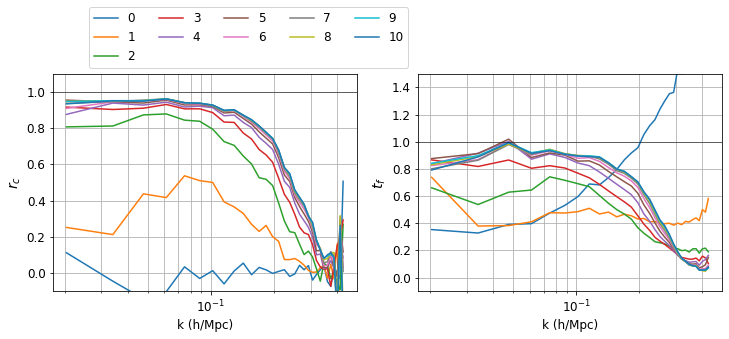

In [143]:
fig, ax = plt.subplots(1, 2, figsize = (12, 4), sharex=True)
for i in range(allpred.shape[0]):
    xpred = allpred[i].numpy()[0]
    k, ps = get_ps([xpred], [xx[0]])
    ax[0].plot(k, ps[0][2]/(ps[0][0]*ps[0][1])**0.5, label=i)
    ax[1].plot(k, (ps[0][0]/ps[0][1])**0.5)

ax[0].set_ylim(-0.1, 1.1)
ax[1].set_ylim(-0.1, 1.5)
ax[0].set_ylabel('$r_c$', fontsize=14)
ax[1].set_ylabel('$t_f$', fontsize=14)

for axis in ax:
    axis.grid(which='both')
    ax[0].legend(fontsize=12, bbox_to_anchor=(0.1, 1.), ncol=5, loc='lower left')
    axis.semilogx()
    axis.set_xlabel('k (h/Mpc)', fontsize=12)
    axis.tick_params(axis='both', which='major', labelsize=12)    
    axis.axhline(1, color='k', lw=0.5)
suff = '-2ptniters'
fname = './figs/L%04d_N%04d_%s%s%s'%(bs, nc, datatype, stdstring, suff)
print(fname)
# plt.savefig(fname + '.png')
# plt.savefig(fname + '.pdf')



./figs/L0400_N0032_pos-imniters


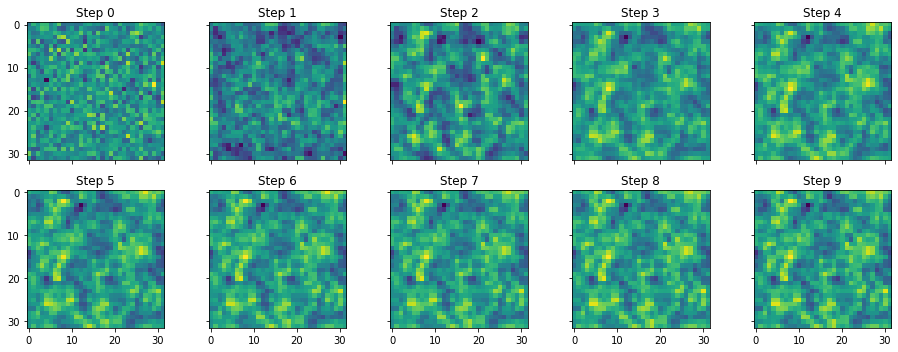

In [144]:
fig, ax = plt.subplots(2, 5, figsize=(13, 5), sharex=True, sharey=True)
for i in range(10):
    axis = ax.flatten()[i]
    axis.imshow(allpred[i][0].numpy().sum(axis=0))
    axis.set_title("Step %d"%i)

plt.tight_layout()
suff = '-imniters'
fname = './figs/L%04d_N%04d_%s%s%s'%(bs, nc, datatype, stdstring, suff)
print(fname)
# plt.savefig(fname + '.png')
# plt.savefig(fname + '.pdf')
plt.show()



# Improve RIM


In [22]:
from tensorflow.python.keras.layers import Dropout, Dense, Conv1D, Conv3D
from convolutional_recurrent import ConvLSTM3DCell

l2reg = tf.keras.regularizers.L2
l1reg = tf.keras.regularizers.L1

kedges = np.histogram(kmesh.flatten(), bins=nc)[1]
kbinmap = np.digitize(np.expand_dims(kmesh, 0), kedges, right=False).astype(int32)
kbinmap[kbinmap == kbinmap.max()] = kbinmap.max()-1
# kbinmap[:, 0, 0, 0] = 1
kbinmap -= 1
kbinmap = tf.constant(kbinmap)
kbincount = tfp.stats.count_integers(kbinmap)
kbinmapflat = tf.constant(kbinmap.numpy().flatten())

@tf.function
def tfpowerspec(x, boxsize):
    nc = x.shape[-1]
    kvec = flowpm.kernels.fftk([nc, nc, nc], symmetric=False)
    kmesh = sum((kk / boxsize * nc)**2 for kk in kvec)**0.5
    kmesh = np.expand_dims(kmesh, 0).astype(float32)
    kbinmap = np.digitize(kmesh, kedges, right=False).astype(int32)
    kbinmap[kbinmap == kbinmap.max()] = kbinmap.max()-1
    kbinmap -= 1
    kbinmap = tf.constant(kbinmap)
    kbincount = tfp.stats.count_integers(kbinmap)
    tfkmesh = tf.constant(kmesh)
    kvals = tfp.stats.count_integers(kbinmap, weights=tfkmesh) / tf.cast(kbincount, tf.float32)
    kvals = tf.repeat(tf.reshape(kvals, (1, nc)), x.shape[0], 0)
    #
    pmesh = tf.square(tf.abs(r2c3d(x, norm=nc**3)))*boxsize**3
    tfpower = tfp.stats.count_integers(tf.repeat(kbinmap, pmesh.shape[0], 0), weights=pmesh, axis=[1, 2, 3])
    tfpower = tf.reshape(tfpower, (nc, x.shape[0]))
    tfpower = tf.transpose(tfpower)/ tf.cast(kbincount, tf.float32)
    return kvals, tfpower 

@tf.function
def tfvarmap(x, kbinmap):
    nc = x.shape[-1]
    kbincount = tfp.stats.count_integers(kbinmap)
    pmesh = tf.square(tf.abs(r2c3d(x, norm=nc**3)))
    tfpower = tfp.stats.count_integers(tf.repeat(kbinmap, pmesh.shape[0], 0), weights=pmesh, axis=[1, 2, 3])
    tfpower = tf.reshape(tfpower, (nc, x.shape[0]))
    tfpower = tf.transpose(tfpower)/ tf.cast(kbincount, tf.float32)
    return  tfpower 

k, ps = tools.power(traindata[0, 0], boxsize=bs)
ktf, pstf  = tfpowerspec(traindata[:1, 0], bs)
pstf2 = tfvarmap(traindata[:1, 0], kbinmap)
# ktf, pstf  = tfpowerspec(traindata[:1, 0], bs, kbinmap)


@tf.function
def whitenps(x, ps, kbinmapflat):
    nc = x.shape[-1]
    pmesh = tf.transpose(tf.gather(tf.transpose(ps), kbinmapflat))
    pmesh = tf.reshape(pmesh, x.shape)            
    xwhite = c2r3d(r2c3d(x, norm=nc**3) / tf.cast(pmesh**0.5, tf.complex64), norm=nc**3)
    return xwhite

@tf.function
def colorps(x, ps, kbinmapflat):
    nc = x.shape[-1]
    pmesh = tf.transpose(tf.gather(tf.transpose(ps), kbinmapflat))
    pmesh = tf.reshape(pmesh, x.shape)            
    xnew = c2r3d(r2c3d(x, norm=nc**3) * tf.cast(pmesh**0.5, tf.complex64), norm=nc**3)
    return xnew

ps = tfvarmap(xx, kbinmap)
xxwhite= whitenps(xx, ps, kbinmapflat)
xxcolor = colorps(xxwhite, ps, kbinmapflat)




Add 1 to get nonzero mean of -4.657e-10


In [31]:
class myRIMHybrid(tf.keras.Model):

    def __init__(self, units, niter, kbinmap, droprate=0.05, regrate=1e-5):
        super(myRIMHybrid, self).__init__()
        self.niter = niter
        self.beta_1, self.beta_2 = 0.9, 0.999
        self.lr = 0.1
        self.eps = 1e-7
        self.kbinmap = kbinmap
        self.kbinmapflat = tf.constant(kbinmap.numpy().flatten())
        self.layers_in = [Dense(units, activation='tanh', kernel_regularizer=l2reg(regrate)) for i in range(niter)]
        self.drop_in = [Dropout(rate=droprate) for i in range(niter)]
        self.layers_out = [Dense(2*nc, activation='linear', kernel_regularizer=l2reg(regrate)) for i in range(niter)]
        self.drop_out = [Dropout(rate=droprate) for i in range(niter)]
        self.conv_in = [Conv1D(1, 1, activation='tanh') for i in range(niter)]
        self.conv_out = [Conv1D(1, 1) for i in range(niter)]
        self.conv_relu = [Conv1D(1, 1, activation='relu') for i in range(niter)]
     
        input_size, cell_size = 8, 8
#         self.input_layer = Conv3D(input_size, kernel_size=5, trainable=True, padding='SAME',
#                              input_shape=(None, nc, nc, nc, 2), activation='tanh')

#         self.cell = ConvLSTM3DCell(cell_size, kernel_size=5, padding='SAME')
#         self.cell.build(input_shape=[None, nc, nc, nc, input_size])
#         self.output_layer = Conv3D(1, kernel_size=5, trainable=True, padding='SAME', 
#                              input_shape=(None, nc, nc, nc, cell_size))

        
    def call(self, x_init, y, grad_fn, grad_args=[], initstates = None, return_steps=False, training=False):
        
        outputs_ta = tf.TensorArray(size=self.niter+1, dtype=tf.float32)
        
        if initstates is None: 
            initstates1d = tf.zeros([x_init.shape[0], nc])
#             stateshape = x_init.shape + tuple([self.cell.filters])
#             initstates3d = [tf.zeros(stateshape), tf.zeros(stateshape)]
            initstates = [initstates1d, initstates1d]
            
        i = tf.constant(0, dtype=tf.int32)
        curr_state = initstates
        curr_pos = x_init        
        m = tf.zeros_like(x_init)
        v = tf.zeros_like(x_init)
        
        def body(i, pos, states, m, v):  
            states1d, states3d = states
            
            gradient = grad_fn(pos, y, *grad_args)           
            t = tf.cast(i+1, tf.float32)
            m = self.beta_1*m + (1-self.beta_1)*gradient
            v = self.beta_2*v + (1-self.beta_2)*gradient**2
            mc = m/(1-self.beta_1**t)
            vc = v/(1-self.beta_2**t)
            delta = -1.*self.lr*mc/(tf.sqrt(vc) + self.eps)

            
            pspos = tfvarmap(pos,  self.kbinmap)
            psdelta = tfvarmap(delta,  self.kbinmap)                                                
            lpspos = tf.math.log(pspos *bs**3) / tf.math.log(10.)
            lpsdelta = tf.math.log(psdelta *bs**3) / tf.math.log(10.)

            concat_input1d = tf.concat([lpspos, lpsdelta, states1d], axis=-1)   
            x = self.conv_in[i](tf.expand_dims(concat_input1d, -1))[..., 0]
            x = self.drop_in[i](self.layers_in[i](x), training=training)
            x = self.drop_out[i](self.layers_out[i](x), training=training)
            x = self.conv_out[i](tf.expand_dims(x, -1))[..., 0]
            lpsdeltanew, new_state1d = tf.split(x, 2, axis=-1)
            psdeltanew = self.conv_relu[i](tf.expand_dims(lpsdeltanew, -1))[..., 0]
#             psdeltanew = tf.exp(lpsdeltanew) 
#             psdeltanew = tf.exp(lpsdeltanew * tf.math.log(10.)) / bs**3


#             concat_input3d = tf.stack([pos, delta], axis=-1)
#             cell_input = self.input_layer(concat_input3d)                        
#             delta_pos3d, new_state3d = self.cell(cell_input, states3d)
#             delta_pos3d = self.output_layer(delta_pos3d)[...,0]
            
            delta_pos3d, new_state3d = delta, states3d
            
            delta_pos = colorps(delta_pos3d, psdeltanew, self.kbinmap)        

            new_pos = pos + delta_pos
            new_state = [new_state1d, new_state3d]
            
            return i +1 , new_pos, new_state, m, v
        
        while tf.less(i, tf.constant(self.niter)):
            outputs_ta = outputs_ta.write(i, curr_pos)
            i, curr_pos, curr_state, m, v =  body(i, curr_pos, curr_state, m, v)
        outputs_ta = outputs_ta.write(i, curr_pos)
        return outputs_ta.stack(), curr_state 


In [32]:
rimhybrid = myRIMHybrid(units=128, niter=10, kbinmap=kbinmap)
outhd, stateshd = rimhybrid(x_init=tf.constant(xx), 
                      y=tf.constant(yy), 
                      grad_fn=rim_grad_fn, grad_args = grad_params, training=True)


In [33]:
def test_callbackhybrid():
    idx = np.random.randint(0, testdata.shape[0], 1)
    xx2, yy2 = testdata[idx, 0].astype(float32), testdata[idx, 1].astype(float32), 
#     x_init = xinitrecons_test[idx, 0]
    x_init = np.random.normal(size=xx2.size).reshape(xx2.shape).astype(float32)
    out, states = rimhybrid(x_init=tf.constant(x_init), 
                          y=tf.constant(yy2), 
                      grad_fn=rim_grad_fn, grad_args = grad_params, training=False)

            
    out = out.numpy()
    fig, ax = plt.subplots(1, 5, figsize = (20, 4))
    vmin, vmax = xx2[0].sum(axis=0).min(), xx2[0].sum(axis=0).max()
    ax[0].imshow(xx2[0].sum(axis=0), vmin=vmin, vmax=vmax)
    ax[0].set_title('Truth')
    ax[1].imshow(x_init[0].sum(axis=0), vmin=vmin, vmax=vmax)
    ax[1].set_title('initial point')
    ax[2].imshow(out[-1][0].sum(axis=0), vmin=vmin, vmax=vmax)
    ax[2].set_title('RIM 10 step')
    
    ##
    ax = ax[3:]
    k, pks = get_ps([out[-1, 0]], [xx2[0]])
    for i in range(1):
        ax[0].plot(k, pks[i][2]/(pks[i][0]*pks[i][1])**0.5, 'k-')
        ax[1].plot(k, (pks[i][0]/pks[i][1])**0.5, 'k-')
        
    toplot = [pred, pred16, pred_adam[0], pred_adam10[0], stdpred, minic]
    labels = ['RIM 8', 'RIM 16', 'ADAM', 'ADAM x10', 'Standard', 'Anneal \n(ADAM x20)']
    lss = ['-', '-', ':', ':', '-.', '--']

    for i in range(len(toplot)):
        k, ps = get_ps([toplot[i].numpy()[0] ], [xx[0]])
        if lss[i] != '-' : alpha, lw = 0.8, 2
        else: alpha, lw = 1, 1.5
        ax[0].plot(k, ps[0][2]/(ps[0][0]*ps[0][1])**0.5, label=labels[i], ls=lss[i], lw=lw, alpha=alpha)
        ax[1].plot(k, (ps[0][0]/ps[0][1])**0.5, ls=lss[i], lw=lw, alpha=alpha)

    k, ps = get_ps([fitlbfgs[0]], [datalfgs[0]])
    ax[0].plot(k, ps[0][2]/(ps[0][0]*ps[0][1])**0.5, label='Anneal \n(LBFGS x10)', ls="--")
    ax[1].plot(k, (ps[0][0]/ps[0][1])**0.5, ls="--")

    for axis in ax: 
        axis.semilogx()
        axis.grid(which='both')
    ax[0].set_ylim(-0.1, 1.1)
    ax[1].set_ylim(-0.2, 2.1)
    plt.show()
    plt.close()

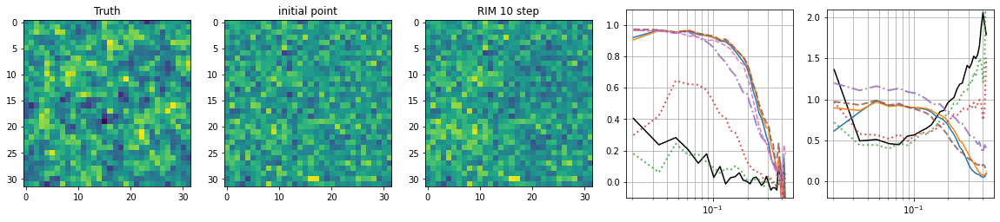

In [36]:
test_callbackhybrid()

## Train

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/mnt/home/cmodi/miniconda3/envs/defpyn/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3438, in run_code
    return outflag  File "<ipython-input-26-b3479f302c58>", line 2, in <module>
    outhd, stateshd = rimhybrid(x_init=tf.constant(xx),  File "/mnt/home/cmodi/miniconda3/envs/defpyn/lib/python3.8/site-packages/tensorflow/python/keras/engine/base_layer.py", line 994, in __call__
    return outputs  File "<ipython-input-25-ca3a6cae633c>", line 90, in call
    i, curr_pos, curr_state, m, v =  body(i, curr_pos, curr_state, m, v)  File "/mnt/home/cmodi/miniconda3/envs/defpyn/lib/python3.8/site-packages/tensorflow/python/util/tf_should_use.py", line 247, in wrapped
    return _add_should_use_warning(fn(*args, **kwargs),
Learning

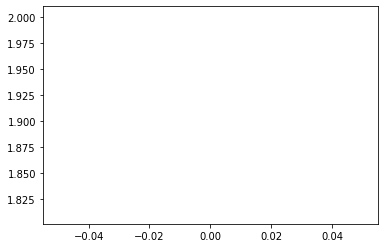

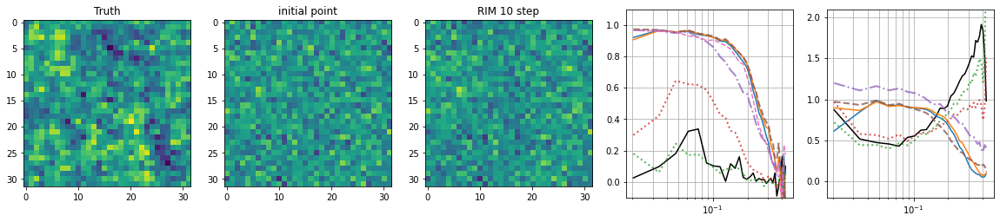

Time taken for 5 iterations :  9.52690839767456
Loss at iteration 5 :  1.868707
Time taken for 5 iterations :  8.22973346710205
Loss at iteration 10 :  1.8497299
Time taken for 5 iterations :  8.20731496810913
Loss at iteration 15 :  1.8345379
Time taken for 5 iterations :  8.157703638076782
Loss at iteration 20 :  1.8120631


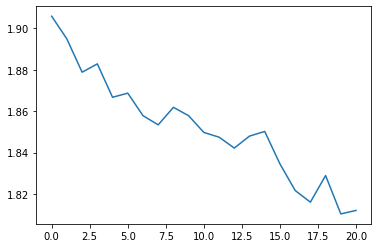

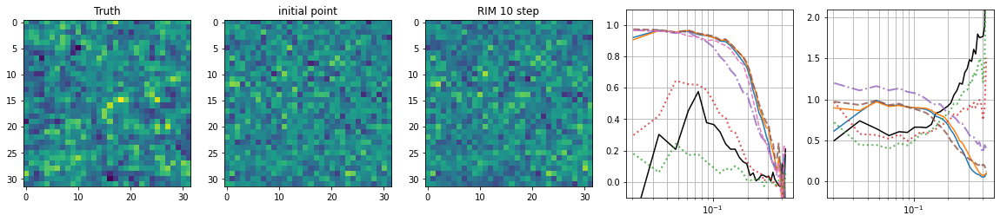

Time taken for 5 iterations :  9.327107667922974
Loss at iteration 25 :  1.8006574
Time taken for 5 iterations :  8.110826015472412
Loss at iteration 30 :  1.7910768
Time taken for 5 iterations :  8.114394187927246
Loss at iteration 35 :  1.7911117
Time taken for 5 iterations :  8.143302917480469
Loss at iteration 40 :  1.7826557


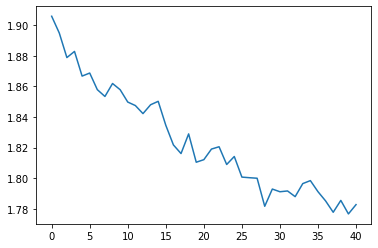

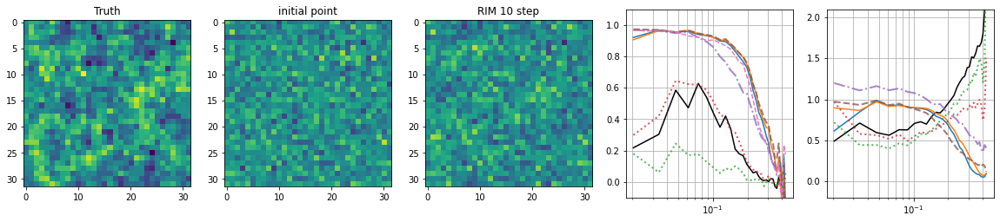

Time taken for 5 iterations :  9.51815676689148
Loss at iteration 45 :  1.7803428
Time taken for 5 iterations :  8.011609077453613
Loss at iteration 50 :  1.7747302
Time taken for 5 iterations :  8.057801961898804
Loss at iteration 55 :  1.756516
Time taken for 5 iterations :  8.06860637664795
Loss at iteration 60 :  1.760614


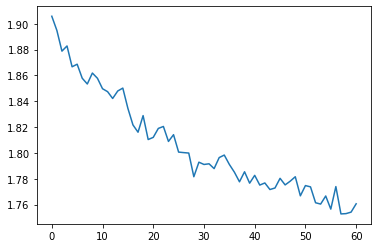

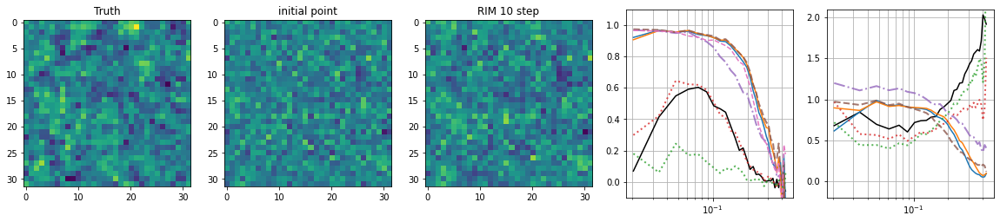

Time taken for 5 iterations :  9.255502700805664
Loss at iteration 65 :  1.7496471
Time taken for 5 iterations :  8.088836669921875
Loss at iteration 70 :  1.7568791
Time taken for 5 iterations :  8.133141279220581
Loss at iteration 75 :  1.7502575
Time taken for 5 iterations :  8.150893688201904
Loss at iteration 80 :  1.7506496


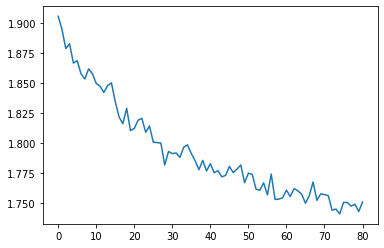

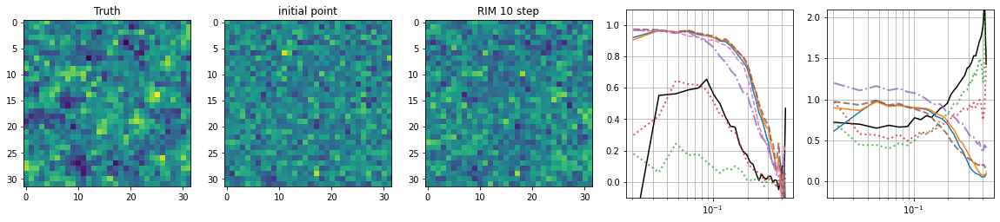

Time taken for 5 iterations :  9.177157163619995
Loss at iteration 85 :  1.7286339
Time taken for 5 iterations :  8.539149045944214
Loss at iteration 90 :  1.7368405
Time taken for 5 iterations :  8.146239519119263
Loss at iteration 95 :  1.7408694
Time taken for 5 iterations :  8.017924785614014
Loss at iteration 100 :  1.7308319


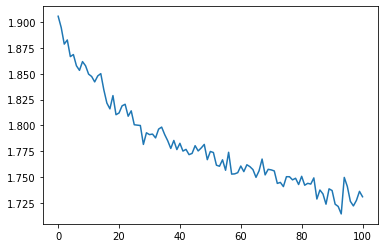

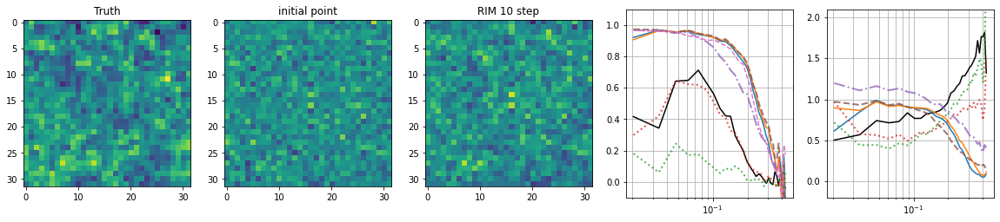

Time taken for 5 iterations :  9.13071870803833
Loss at iteration 105 :  1.7223324
Time taken for 5 iterations :  8.089423894882202
Loss at iteration 110 :  1.7190427
Time taken for 5 iterations :  8.047096967697144
Loss at iteration 115 :  1.7218413
Time taken for 5 iterations :  8.110715866088867
Loss at iteration 120 :  1.7177517


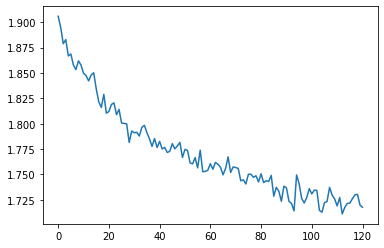

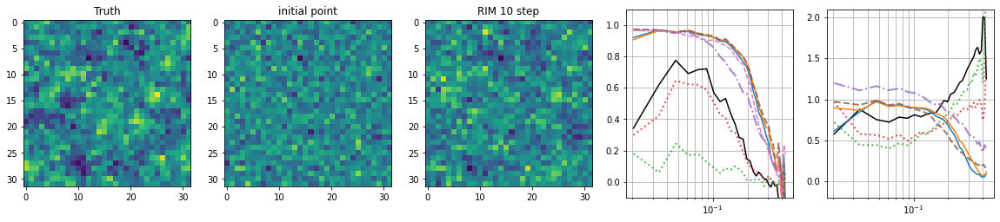

Time taken for 5 iterations :  9.227207899093628
Loss at iteration 125 :  1.7061673
Time taken for 5 iterations :  8.037765264511108
Loss at iteration 130 :  1.7056427
Time taken for 5 iterations :  7.950396537780762
Loss at iteration 135 :  1.7129598
Time taken for 5 iterations :  8.356086015701294
Loss at iteration 140 :  1.7072155


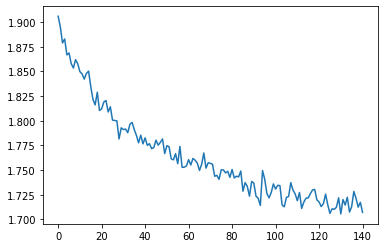

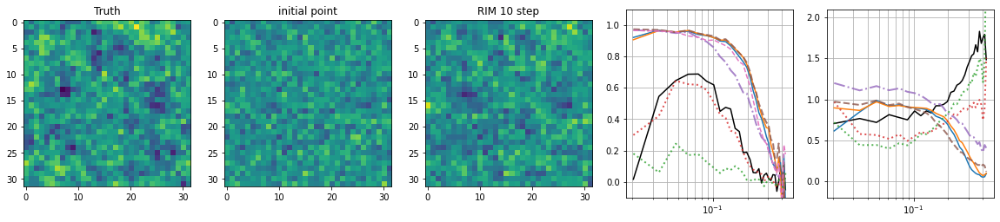

Time taken for 5 iterations :  9.154170036315918
Loss at iteration 145 :  1.7108392
Time taken for 5 iterations :  8.069940090179443
Loss at iteration 150 :  1.7146988
Time taken for 5 iterations :  8.31977891921997
Loss at iteration 155 :  1.7131455
Time taken for 5 iterations :  8.135002374649048
Loss at iteration 160 :  1.715556


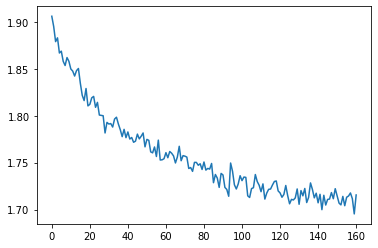

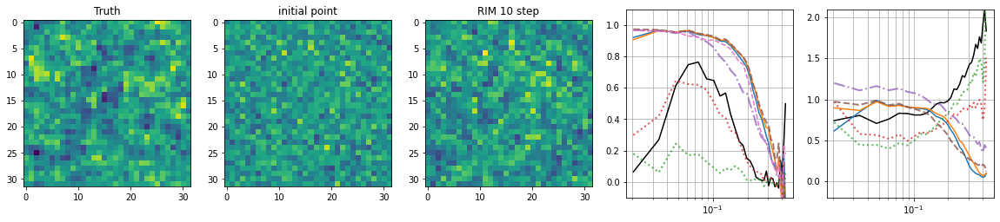

Time taken for 5 iterations :  9.165492057800293
Loss at iteration 165 :  1.7031814
Time taken for 5 iterations :  8.030823230743408
Loss at iteration 170 :  1.7141114
Time taken for 5 iterations :  7.9993040561676025
Loss at iteration 175 :  1.7136891
Time taken for 5 iterations :  8.34404444694519
Loss at iteration 180 :  1.7042176


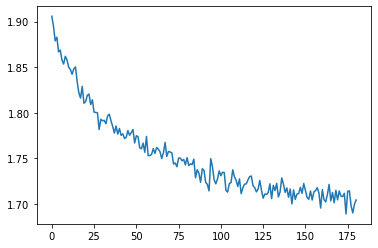

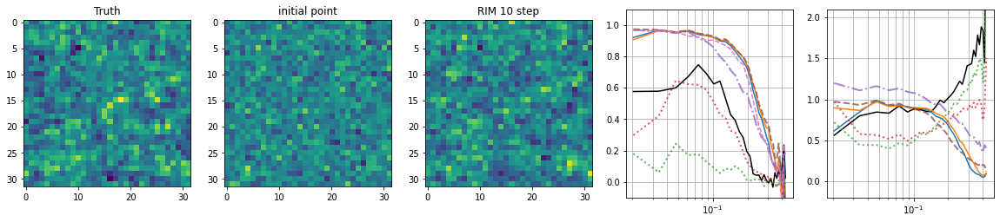

Time taken for 5 iterations :  9.25149154663086
Loss at iteration 185 :  1.7107159
Time taken for 5 iterations :  8.004201173782349
Loss at iteration 190 :  1.697594
Time taken for 5 iterations :  8.155031204223633
Loss at iteration 195 :  1.7108645
Time taken for 5 iterations :  8.018277883529663
Loss at iteration 200 :  1.7055359


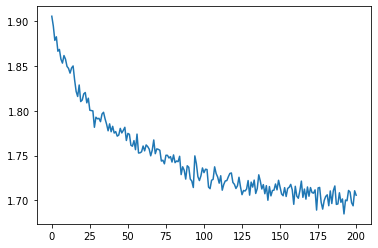

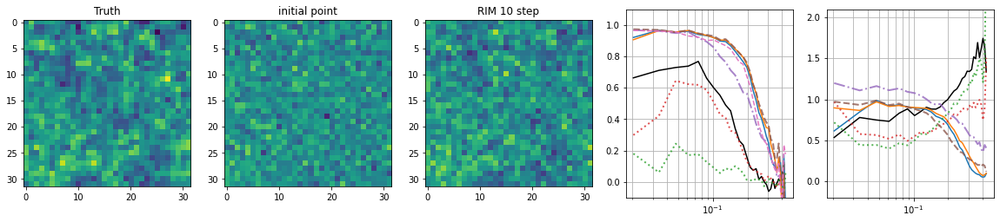

Learning rate = 5.000e-04
Time taken for 5 iterations :  2.853132963180542
Loss at iteration 0 :  1.7078044


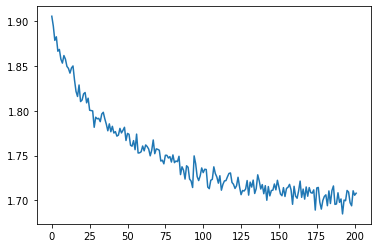

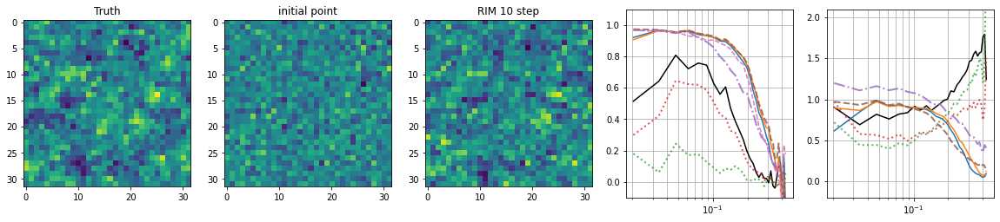

Time taken for 5 iterations :  9.21584439277649
Loss at iteration 5 :  1.6979216
Time taken for 5 iterations :  8.027190923690796
Loss at iteration 10 :  1.7152743
Time taken for 5 iterations :  8.595015287399292
Loss at iteration 15 :  1.6942208
Time taken for 5 iterations :  8.081018209457397
Loss at iteration 20 :  1.6812385


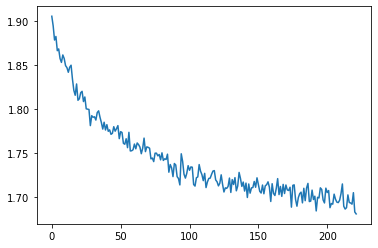

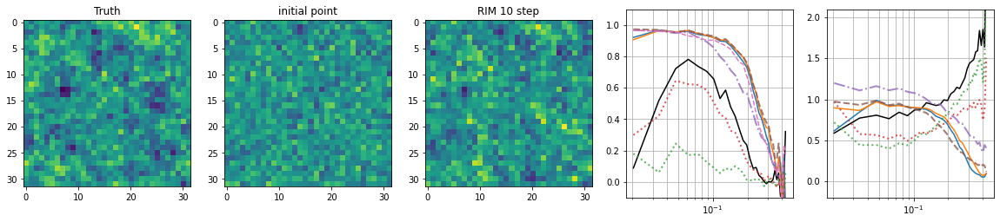

Time taken for 5 iterations :  9.133221864700317
Loss at iteration 25 :  1.6989936
Time taken for 5 iterations :  8.036221265792847
Loss at iteration 30 :  1.6891911
Time taken for 5 iterations :  8.041679620742798
Loss at iteration 35 :  1.7014133
Time taken for 5 iterations :  8.069380283355713
Loss at iteration 40 :  1.6843357


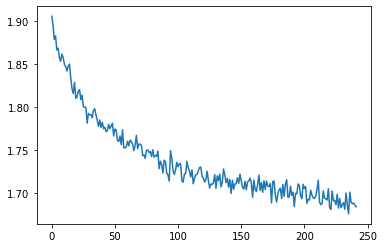

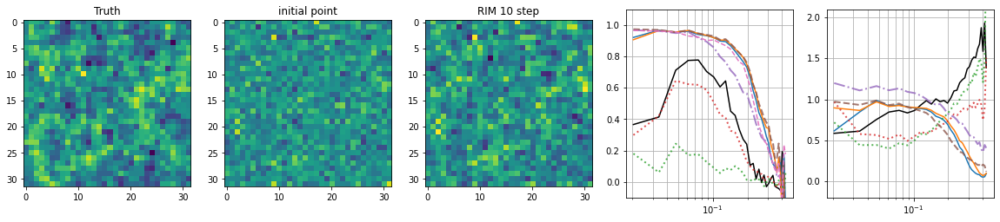

Time taken for 5 iterations :  9.170744180679321
Loss at iteration 45 :  1.7023269
Time taken for 5 iterations :  7.871874809265137
Loss at iteration 50 :  1.6782273
Time taken for 5 iterations :  8.024539232254028
Loss at iteration 55 :  1.683832
Time taken for 5 iterations :  8.317694187164307
Loss at iteration 60 :  1.685163


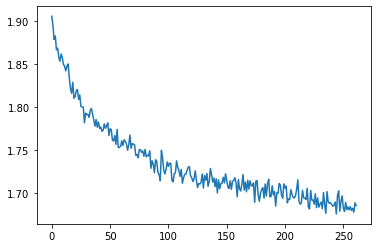

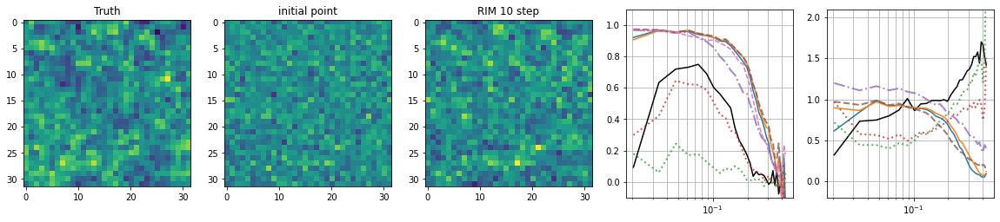

Time taken for 5 iterations :  9.18851923942566
Loss at iteration 65 :  1.6908727
Time taken for 5 iterations :  8.059813737869263
Loss at iteration 70 :  1.6865735
Time taken for 5 iterations :  8.152069330215454
Loss at iteration 75 :  1.6829213
Time taken for 5 iterations :  7.962967395782471
Loss at iteration 80 :  1.6831142


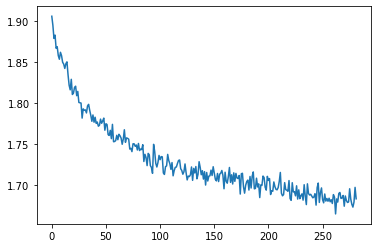

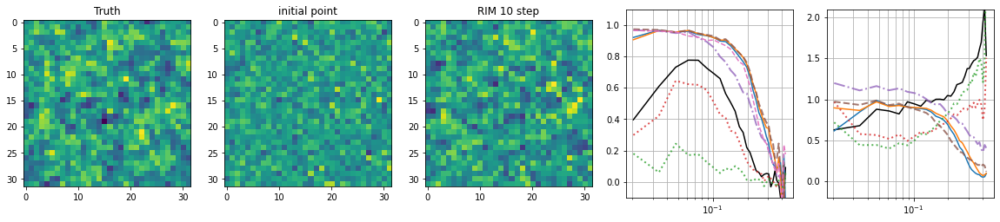

Time taken for 5 iterations :  9.112221240997314
Loss at iteration 85 :  1.6703202
Time taken for 5 iterations :  8.014545440673828
Loss at iteration 90 :  1.6704253
Time taken for 5 iterations :  8.180182695388794
Loss at iteration 95 :  1.6837918
Time taken for 5 iterations :  8.113187074661255
Loss at iteration 100 :  1.6852927


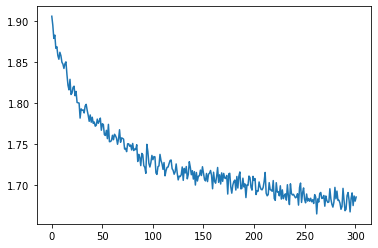

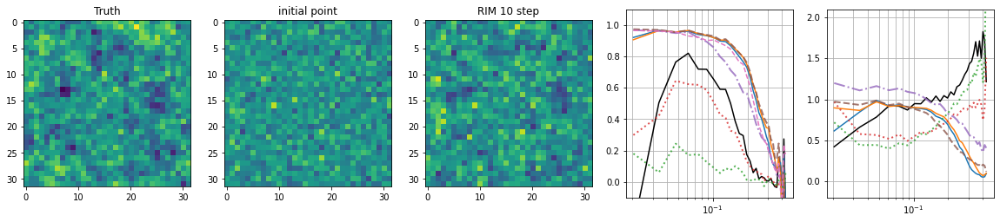

Time taken for 5 iterations :  9.472886323928833
Loss at iteration 105 :  1.6808479
Time taken for 5 iterations :  8.188974380493164
Loss at iteration 110 :  1.676897
Time taken for 5 iterations :  8.1526460647583
Loss at iteration 115 :  1.6673374
Time taken for 5 iterations :  8.02262258529663
Loss at iteration 120 :  1.6770282


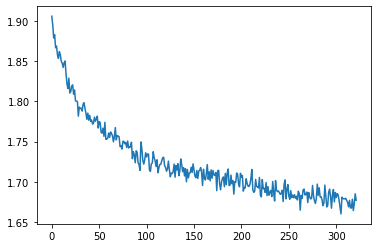

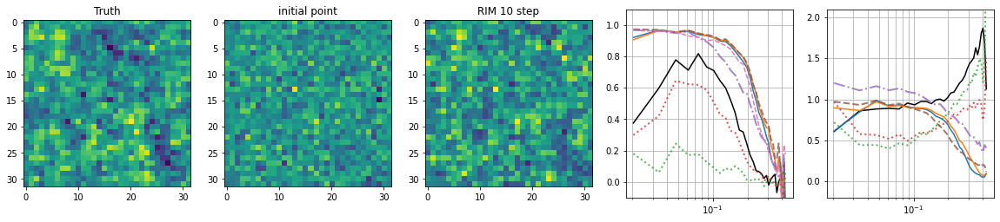

Time taken for 5 iterations :  9.337016105651855
Loss at iteration 125 :  1.6820065
Time taken for 5 iterations :  8.065196990966797
Loss at iteration 130 :  1.682502
Time taken for 5 iterations :  8.10962986946106
Loss at iteration 135 :  1.6617373
Time taken for 5 iterations :  8.116608619689941
Loss at iteration 140 :  1.672825


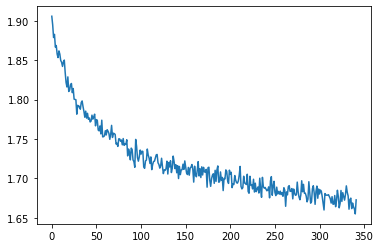

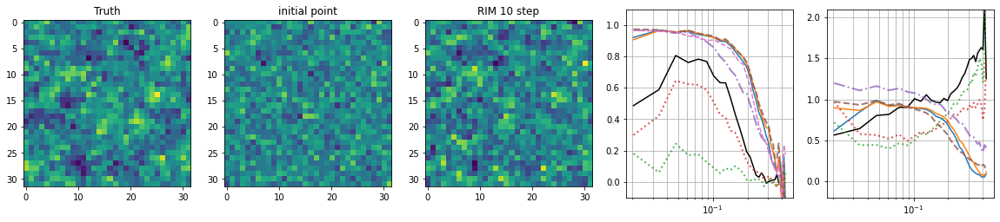

Time taken for 5 iterations :  9.397599220275879
Loss at iteration 145 :  1.6669041
Time taken for 5 iterations :  8.15466594696045
Loss at iteration 150 :  1.664062
Time taken for 5 iterations :  8.037397861480713
Loss at iteration 155 :  1.6654007
Time taken for 5 iterations :  8.03612732887268
Loss at iteration 160 :  1.6679271


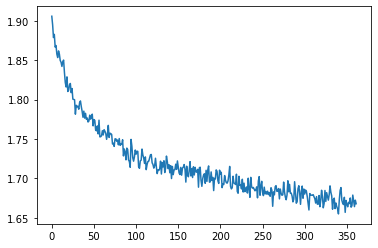

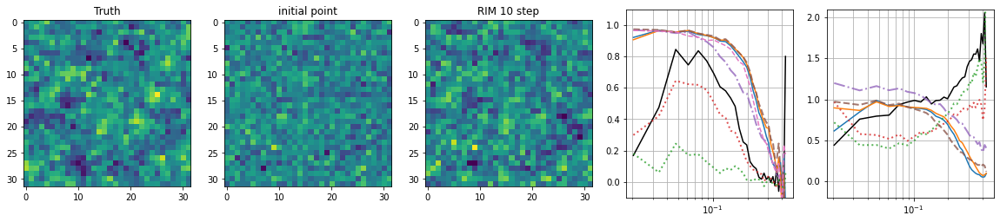

Time taken for 5 iterations :  9.299425840377808
Loss at iteration 165 :  1.6770366
Time taken for 5 iterations :  8.082979440689087
Loss at iteration 170 :  1.6663463
Time taken for 5 iterations :  8.012958765029907
Loss at iteration 175 :  1.6716247
Time taken for 5 iterations :  8.057741403579712
Loss at iteration 180 :  1.6601962


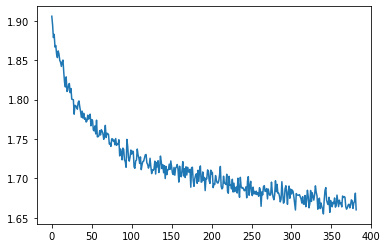

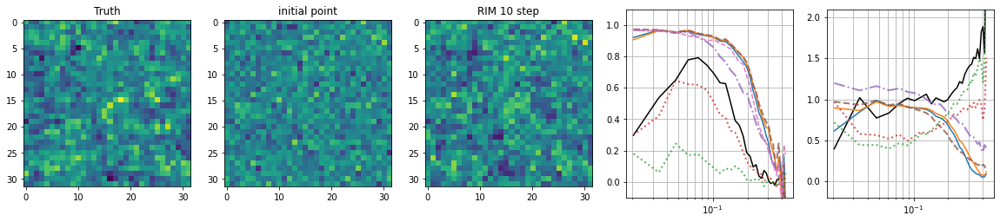

Time taken for 5 iterations :  9.16197919845581
Loss at iteration 185 :  1.6690636
Time taken for 5 iterations :  8.446597337722778
Loss at iteration 190 :  1.6695874
Time taken for 5 iterations :  8.120338678359985
Loss at iteration 195 :  1.6709683
Time taken for 5 iterations :  8.059617757797241
Loss at iteration 200 :  1.6674613


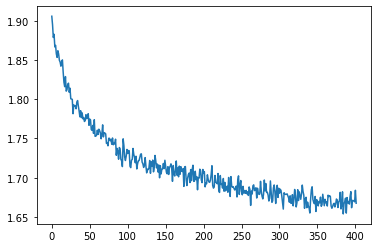

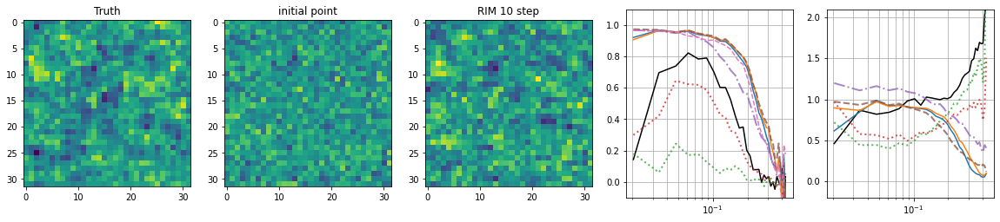

Time taken for 5 iterations :  9.242574214935303
Loss at iteration 205 :  1.6648018
Time taken for 5 iterations :  8.125329971313477
Loss at iteration 210 :  1.6527984
Time taken for 5 iterations :  8.089214563369751
Loss at iteration 215 :  1.6657796
Time taken for 5 iterations :  8.071457862854004
Loss at iteration 220 :  1.6579273


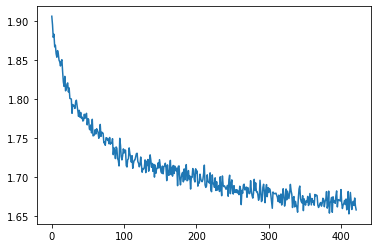

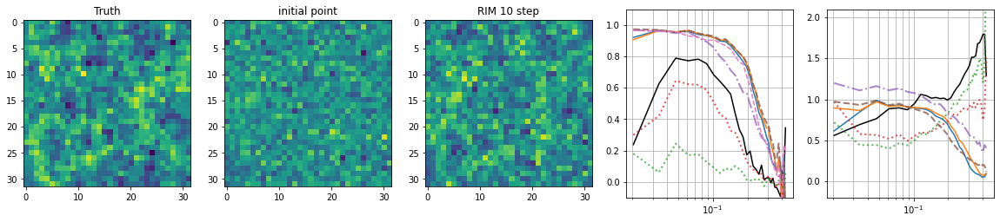

Time taken for 5 iterations :  9.169908285140991
Loss at iteration 225 :  1.6693298
Time taken for 5 iterations :  8.150324821472168
Loss at iteration 230 :  1.6589203
Time taken for 5 iterations :  8.043622732162476
Loss at iteration 235 :  1.6745842
Time taken for 5 iterations :  8.462760925292969
Loss at iteration 240 :  1.662254


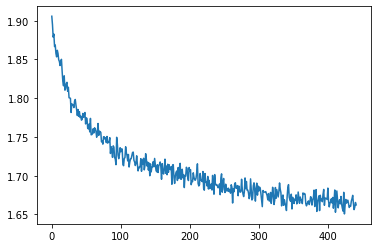

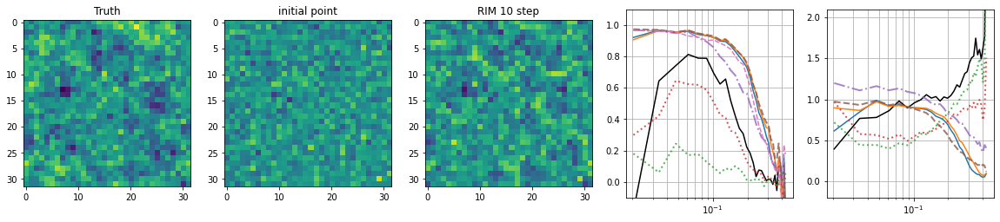

Time taken for 5 iterations :  9.347698450088501
Loss at iteration 245 :  1.6648498
Time taken for 5 iterations :  8.044359922409058
Loss at iteration 250 :  1.6664417
Time taken for 5 iterations :  8.070558309555054
Loss at iteration 255 :  1.6681194
Time taken for 5 iterations :  8.046388864517212
Loss at iteration 260 :  1.6690365


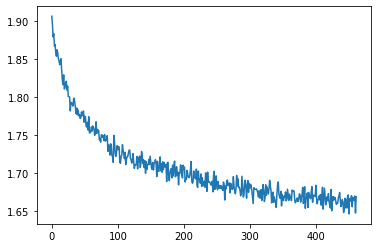

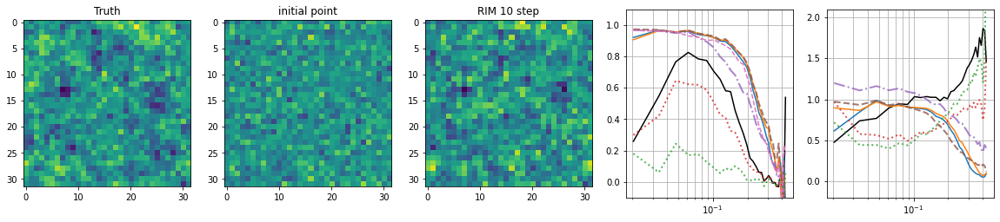

Time taken for 5 iterations :  9.267404079437256
Loss at iteration 265 :  1.660329
Time taken for 5 iterations :  8.065788269042969
Loss at iteration 270 :  1.6608535
Time taken for 5 iterations :  7.993794918060303
Loss at iteration 275 :  1.6627601
Time taken for 5 iterations :  8.30330491065979
Loss at iteration 280 :  1.6620678


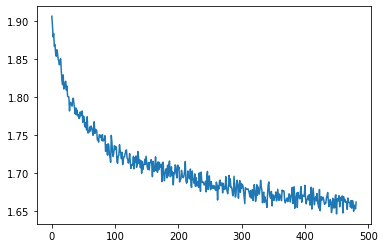

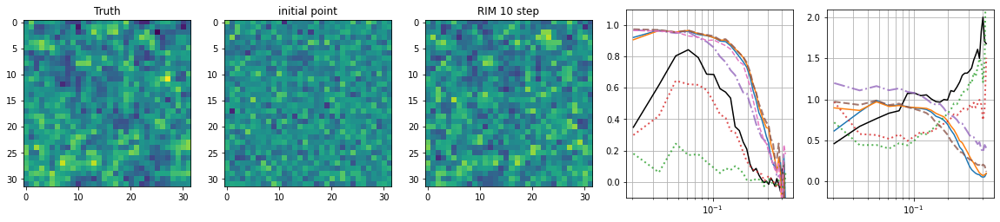

Time taken for 5 iterations :  9.149555683135986
Loss at iteration 285 :  1.6616184
Time taken for 5 iterations :  8.054633855819702
Loss at iteration 290 :  1.6540093
Time taken for 5 iterations :  8.03934931755066
Loss at iteration 295 :  1.6608051
Time taken for 5 iterations :  8.108865022659302
Loss at iteration 300 :  1.6555034


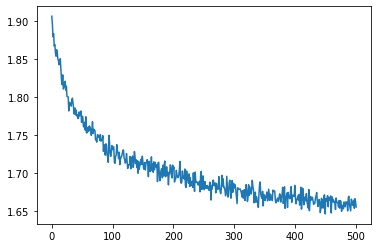

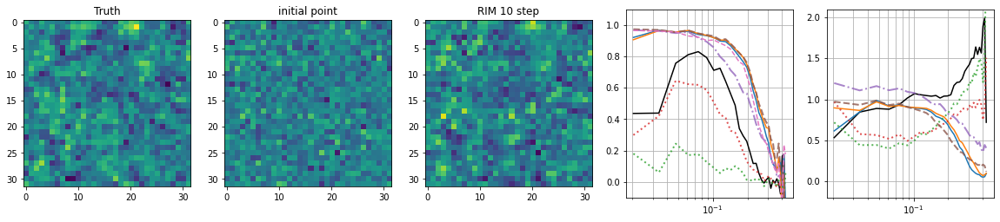

Time taken for 5 iterations :  9.299971580505371
Loss at iteration 305 :  1.6558048
Time taken for 5 iterations :  8.03450083732605
Loss at iteration 310 :  1.6576076
Time taken for 5 iterations :  7.9964611530303955
Loss at iteration 315 :  1.6491746
Time taken for 5 iterations :  8.053035497665405
Loss at iteration 320 :  1.64925


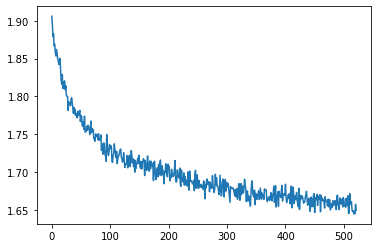

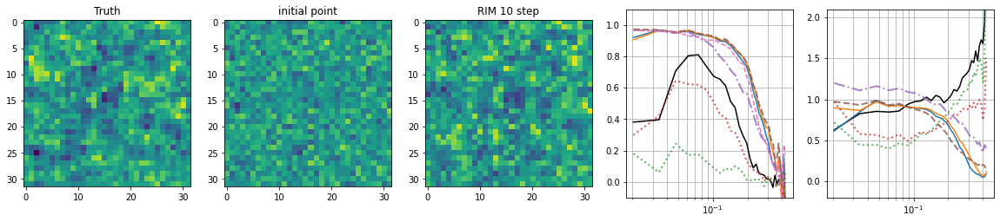

Time taken for 5 iterations :  9.492263317108154
Loss at iteration 325 :  1.6681142
Time taken for 5 iterations :  7.991947650909424
Loss at iteration 330 :  1.6540809
Time taken for 5 iterations :  8.048910856246948
Loss at iteration 335 :  1.6563084
Time taken for 5 iterations :  8.10639238357544
Loss at iteration 340 :  1.6567875


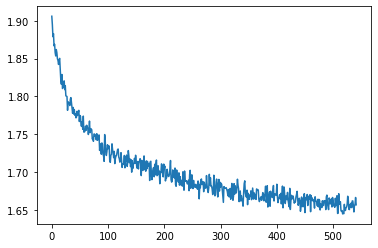

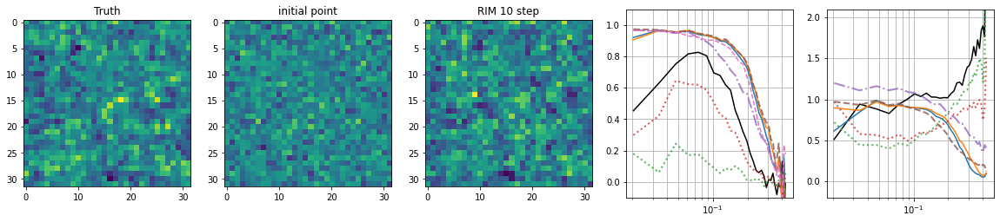

Time taken for 5 iterations :  9.146530628204346
Loss at iteration 345 :  1.6514121
Time taken for 5 iterations :  7.943531513214111
Loss at iteration 350 :  1.6584218
Time taken for 5 iterations :  8.074158668518066
Loss at iteration 355 :  1.6608453
Time taken for 5 iterations :  8.030586004257202
Loss at iteration 360 :  1.6507001


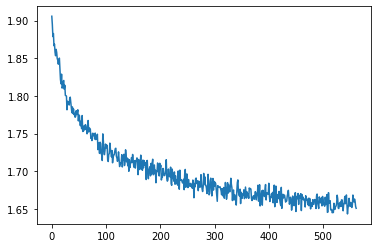

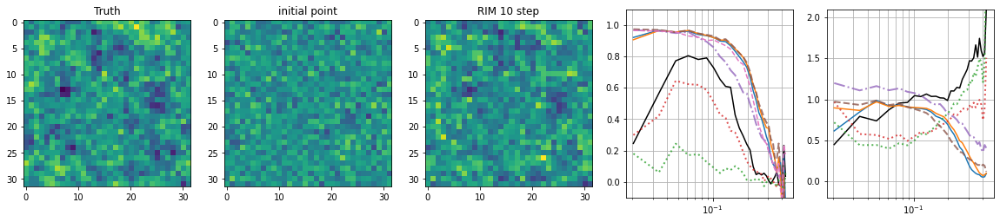

Time taken for 5 iterations :  9.512026071548462
Loss at iteration 365 :  1.6437938
Time taken for 5 iterations :  8.185020923614502
Loss at iteration 370 :  1.66227
Time taken for 5 iterations :  8.070766925811768
Loss at iteration 375 :  1.6576797
Time taken for 5 iterations :  8.210930824279785
Loss at iteration 380 :  1.6553776


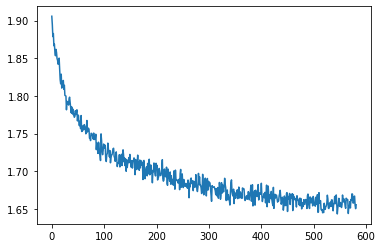

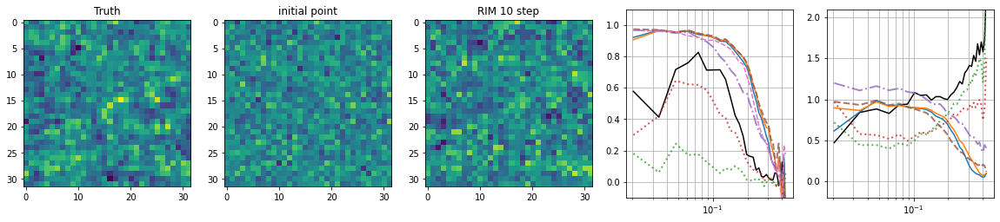

Time taken for 5 iterations :  9.425694227218628
Loss at iteration 385 :  1.6573306
Time taken for 5 iterations :  7.967637777328491
Loss at iteration 390 :  1.6645585
Time taken for 5 iterations :  7.945048809051514
Loss at iteration 395 :  1.6576638
Time taken for 5 iterations :  8.092206239700317
Loss at iteration 400 :  1.663947


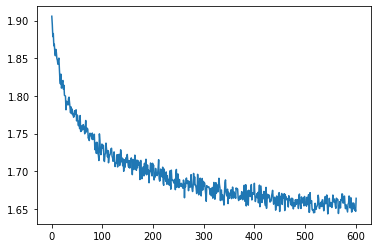

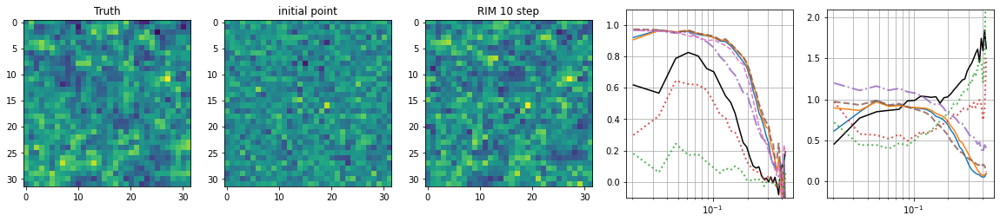

Time taken for 5 iterations :  9.252800703048706
Loss at iteration 405 :  1.6445557
Time taken for 5 iterations :  8.373482704162598
Loss at iteration 410 :  1.64059
Time taken for 5 iterations :  8.166035413742065
Loss at iteration 415 :  1.6486386
Time taken for 5 iterations :  8.066761255264282
Loss at iteration 420 :  1.6453545


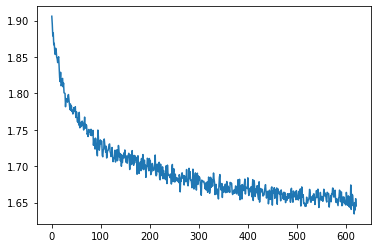

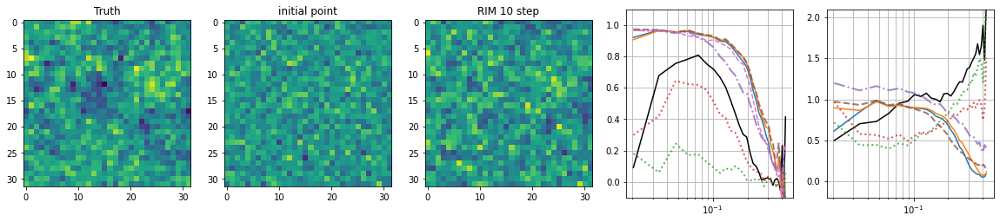

Time taken for 5 iterations :  9.234766006469727
Loss at iteration 425 :  1.6540756
Time taken for 5 iterations :  8.067710876464844
Loss at iteration 430 :  1.6533253
Time taken for 5 iterations :  8.038630485534668
Loss at iteration 435 :  1.670644
Time taken for 5 iterations :  8.050939559936523
Loss at iteration 440 :  1.6483674


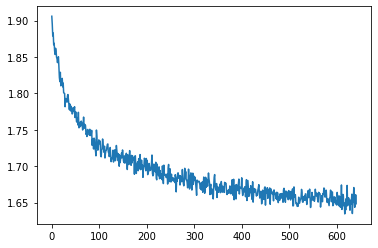

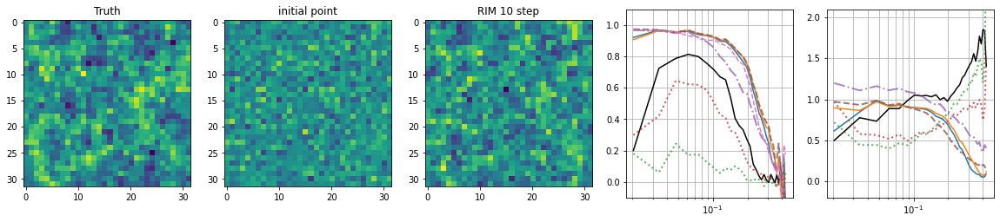

Time taken for 5 iterations :  9.298604249954224
Loss at iteration 445 :  1.6361636
Time taken for 5 iterations :  8.131470203399658
Loss at iteration 450 :  1.6534371
Time taken for 5 iterations :  8.084324836730957
Loss at iteration 455 :  1.6493325
Time taken for 5 iterations :  8.348735809326172
Loss at iteration 460 :  1.6515746


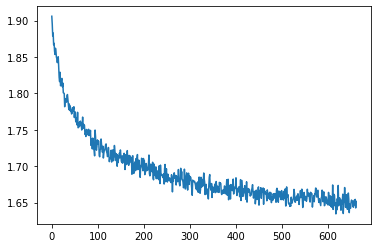

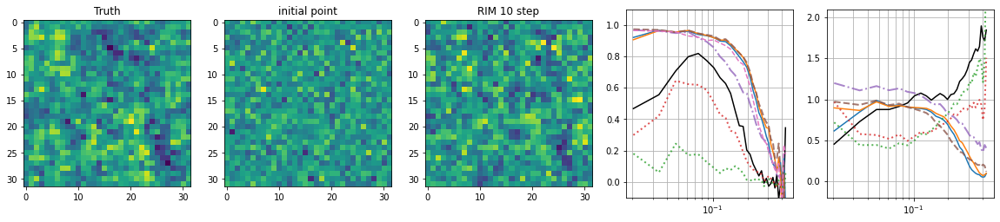

Time taken for 5 iterations :  9.136471271514893
Loss at iteration 465 :  1.6620091
Time taken for 5 iterations :  8.157947778701782
Loss at iteration 470 :  1.6463752
Time taken for 5 iterations :  7.999301433563232
Loss at iteration 475 :  1.6560696
Time taken for 5 iterations :  8.048692226409912
Loss at iteration 480 :  1.6521338


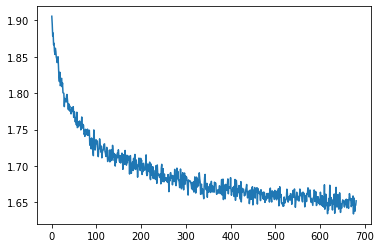

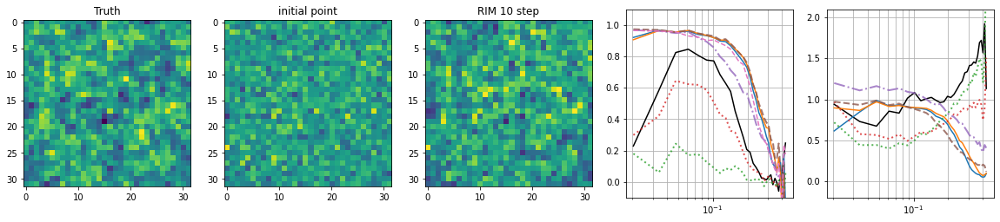

Time taken for 5 iterations :  9.1352219581604
Loss at iteration 485 :  1.6354992
Time taken for 5 iterations :  8.189275026321411
Loss at iteration 490 :  1.6489984
Time taken for 5 iterations :  8.046848773956299
Loss at iteration 495 :  1.6431278
Time taken for 5 iterations :  8.314073085784912
Loss at iteration 500 :  1.6507348


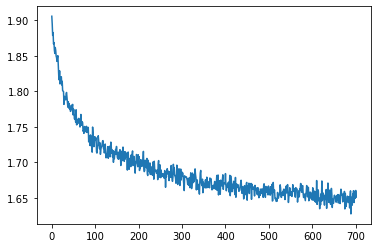

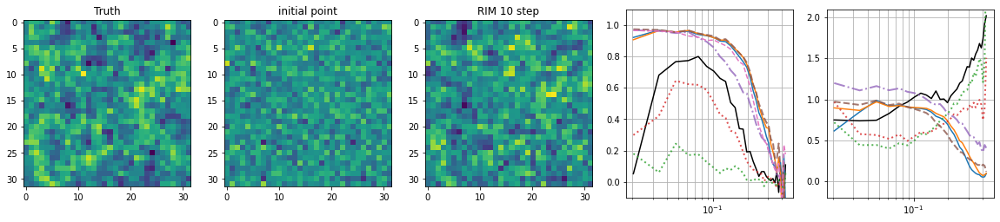

Learning rate = 1.000e-04
Time taken for 5 iterations :  2.91341233253479
Loss at iteration 0 :  1.6486256


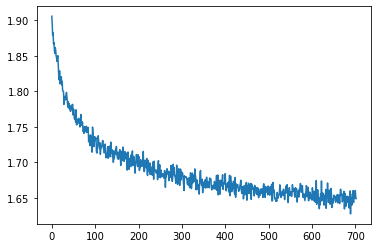

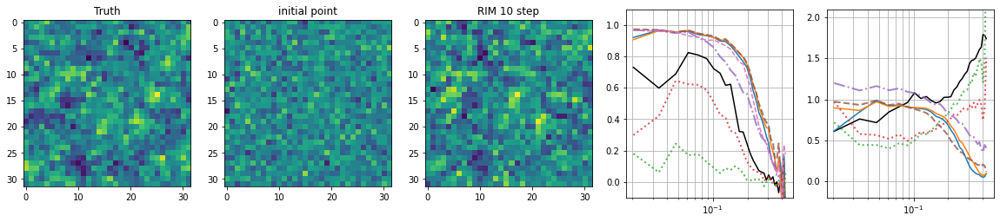

Time taken for 5 iterations :  9.182560682296753
Loss at iteration 5 :  1.6530429
Time taken for 5 iterations :  8.05542802810669
Loss at iteration 10 :  1.6497861
Time taken for 5 iterations :  8.055371284484863
Loss at iteration 15 :  1.6514012
Time taken for 5 iterations :  8.085407733917236
Loss at iteration 20 :  1.6426487


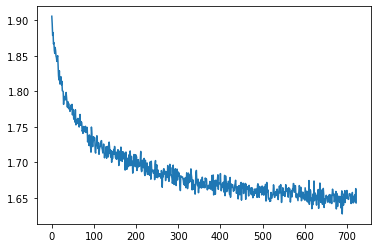

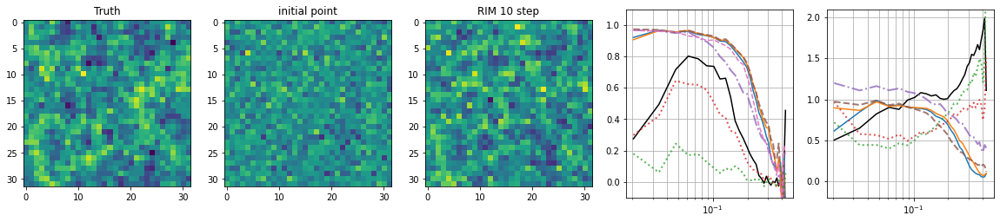

Time taken for 5 iterations :  9.29891300201416
Loss at iteration 25 :  1.658004
Time taken for 5 iterations :  8.156805753707886
Loss at iteration 30 :  1.6464162
Time taken for 5 iterations :  8.509468078613281
Loss at iteration 35 :  1.6375117
Time taken for 5 iterations :  8.117111206054688
Loss at iteration 40 :  1.658469


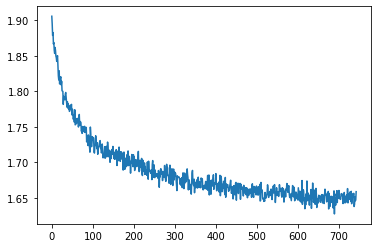

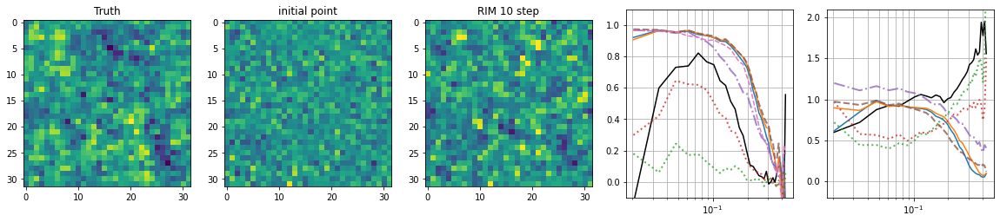

Time taken for 5 iterations :  9.276678800582886
Loss at iteration 45 :  1.6597486
Time taken for 5 iterations :  8.132558584213257
Loss at iteration 50 :  1.6693032
Time taken for 5 iterations :  8.01388931274414
Loss at iteration 55 :  1.6445087
Time taken for 5 iterations :  8.111587047576904
Loss at iteration 60 :  1.6529797


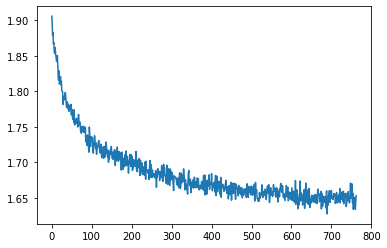

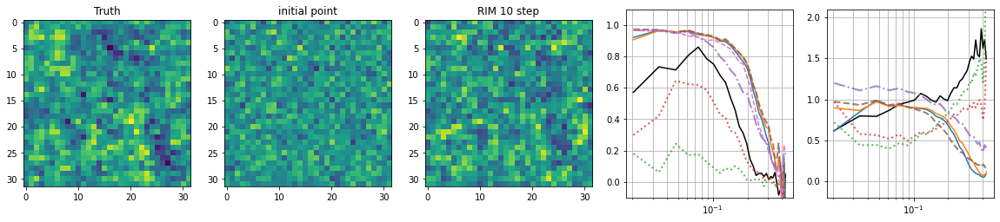

Time taken for 5 iterations :  9.315660953521729
Loss at iteration 65 :  1.660077
Time taken for 5 iterations :  8.086728572845459
Loss at iteration 70 :  1.6473689
Time taken for 5 iterations :  8.113476037979126
Loss at iteration 75 :  1.6458347
Time taken for 5 iterations :  8.331346035003662
Loss at iteration 80 :  1.658924


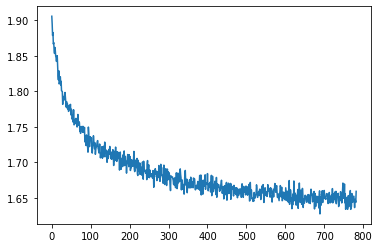

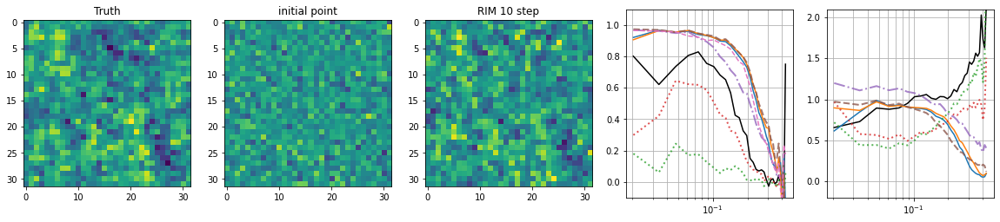

Time taken for 5 iterations :  9.155666828155518
Loss at iteration 85 :  1.6536441
Time taken for 5 iterations :  8.113988876342773
Loss at iteration 90 :  1.6481982
Time taken for 5 iterations :  8.05482292175293
Loss at iteration 95 :  1.6288838
Time taken for 5 iterations :  8.14824652671814
Loss at iteration 100 :  1.6591817


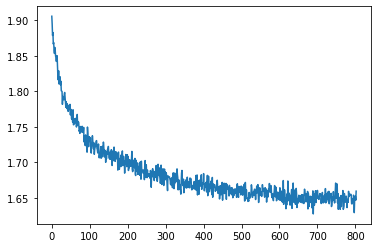

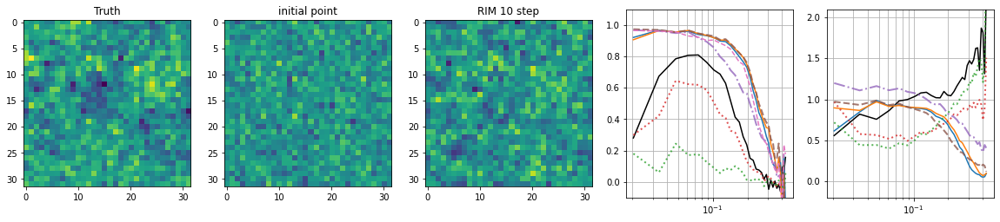

Time taken for 5 iterations :  9.24260425567627
Loss at iteration 105 :  1.640148
Time taken for 5 iterations :  8.050781965255737
Loss at iteration 110 :  1.6520019
Time taken for 5 iterations :  8.0608651638031
Loss at iteration 115 :  1.6458824
Time taken for 5 iterations :  8.073934555053711
Loss at iteration 120 :  1.6540737


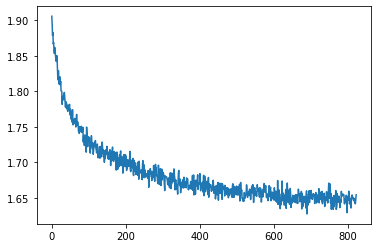

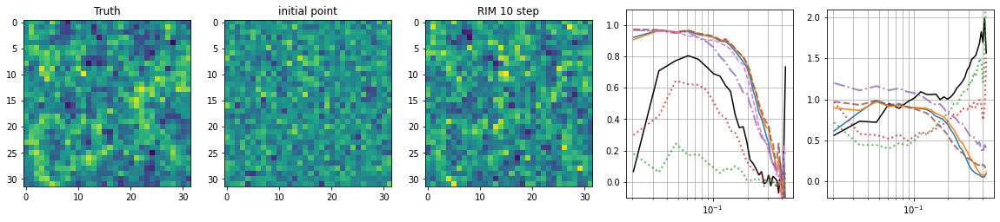

Time taken for 5 iterations :  9.588788747787476
Loss at iteration 125 :  1.6457378
Time taken for 5 iterations :  8.019269227981567
Loss at iteration 130 :  1.6320118
Time taken for 5 iterations :  8.018954038619995
Loss at iteration 135 :  1.6471924
Time taken for 5 iterations :  8.078591108322144
Loss at iteration 140 :  1.6396028


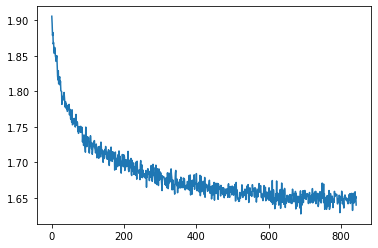

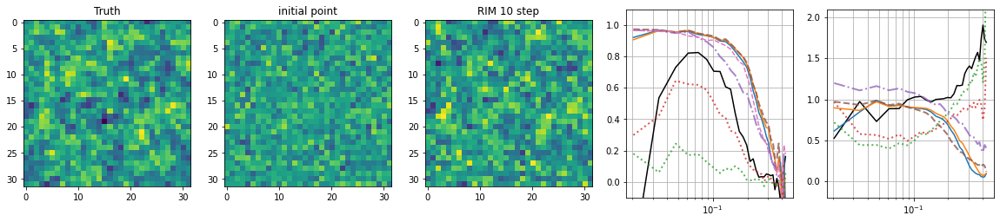

Time taken for 5 iterations :  9.224798202514648
Loss at iteration 145 :  1.6440494
Time taken for 5 iterations :  8.049643754959106
Loss at iteration 150 :  1.6404821
Time taken for 5 iterations :  8.142521381378174
Loss at iteration 155 :  1.6434104
Time taken for 5 iterations :  8.004742622375488
Loss at iteration 160 :  1.6470231


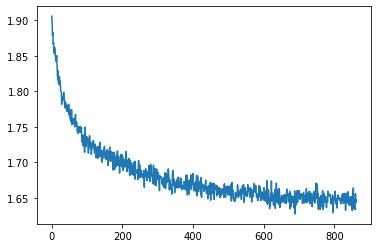

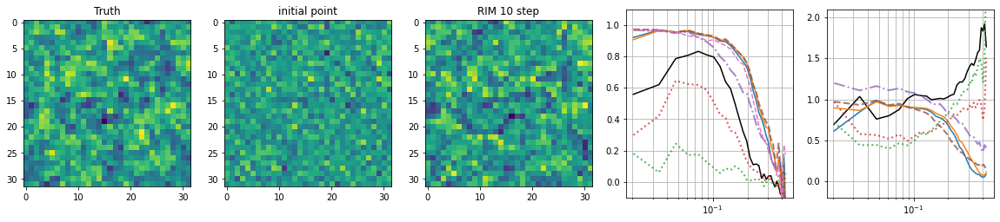

Time taken for 5 iterations :  9.463619232177734
Loss at iteration 165 :  1.6433848
Time taken for 5 iterations :  8.050477266311646
Loss at iteration 170 :  1.6460553
Time taken for 5 iterations :  8.155942440032959
Loss at iteration 175 :  1.6555226
Time taken for 5 iterations :  8.071272611618042
Loss at iteration 180 :  1.6450355


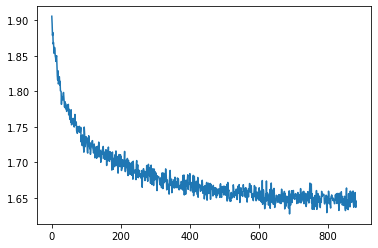

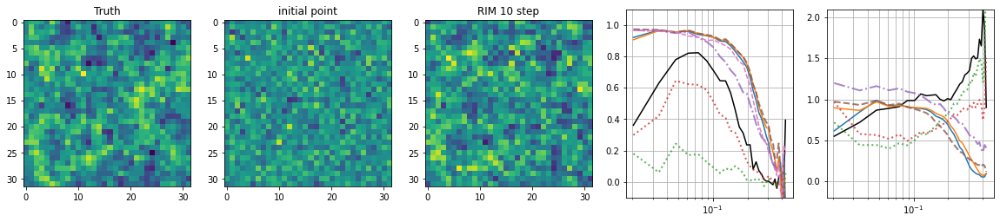

Time taken for 5 iterations :  9.171365737915039
Loss at iteration 185 :  1.6482804
Time taken for 5 iterations :  8.075064659118652
Loss at iteration 190 :  1.6414464
Time taken for 5 iterations :  7.992200613021851
Loss at iteration 195 :  1.6559105
Time taken for 5 iterations :  8.072778224945068
Loss at iteration 200 :  1.6507033


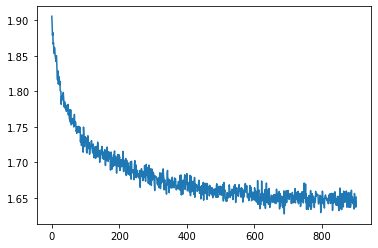

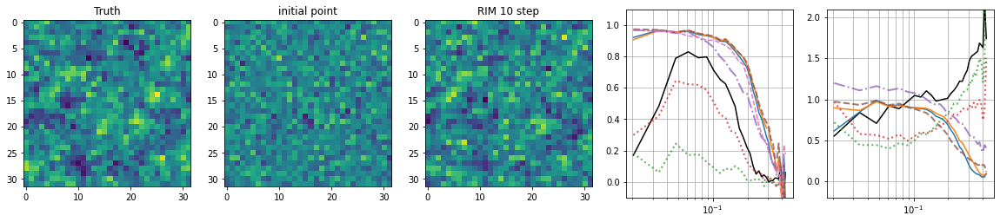

Time taken for 5 iterations :  9.208343267440796
Loss at iteration 205 :  1.6435084
Time taken for 5 iterations :  8.374529123306274
Loss at iteration 210 :  1.65736
Time taken for 5 iterations :  8.191616296768188
Loss at iteration 215 :  1.6534957
Time taken for 5 iterations :  8.125929117202759
Loss at iteration 220 :  1.6483468


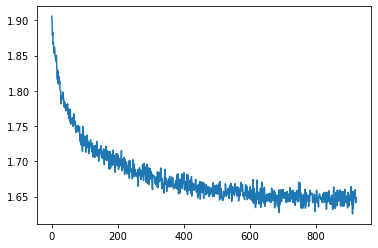

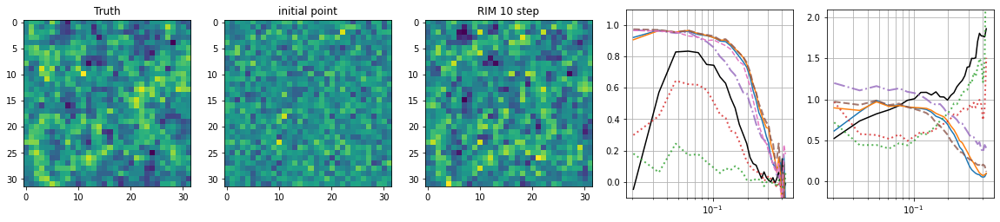

Time taken for 5 iterations :  9.145248889923096
Loss at iteration 225 :  1.662211
Time taken for 5 iterations :  8.186920881271362
Loss at iteration 230 :  1.6476026
Time taken for 5 iterations :  7.966923952102661
Loss at iteration 235 :  1.659257
Time taken for 5 iterations :  8.19236135482788
Loss at iteration 240 :  1.6457301


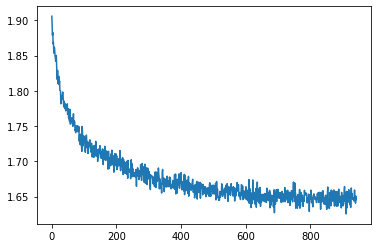

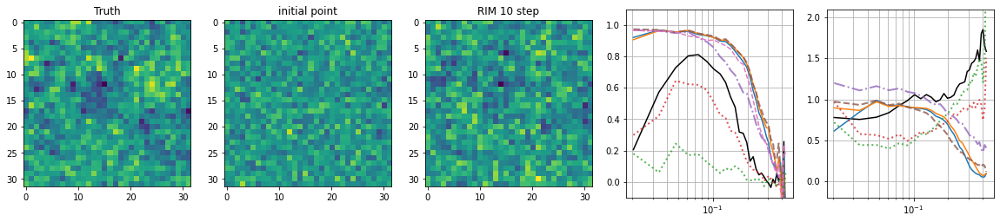

Time taken for 5 iterations :  9.262319564819336
Loss at iteration 245 :  1.6535378
Time taken for 5 iterations :  8.037748336791992
Loss at iteration 250 :  1.6355344
Time taken for 5 iterations :  8.009045362472534
Loss at iteration 255 :  1.6496964
Time taken for 5 iterations :  8.494853734970093
Loss at iteration 260 :  1.6392353


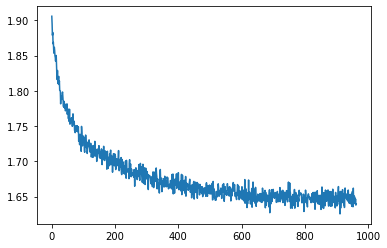

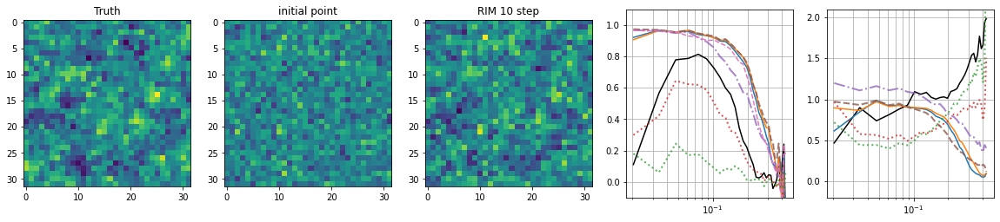

Time taken for 5 iterations :  9.064621210098267
Loss at iteration 265 :  1.657502
Time taken for 5 iterations :  8.031278371810913
Loss at iteration 270 :  1.6486008
Time taken for 5 iterations :  8.054031610488892
Loss at iteration 275 :  1.6522404
Time taken for 5 iterations :  8.173991203308105
Loss at iteration 280 :  1.6439044


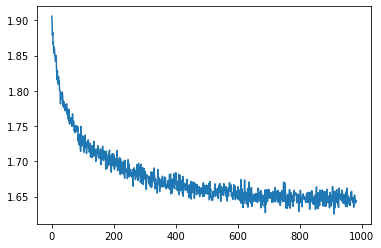

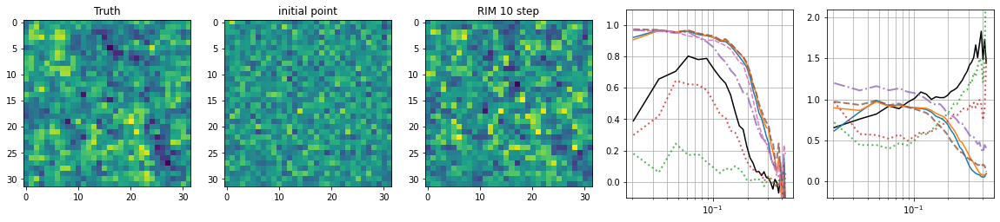

Time taken for 5 iterations :  9.170393705368042
Loss at iteration 285 :  1.6525105
Time taken for 5 iterations :  8.037669897079468
Loss at iteration 290 :  1.6516826
Time taken for 5 iterations :  7.951591968536377
Loss at iteration 295 :  1.6410178
Time taken for 5 iterations :  8.345422983169556
Loss at iteration 300 :  1.6370515


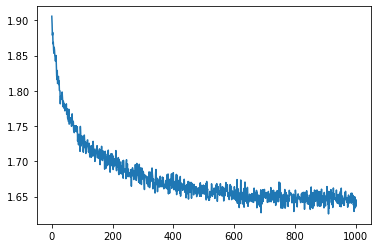

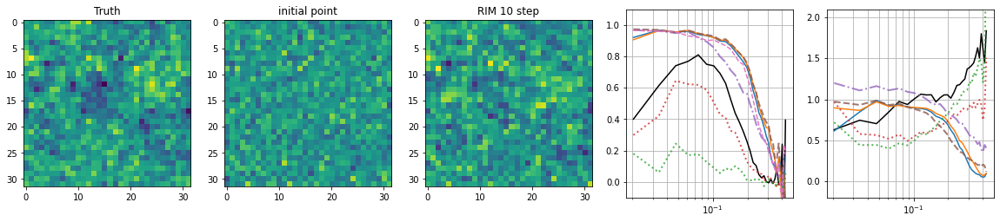

Time taken for 5 iterations :  9.232575416564941
Loss at iteration 305 :  1.6373235
Time taken for 5 iterations :  8.087109804153442
Loss at iteration 310 :  1.636042
Time taken for 5 iterations :  8.050254583358765
Loss at iteration 315 :  1.6445085
Time taken for 5 iterations :  8.040621042251587
Loss at iteration 320 :  1.6304394


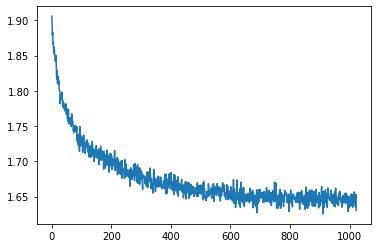

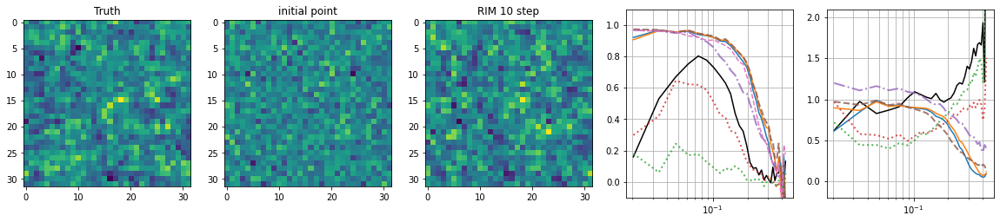

Time taken for 5 iterations :  9.155683040618896
Loss at iteration 325 :  1.6407084
Time taken for 5 iterations :  8.085697889328003
Loss at iteration 330 :  1.6329408
Time taken for 5 iterations :  8.050379991531372
Loss at iteration 335 :  1.6465055
Time taken for 5 iterations :  8.003846168518066
Loss at iteration 340 :  1.6600747


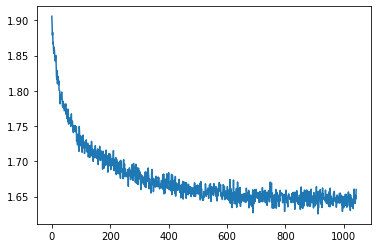

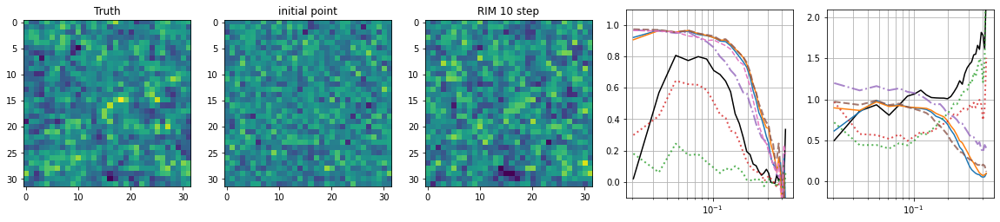

Time taken for 5 iterations :  9.472135782241821
Loss at iteration 345 :  1.6363102
Time taken for 5 iterations :  8.114767074584961
Loss at iteration 350 :  1.6360974
Time taken for 5 iterations :  7.967114686965942
Loss at iteration 355 :  1.6412997
Time taken for 5 iterations :  8.05442476272583
Loss at iteration 360 :  1.643825


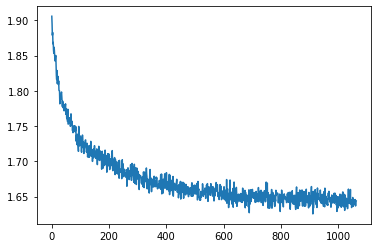

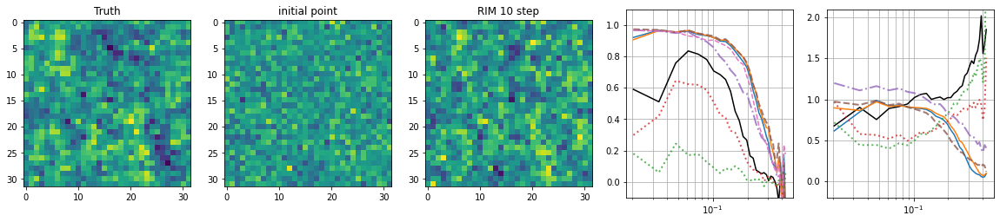

Time taken for 5 iterations :  9.257083177566528
Loss at iteration 365 :  1.6440251
Time taken for 5 iterations :  8.067757368087769
Loss at iteration 370 :  1.6400769
Time taken for 5 iterations :  8.03677225112915
Loss at iteration 375 :  1.6297703
Time taken for 5 iterations :  8.038363218307495
Loss at iteration 380 :  1.6441009


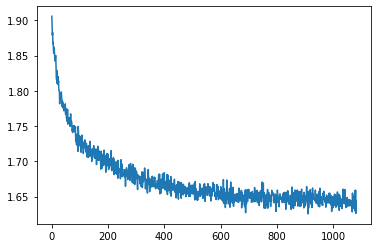

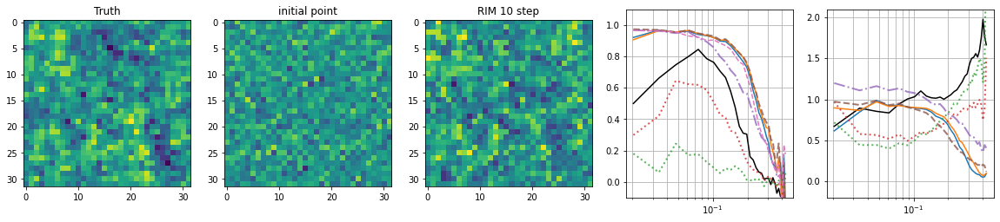

Time taken for 5 iterations :  9.60081434249878
Loss at iteration 385 :  1.644057
Time taken for 5 iterations :  8.14208984375
Loss at iteration 390 :  1.644794
Time taken for 5 iterations :  8.005062580108643
Loss at iteration 395 :  1.6384414
Time taken for 5 iterations :  8.06157636642456
Loss at iteration 400 :  1.6420163


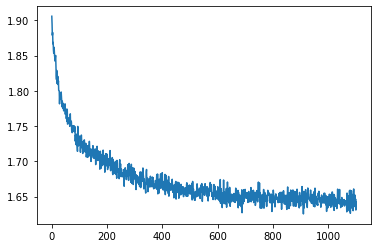

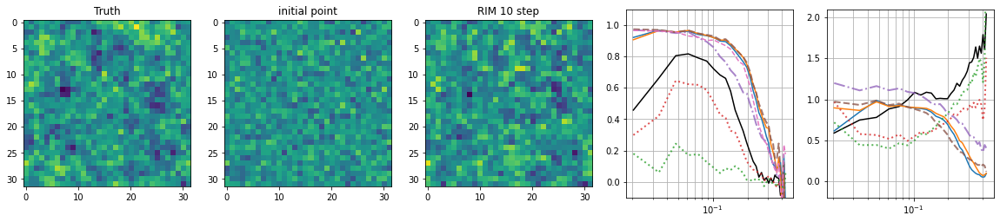

Time taken for 5 iterations :  9.192331790924072
Loss at iteration 405 :  1.6435096
Time taken for 5 iterations :  8.016502380371094
Loss at iteration 410 :  1.6527004
Time taken for 5 iterations :  8.040659666061401
Loss at iteration 415 :  1.6526291
Time taken for 5 iterations :  7.9664528369903564
Loss at iteration 420 :  1.6468068


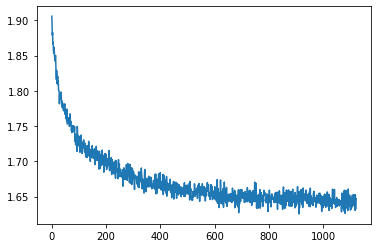

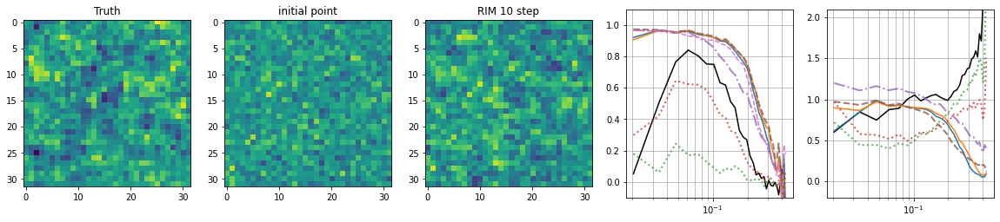

Time taken for 5 iterations :  9.280318021774292
Loss at iteration 425 :  1.6298753
Time taken for 5 iterations :  8.48871374130249
Loss at iteration 430 :  1.6517278
Time taken for 5 iterations :  8.096700191497803
Loss at iteration 435 :  1.6353809
Time taken for 5 iterations :  8.110506057739258
Loss at iteration 440 :  1.651316


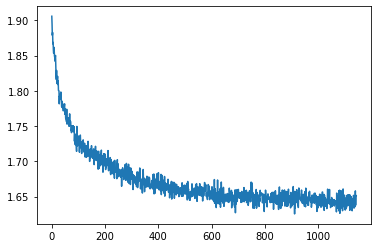

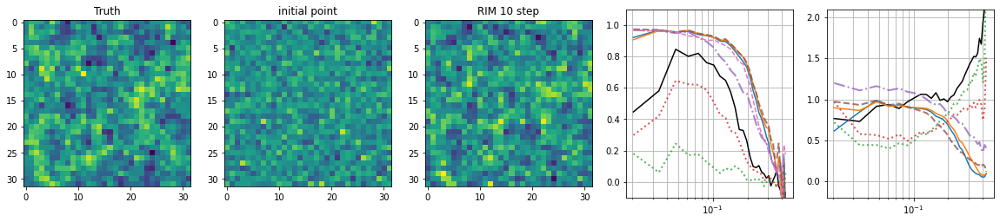

Time taken for 5 iterations :  9.231443405151367
Loss at iteration 445 :  1.6494521
Time taken for 5 iterations :  8.284100770950317
Loss at iteration 450 :  1.6435456
Time taken for 5 iterations :  8.11472487449646
Loss at iteration 455 :  1.6454434
Time taken for 5 iterations :  8.036720514297485
Loss at iteration 460 :  1.6419003


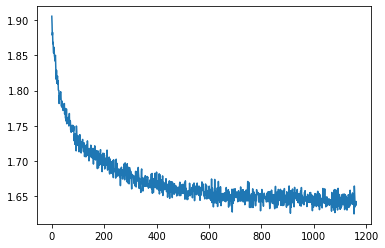

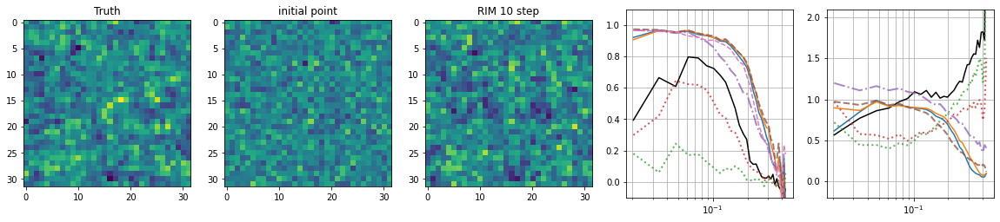

Time taken for 5 iterations :  9.242196559906006
Loss at iteration 465 :  1.6420919
Time taken for 5 iterations :  7.937350749969482
Loss at iteration 535 :  1.6637886
Time taken for 5 iterations :  7.658743143081665
Loss at iteration 540 :  1.6517688


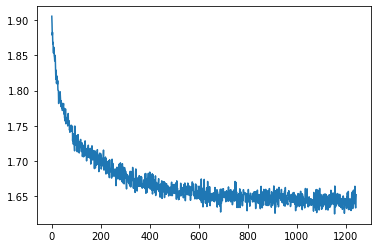

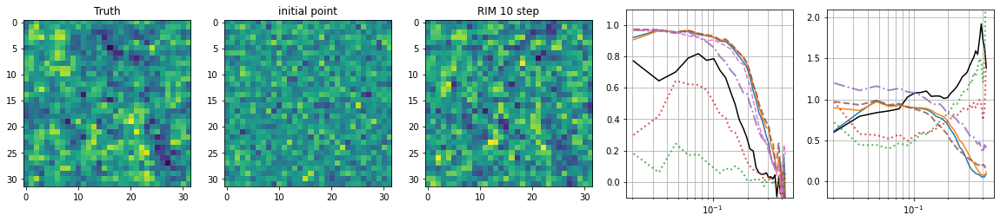

Time taken for 5 iterations :  8.841548204421997
Loss at iteration 545 :  1.6377953
Time taken for 5 iterations :  7.703127145767212
Loss at iteration 550 :  1.654712
Time taken for 5 iterations :  7.734912872314453
Loss at iteration 555 :  1.6385223
Time taken for 5 iterations :  8.203391790390015
Loss at iteration 560 :  1.6440102


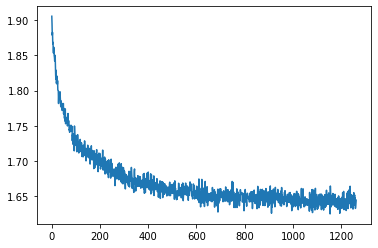

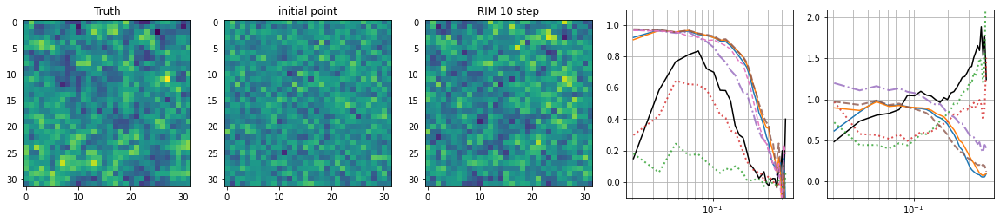

Time taken for 5 iterations :  9.621030807495117
Loss at iteration 565 :  1.6298391
Time taken for 5 iterations :  8.07510256767273
Loss at iteration 570 :  1.6412562
Time taken for 5 iterations :  8.284168481826782
Loss at iteration 575 :  1.6410664
Time taken for 5 iterations :  8.028940439224243
Loss at iteration 580 :  1.6345307


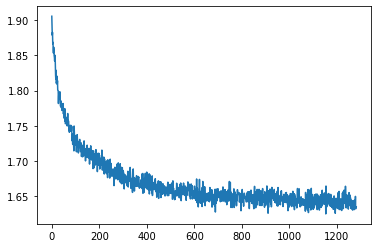

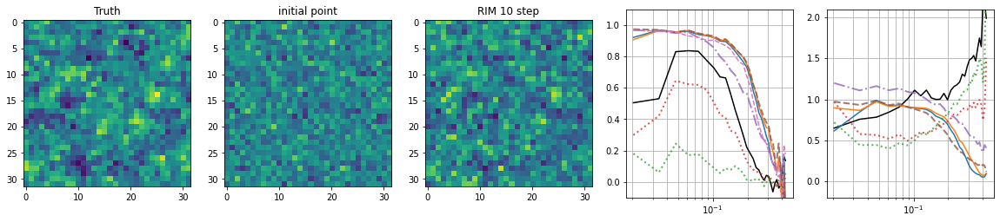

Time taken for 5 iterations :  9.18806529045105
Loss at iteration 585 :  1.6411285
Time taken for 5 iterations :  8.036361932754517
Loss at iteration 590 :  1.6332183
Time taken for 5 iterations :  8.241047143936157
Loss at iteration 595 :  1.6402389
Time taken for 5 iterations :  8.100013017654419
Loss at iteration 600 :  1.6445252


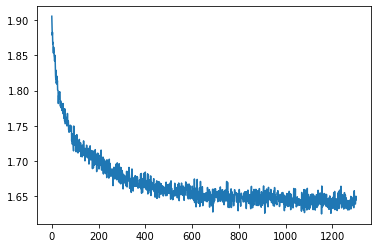

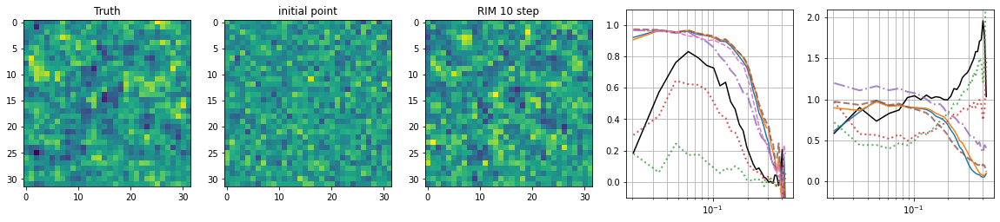

Time taken for 5 iterations :  9.509299278259277
Loss at iteration 605 :  1.6482056
Time taken for 5 iterations :  8.075333833694458
Loss at iteration 610 :  1.6449093
Time taken for 5 iterations :  8.128021001815796
Loss at iteration 615 :  1.65037
Time taken for 5 iterations :  8.135831117630005
Loss at iteration 620 :  1.6470189


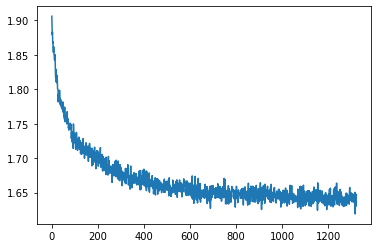

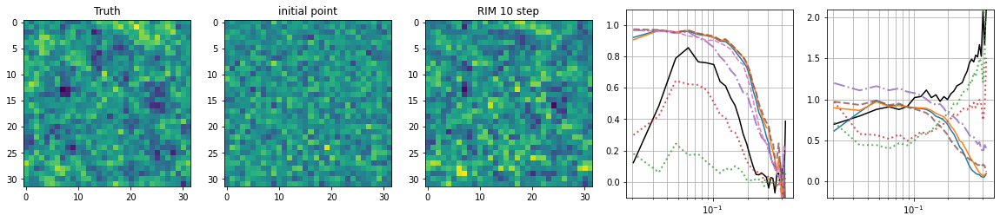

Time taken for 5 iterations :  9.192753314971924
Loss at iteration 625 :  1.6554878
Time taken for 5 iterations :  8.022798776626587
Loss at iteration 630 :  1.6466975
Time taken for 5 iterations :  8.144742488861084
Loss at iteration 635 :  1.6460198
Time taken for 5 iterations :  7.984814167022705
Loss at iteration 640 :  1.6317407


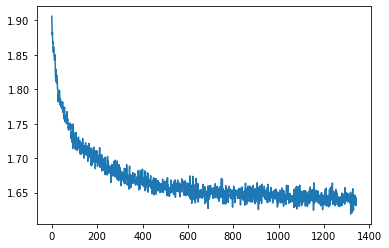

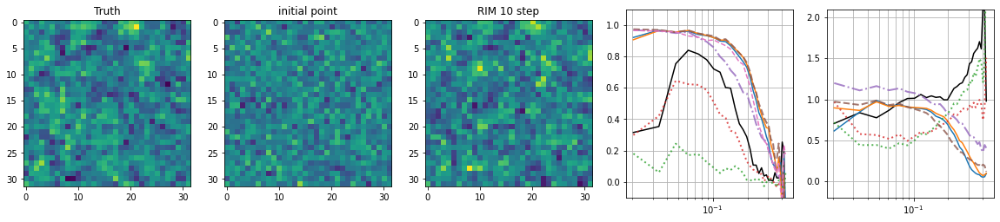

Time taken for 5 iterations :  9.32976746559143
Loss at iteration 645 :  1.650285
Time taken for 5 iterations :  8.348660945892334
Loss at iteration 650 :  1.6394591
Time taken for 5 iterations :  8.095676183700562
Loss at iteration 655 :  1.6405144
Time taken for 5 iterations :  8.077919244766235
Loss at iteration 660 :  1.6383504


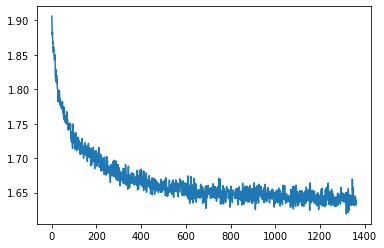

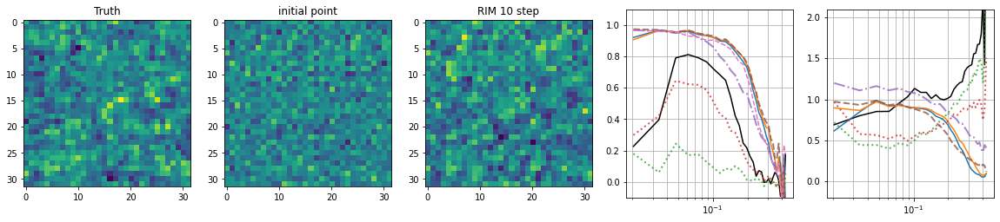

Time taken for 5 iterations :  9.196420669555664
Loss at iteration 665 :  1.6333915
Time taken for 5 iterations :  7.937113046646118
Loss at iteration 670 :  1.634528
Time taken for 5 iterations :  8.120941638946533
Loss at iteration 675 :  1.6391526
Time taken for 5 iterations :  8.10596251487732
Loss at iteration 680 :  1.6472026


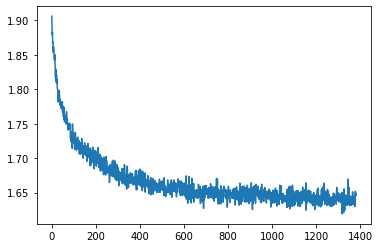

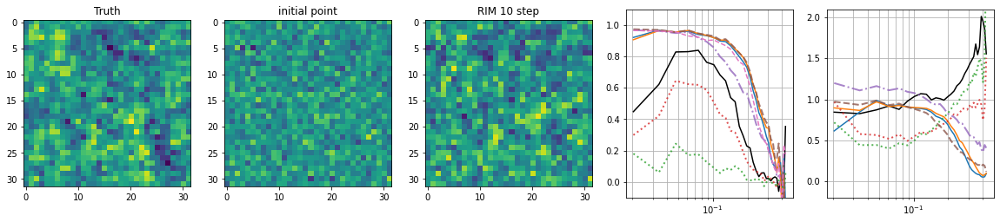

Time taken for 5 iterations :  9.190540313720703
Loss at iteration 685 :  1.6392785
Time taken for 5 iterations :  8.109149694442749
Loss at iteration 690 :  1.6294407
Time taken for 5 iterations :  8.087300062179565
Loss at iteration 695 :  1.6416912
Time taken for 5 iterations :  8.409010171890259
Loss at iteration 700 :  1.6290287


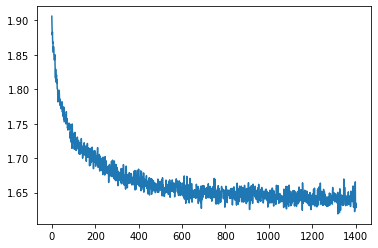

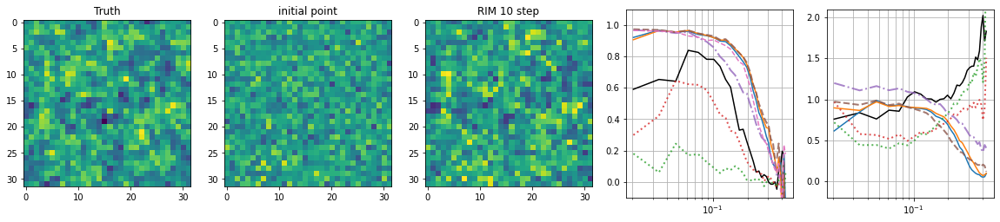

Time taken for 5 iterations :  9.130146980285645
Loss at iteration 705 :  1.6470355
Time taken for 5 iterations :  7.90610671043396
Loss at iteration 710 :  1.6364837
Time taken for 5 iterations :  7.955598592758179
Loss at iteration 715 :  1.6468129
Time taken for 5 iterations :  8.056128025054932
Loss at iteration 720 :  1.6459179


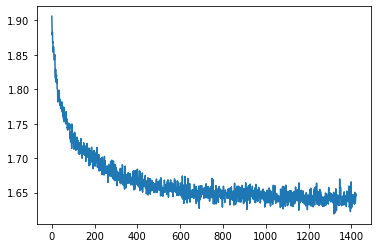

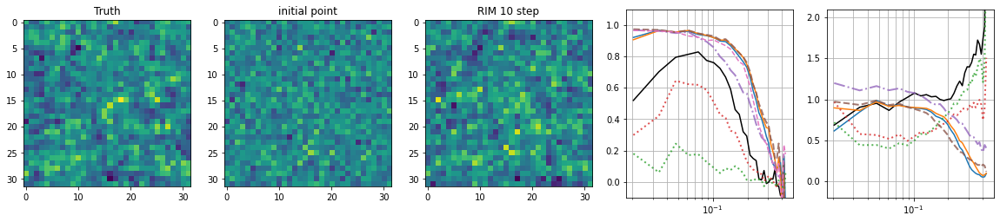

Time taken for 5 iterations :  9.21923828125
Loss at iteration 725 :  1.6368829
Time taken for 5 iterations :  8.021875381469727
Loss at iteration 730 :  1.6439681
Time taken for 5 iterations :  7.958059072494507
Loss at iteration 735 :  1.6323241
Time taken for 5 iterations :  8.497178792953491
Loss at iteration 740 :  1.6430598


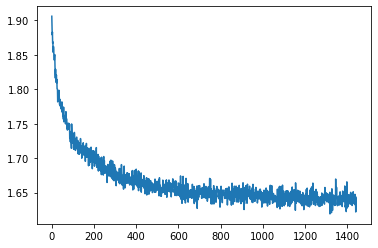

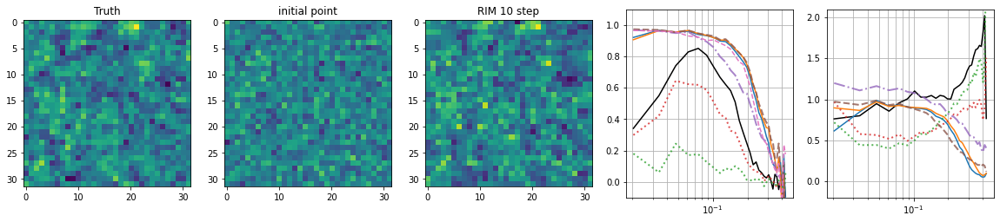

Time taken for 5 iterations :  9.160327911376953
Loss at iteration 745 :  1.6343971
Time taken for 5 iterations :  8.110722064971924
Loss at iteration 750 :  1.6405262
Time taken for 5 iterations :  8.091637134552002
Loss at iteration 755 :  1.6583705
Time taken for 5 iterations :  7.948054552078247
Loss at iteration 760 :  1.6479771


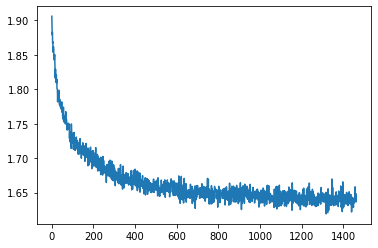

In [ ]:
piter = 5
testiter = 20
# @tf.function
def rim_trainhybrid(x_true, x_init, y):

    with tf.GradientTape() as tape:
        x_pred, states = rimhybrid(x_init, y, 
                grad_fn=rim_grad_fn, grad_args = grad_params, training=True)
        res  = (x_true - x_pred)
        loss = tf.reduce_mean(tf.square(res))
        
    gradients = tape.gradient(loss, rimhybrid.trainable_variables)
    return loss, gradients
        
    
    
lrs = [0.0005, 0.0005, 0.0001]
liters = [201, 501, 1001]
trainiter = 0 
losses = []
start = time.time()
for il in range(3):
    print('Learning rate = %0.3e'%lrs[il])
    opt = tf.keras.optimizers.Adam(learning_rate=lrs[il])
    
    for i in range(liters[il]):
        idx = np.random.randint(0, traindata.shape[0], 8)
        xx2, yy2 = traindata[idx, 0].astype(float32), traindata[idx, 1].astype(float32), 
        x_init = np.random.normal(size=xx2.size).reshape(xx2.shape).astype(float32)


        loss, gradients = rim_trainhybrid(x_true=tf.constant(xx2), 
                                x_init=tf.constant(x_init), 
                                y=tf.constant(yy2))

        losses.append(loss.numpy())    
        opt.apply_gradients(zip(gradients, rimhybrid.trainable_variables))
        
        if i%piter == 0: 
            print("Time taken for %d iterations : "%piter, time.time() - start)
            print("Loss at iteration %d : "%i, losses[-1])
            start = time.time()
        if i%testiter == 0: 
            plt.plot(losses)
            plt.show()
            plt.close()
            test_callbackhybrid()
        trainiter  += 1

Learning rate = 5.000e-04
ZA/2LPT sim

RIM does not use prior

Time taken for 5 iterations :  7.715810298919678
Loss at iteration 0 :  0.68831843


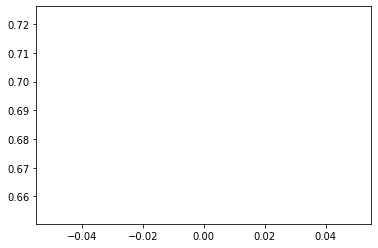

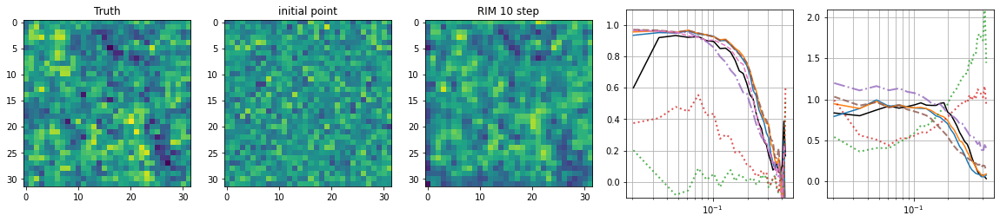

Time taken for 5 iterations :  11.643567562103271
Loss at iteration 5 :  0.70056456
Time taken for 5 iterations :  10.64487361907959
Loss at iteration 10 :  0.7065016
Time taken for 5 iterations :  10.665574073791504
Loss at iteration 15 :  0.697347
Time taken for 5 iterations :  10.652021884918213
Loss at iteration 20 :  0.6936381


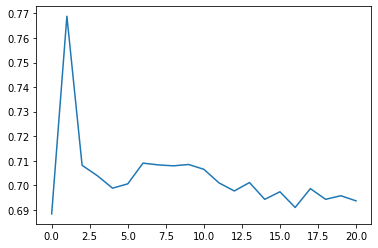

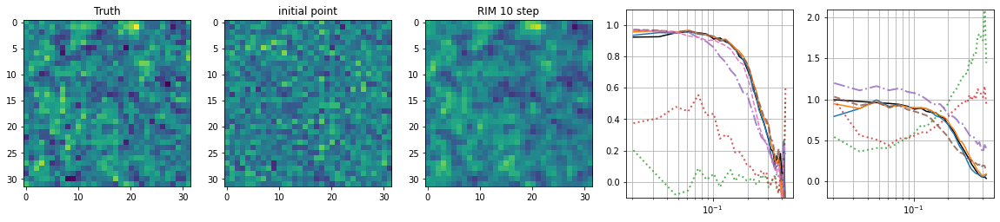

Time taken for 5 iterations :  11.82455825805664
Loss at iteration 25 :  0.689014
Time taken for 5 iterations :  10.690942525863647
Loss at iteration 30 :  0.68793625
Time taken for 5 iterations :  10.655008554458618
Loss at iteration 35 :  0.69010425
Time taken for 5 iterations :  10.695598363876343
Loss at iteration 40 :  0.68858844


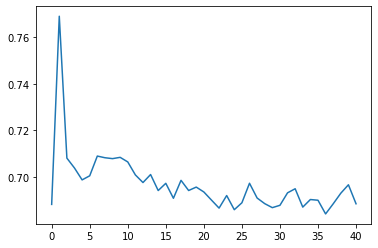

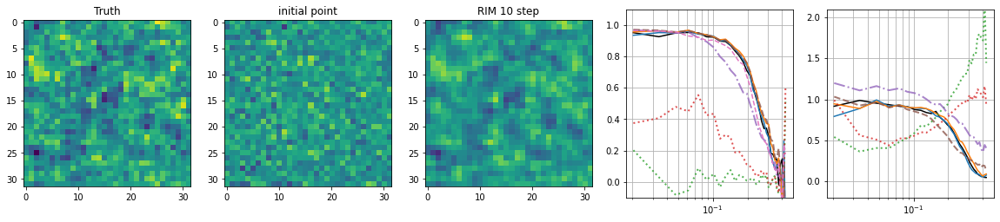

Time taken for 5 iterations :  11.577672481536865
Loss at iteration 45 :  0.6849381
Time taken for 5 iterations :  10.682478189468384
Loss at iteration 50 :  0.6911049
Time taken for 5 iterations :  10.681543827056885
Loss at iteration 55 :  0.6843377
Time taken for 5 iterations :  10.625795125961304
Loss at iteration 60 :  0.6866658


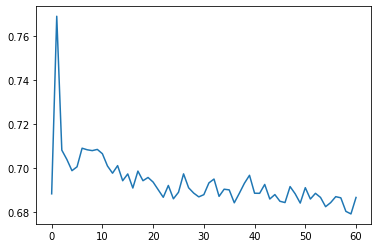

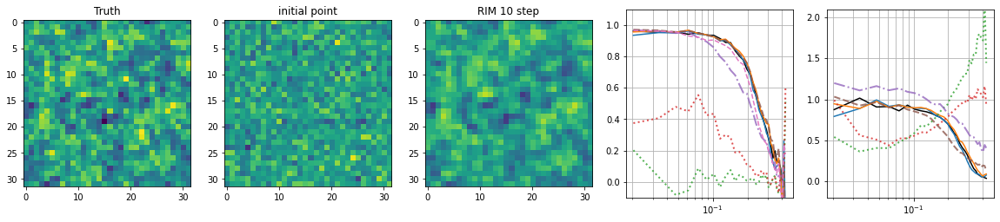

Time taken for 5 iterations :  11.808765888214111
Loss at iteration 65 :  0.68452173
Time taken for 5 iterations :  10.74478006362915
Loss at iteration 70 :  0.6907647
Time taken for 5 iterations :  10.651216745376587
Loss at iteration 75 :  0.68369514
Time taken for 5 iterations :  10.686630964279175
Loss at iteration 80 :  0.6823175


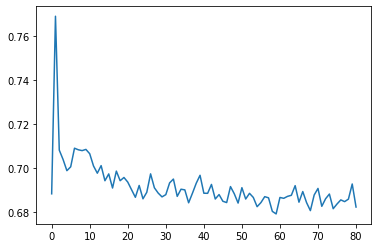

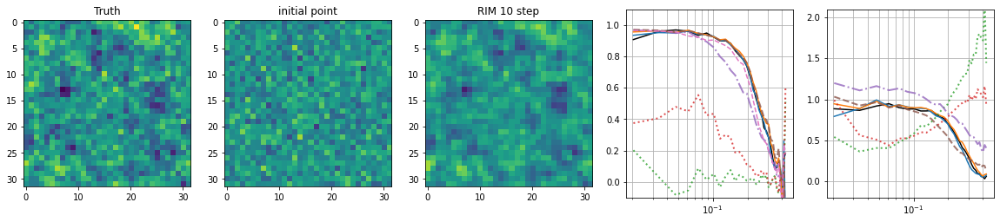

Time taken for 5 iterations :  11.593141078948975
Loss at iteration 85 :  0.68577075
Time taken for 5 iterations :  10.67781662940979
Loss at iteration 90 :  0.6869553
Time taken for 5 iterations :  10.936946868896484
Loss at iteration 95 :  0.6889708
Time taken for 5 iterations :  10.660129308700562
Loss at iteration 100 :  0.68983567


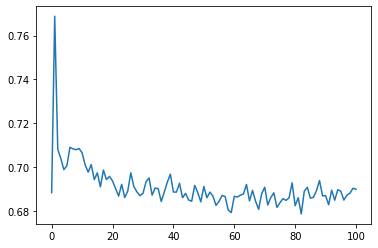

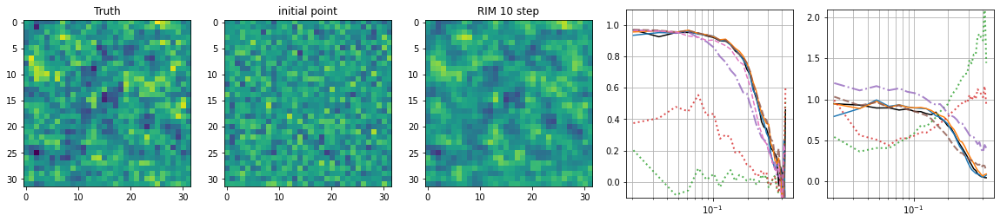

Time taken for 5 iterations :  11.641645908355713
Loss at iteration 105 :  0.6886241
Time taken for 5 iterations :  10.66567087173462
Loss at iteration 110 :  0.6774593
Time taken for 5 iterations :  10.717212438583374
Loss at iteration 115 :  0.682982
Time taken for 5 iterations :  10.699030637741089
Loss at iteration 120 :  0.68882847


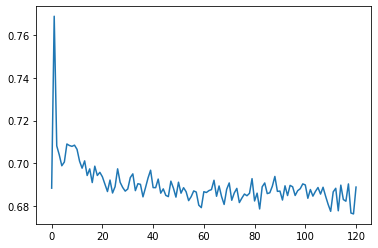

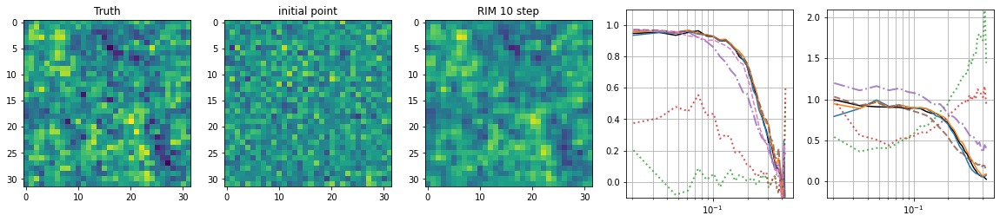

Time taken for 5 iterations :  11.829203128814697
Loss at iteration 125 :  0.685894
Time taken for 5 iterations :  10.65160083770752
Loss at iteration 130 :  0.68826985
Time taken for 5 iterations :  10.634870290756226
Loss at iteration 135 :  0.6809895
Time taken for 5 iterations :  10.73206877708435
Loss at iteration 140 :  0.6862463


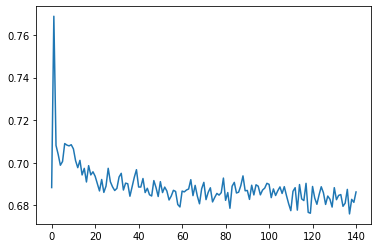

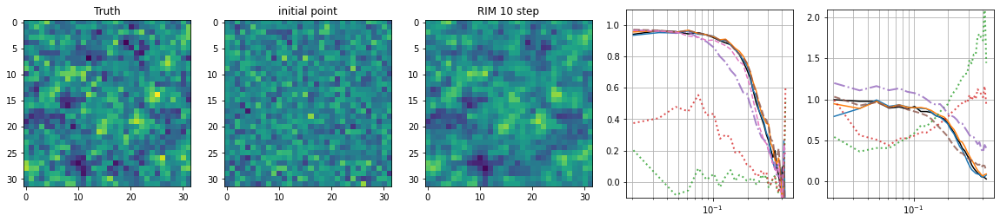

Time taken for 5 iterations :  11.63211703300476
Loss at iteration 145 :  0.68629813
Time taken for 5 iterations :  10.670323848724365
Loss at iteration 150 :  0.6849373
Time taken for 5 iterations :  10.62064266204834
Loss at iteration 155 :  0.68189466
Time taken for 5 iterations :  10.678282260894775
Loss at iteration 160 :  0.6809183


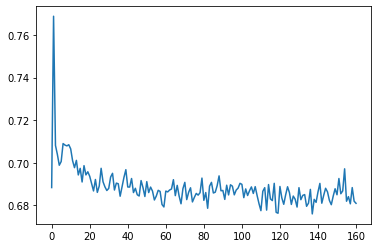

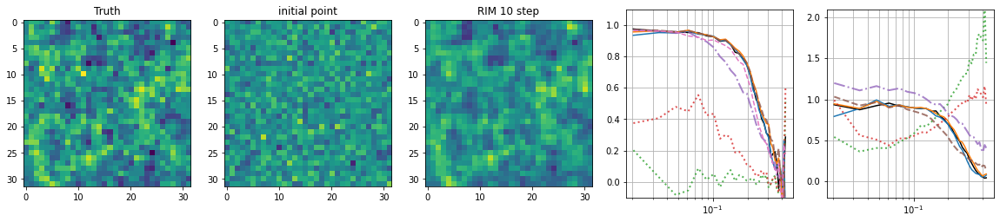

Time taken for 5 iterations :  11.852795839309692
Loss at iteration 165 :  0.6873485
Time taken for 5 iterations :  10.688701391220093
Loss at iteration 170 :  0.68561625
Time taken for 5 iterations :  10.652838706970215
Loss at iteration 175 :  0.6799537
Time taken for 5 iterations :  10.66536808013916
Loss at iteration 180 :  0.6822411


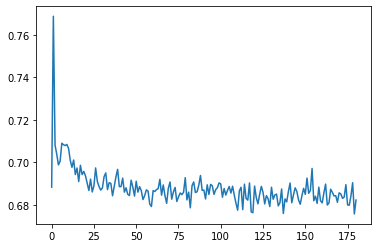

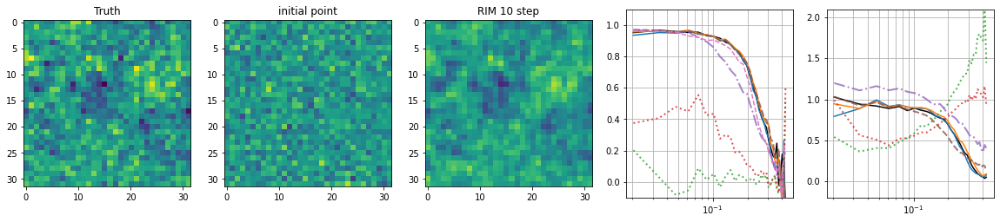

Time taken for 5 iterations :  11.585017442703247
Loss at iteration 185 :  0.6842391
Time taken for 5 iterations :  10.736075162887573
Loss at iteration 190 :  0.6906737
Time taken for 5 iterations :  10.900511026382446
Loss at iteration 195 :  0.68092924
Time taken for 5 iterations :  10.72524642944336
Loss at iteration 200 :  0.6845797


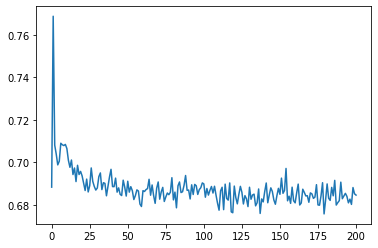

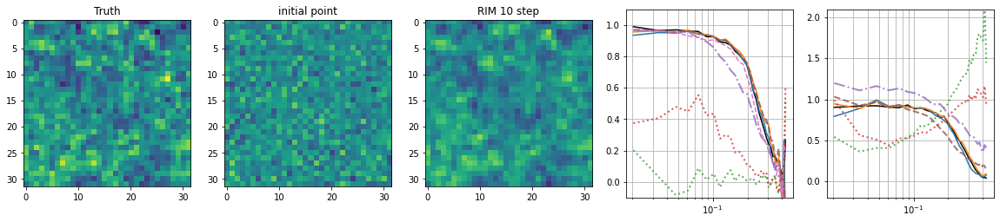

Learning rate = 5.000e-04
Time taken for 5 iterations :  3.2018821239471436
Loss at iteration 0 :  0.6846591


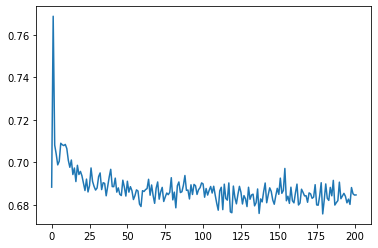

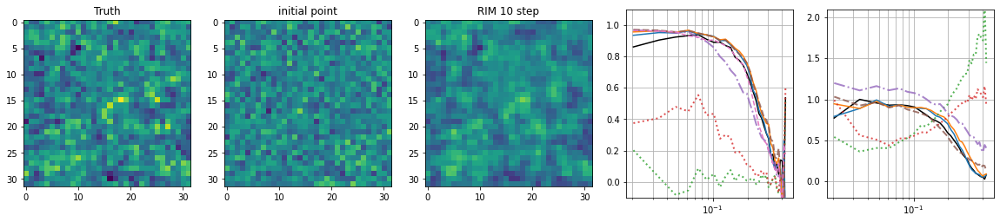

Time taken for 5 iterations :  11.63893723487854
Loss at iteration 5 :  0.69375366
Time taken for 5 iterations :  10.656881332397461
Loss at iteration 10 :  0.6839267
Time taken for 5 iterations :  10.658894777297974
Loss at iteration 15 :  0.68982244
Time taken for 5 iterations :  10.649564743041992
Loss at iteration 20 :  0.68447244


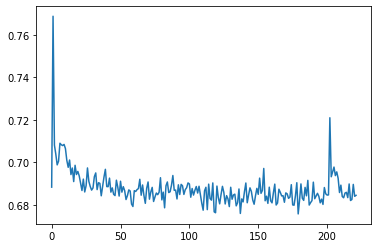

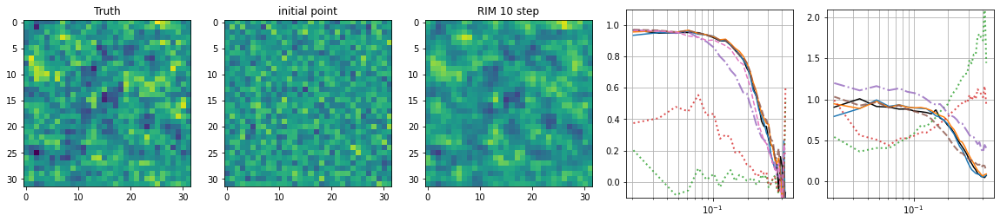

Time taken for 5 iterations :  11.788746356964111
Loss at iteration 25 :  0.6897297
Time taken for 5 iterations :  10.625037431716919
Loss at iteration 30 :  0.68078697
Time taken for 5 iterations :  10.657254934310913
Loss at iteration 35 :  0.68857443
Time taken for 5 iterations :  10.659919500350952
Loss at iteration 40 :  0.6844126


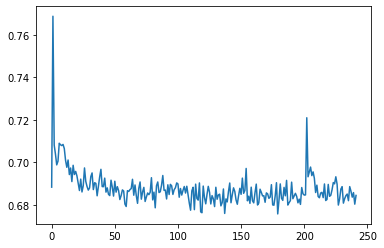

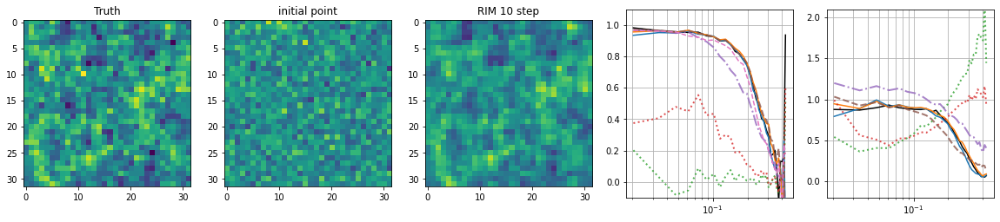

Time taken for 5 iterations :  11.603321313858032
Loss at iteration 45 :  0.6850988
Time taken for 5 iterations :  10.6720290184021
Loss at iteration 50 :  0.67874795
Time taken for 5 iterations :  10.879558801651001
Loss at iteration 55 :  0.6816445
Time taken for 5 iterations :  10.689416646957397
Loss at iteration 60 :  0.68408126


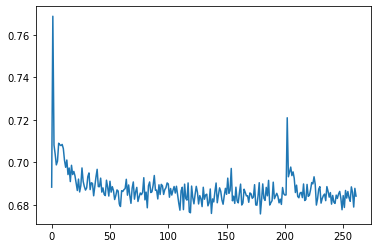

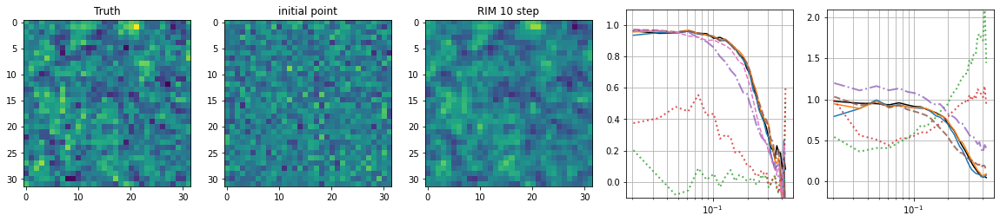

Time taken for 5 iterations :  11.592777013778687
Loss at iteration 65 :  0.68266016
Time taken for 5 iterations :  10.706507444381714
Loss at iteration 70 :  0.6828402
Time taken for 5 iterations :  10.67548942565918
Loss at iteration 75 :  0.6852331
Time taken for 5 iterations :  10.702454805374146
Loss at iteration 80 :  0.6826524


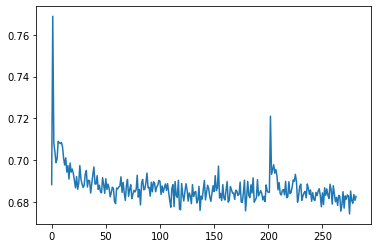

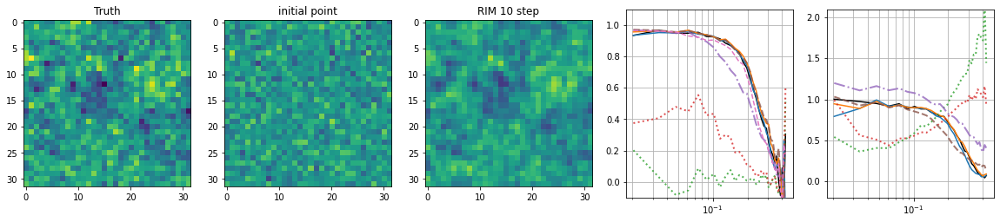

Time taken for 5 iterations :  11.82270860671997
Loss at iteration 85 :  0.6857433
Time taken for 5 iterations :  10.704090118408203
Loss at iteration 90 :  0.67978185
Time taken for 5 iterations :  10.720968961715698
Loss at iteration 95 :  0.68402535
Time taken for 5 iterations :  10.65087628364563
Loss at iteration 100 :  0.6778244


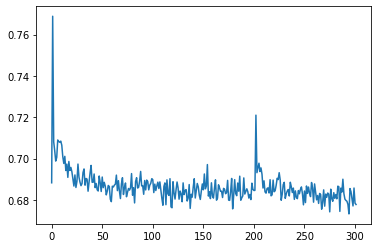

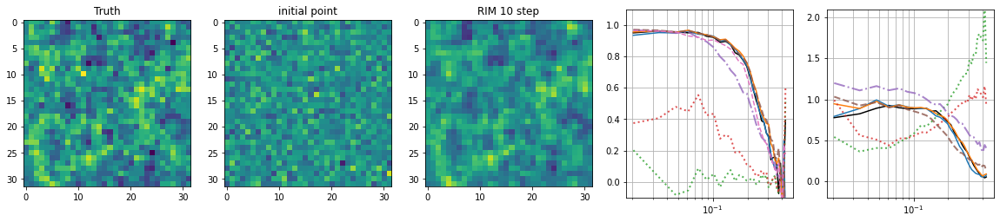

Time taken for 5 iterations :  11.575693368911743
Loss at iteration 105 :  0.68312114
Time taken for 5 iterations :  10.737662315368652
Loss at iteration 110 :  0.68065584
Time taken for 5 iterations :  10.656754732131958
Loss at iteration 115 :  0.6818126
Time taken for 5 iterations :  10.660741090774536
Loss at iteration 120 :  0.6814737


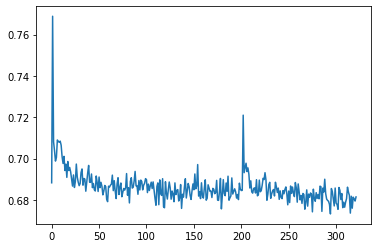

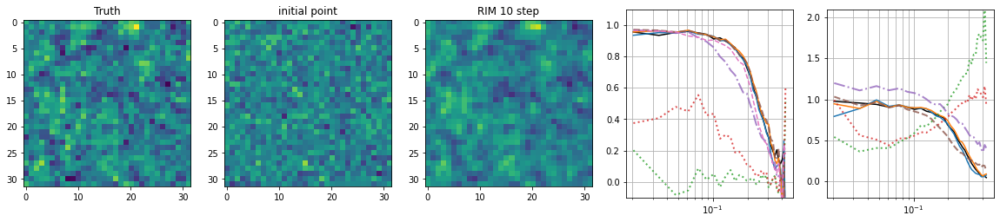

Time taken for 5 iterations :  11.876586675643921
Loss at iteration 125 :  0.6773091
Time taken for 5 iterations :  10.641942262649536
Loss at iteration 130 :  0.67849994
Time taken for 5 iterations :  10.657215356826782
Loss at iteration 135 :  0.67721313
Time taken for 5 iterations :  10.676522731781006
Loss at iteration 140 :  0.68136394


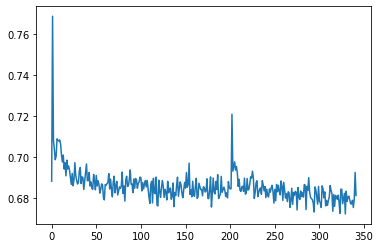

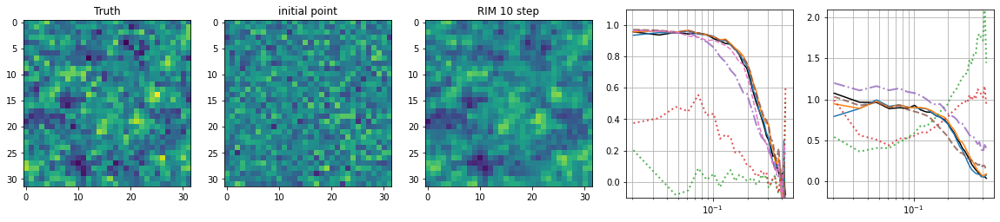

Time taken for 5 iterations :  11.672215223312378
Loss at iteration 145 :  0.6749521
Time taken for 5 iterations :  10.66304349899292
Loss at iteration 150 :  0.6817183
Time taken for 5 iterations :  10.904998064041138
Loss at iteration 155 :  0.67882127
Time taken for 5 iterations :  10.702166080474854
Loss at iteration 160 :  0.6823447


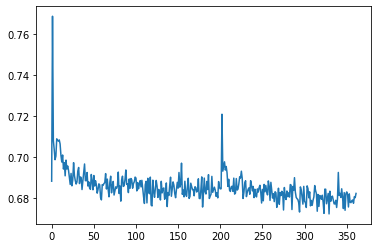

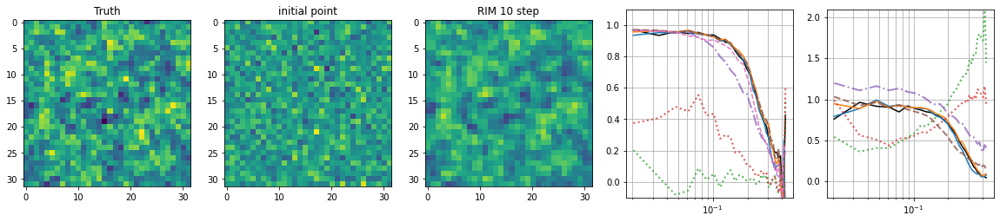

Time taken for 5 iterations :  11.626925230026245
Loss at iteration 165 :  0.6764467
Time taken for 5 iterations :  10.679283380508423
Loss at iteration 170 :  0.6821647
Time taken for 5 iterations :  10.720241785049438
Loss at iteration 175 :  0.68057346
Time taken for 5 iterations :  10.60864782333374
Loss at iteration 180 :  0.68694824


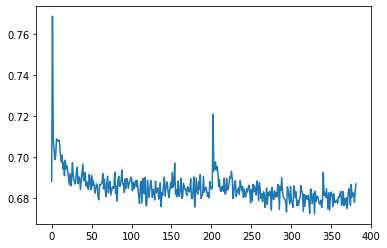

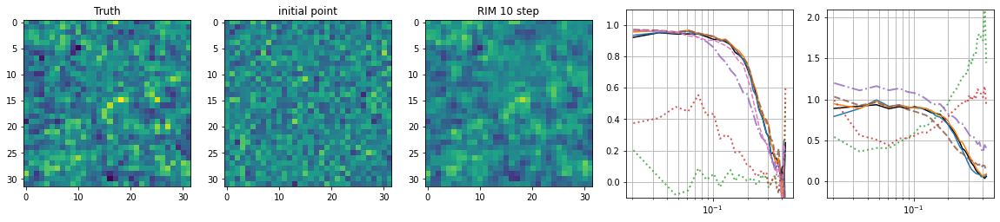

Time taken for 5 iterations :  11.854496479034424
Loss at iteration 185 :  0.67824185
Time taken for 5 iterations :  10.671826362609863
Loss at iteration 190 :  0.6779071
Time taken for 5 iterations :  10.660847425460815
Loss at iteration 195 :  0.6780937
Time taken for 5 iterations :  10.624998092651367
Loss at iteration 200 :  0.6832352


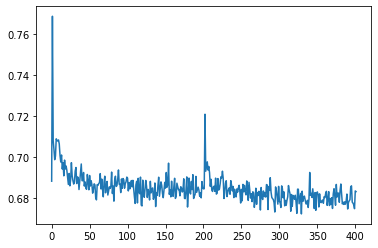

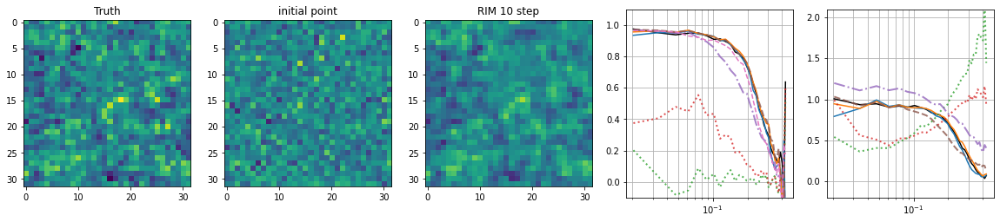

Time taken for 5 iterations :  11.663126707077026
Loss at iteration 205 :  0.67742735
Time taken for 5 iterations :  10.655659914016724
Loss at iteration 210 :  0.68303186
Time taken for 5 iterations :  10.697274923324585
Loss at iteration 215 :  0.6769473
Time taken for 5 iterations :  10.635265827178955
Loss at iteration 220 :  0.6786182


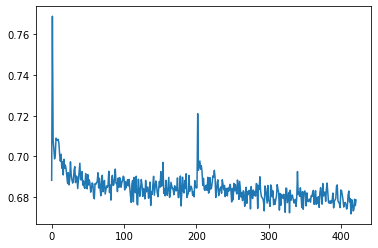

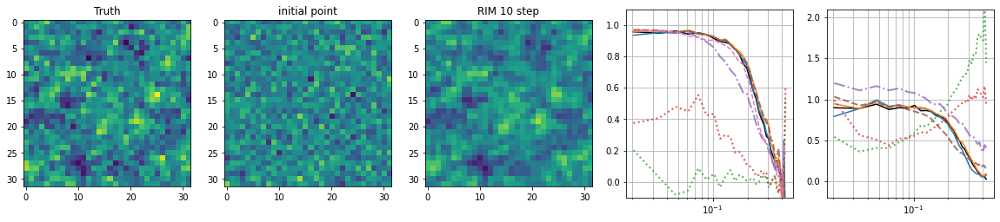

Time taken for 5 iterations :  11.854028224945068
Loss at iteration 225 :  0.6800824
Time taken for 5 iterations :  10.729406595230103
Loss at iteration 230 :  0.67797637
Time taken for 5 iterations :  10.774896383285522
Loss at iteration 235 :  0.6812737
Time taken for 5 iterations :  10.663106679916382
Loss at iteration 240 :  0.68141764


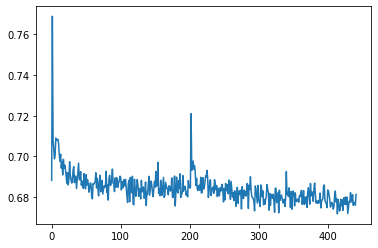

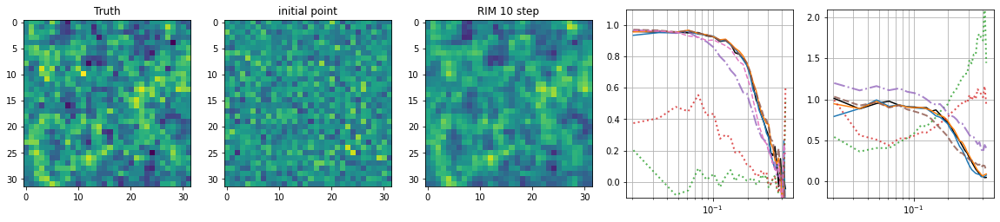

Time taken for 5 iterations :  11.592019319534302
Loss at iteration 245 :  0.6669431
Time taken for 5 iterations :  10.668049573898315
Loss at iteration 250 :  0.67414826
Time taken for 5 iterations :  10.926610469818115
Loss at iteration 255 :  0.6765482
Time taken for 5 iterations :  10.664860486984253
Loss at iteration 260 :  0.67837757


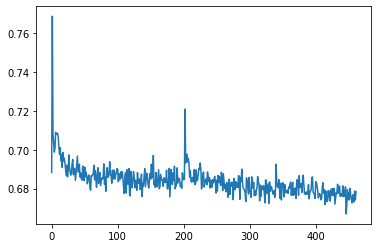

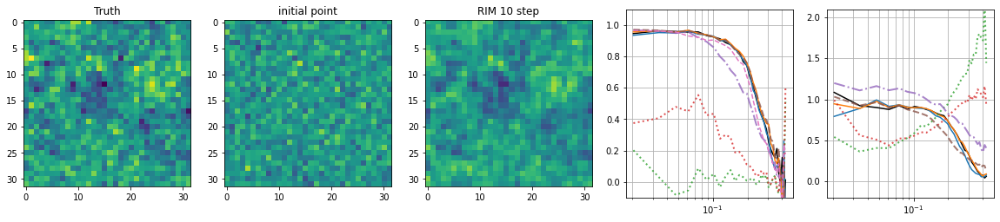

Time taken for 5 iterations :  11.612032890319824
Loss at iteration 265 :  0.6790205
Time taken for 5 iterations :  10.607638359069824
Loss at iteration 270 :  0.6723127
Time taken for 5 iterations :  10.536507606506348
Loss at iteration 275 :  0.67115504
Time taken for 5 iterations :  10.568363189697266
Loss at iteration 280 :  0.67534196


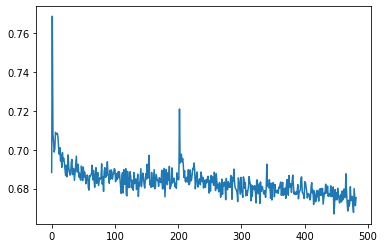

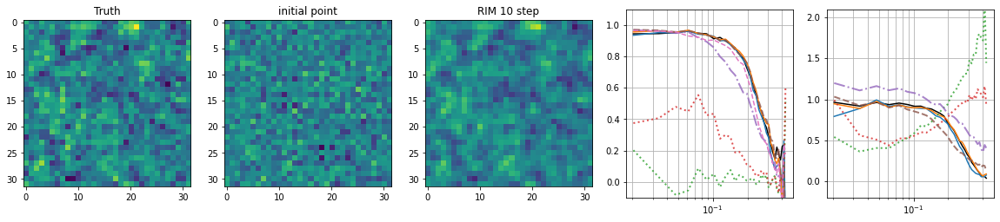

Time taken for 5 iterations :  11.742651462554932
Loss at iteration 285 :  0.6715992
Time taken for 5 iterations :  10.584609746932983
Loss at iteration 290 :  0.6713493
Time taken for 5 iterations :  10.597029685974121
Loss at iteration 295 :  0.6762177
Time taken for 5 iterations :  10.552927732467651
Loss at iteration 300 :  0.67470837


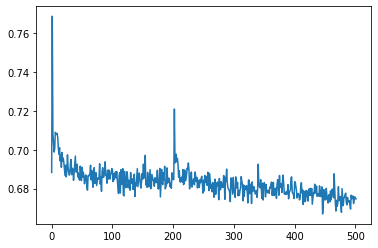

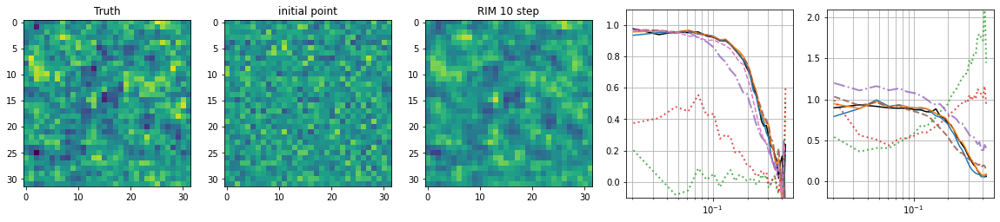

Time taken for 5 iterations :  11.508971691131592
Loss at iteration 305 :  0.6801206
Time taken for 5 iterations :  10.633169651031494
Loss at iteration 310 :  0.67413384
Time taken for 5 iterations :  10.58450698852539
Loss at iteration 315 :  0.68092084
Time taken for 5 iterations :  10.570458173751831
Loss at iteration 320 :  0.6787806


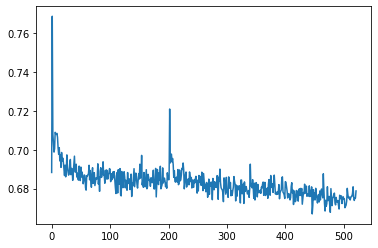

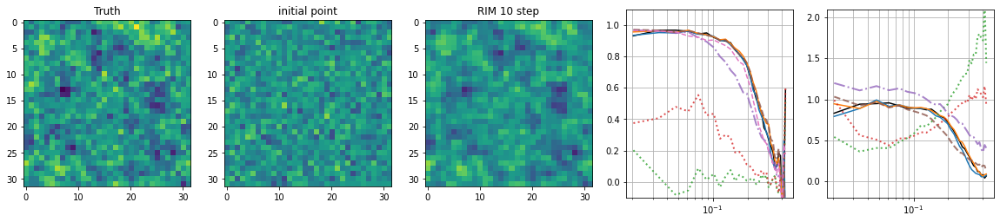

Time taken for 5 iterations :  11.722646474838257
Loss at iteration 325 :  0.6779242
Time taken for 5 iterations :  10.54449200630188
Loss at iteration 330 :  0.67491895
Time taken for 5 iterations :  10.577427625656128
Loss at iteration 335 :  0.67151326
Time taken for 5 iterations :  10.603213548660278
Loss at iteration 340 :  0.67413086


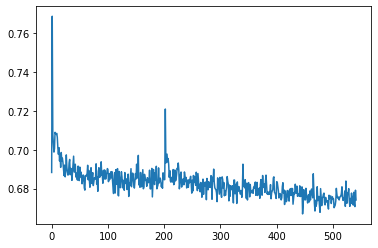

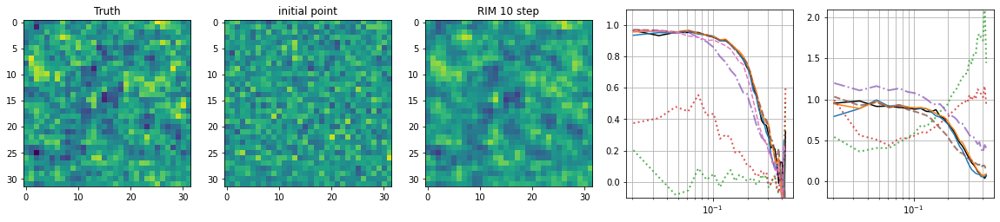

Time taken for 5 iterations :  11.466003894805908
Loss at iteration 345 :  0.6651049
Time taken for 5 iterations :  10.567800760269165
Loss at iteration 350 :  0.67371583
Time taken for 5 iterations :  10.82915997505188
Loss at iteration 355 :  0.6742007
Time taken for 5 iterations :  10.549737215042114
Loss at iteration 360 :  0.6730798


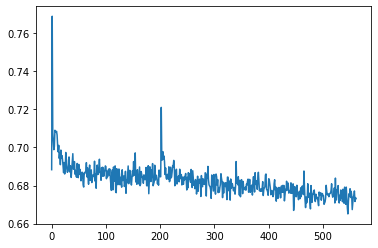

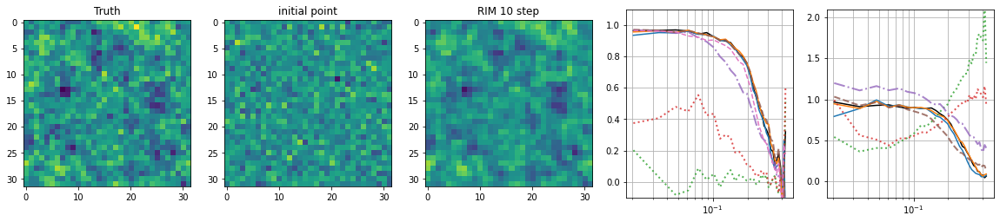

Time taken for 5 iterations :  11.557470798492432
Loss at iteration 365 :  0.66944116
Time taken for 5 iterations :  10.592088222503662
Loss at iteration 370 :  0.6759272
Time taken for 5 iterations :  10.593494892120361
Loss at iteration 375 :  0.6733075
Time taken for 5 iterations :  10.567547798156738
Loss at iteration 380 :  0.6717544


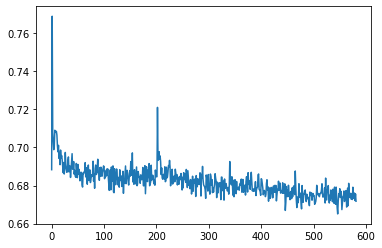

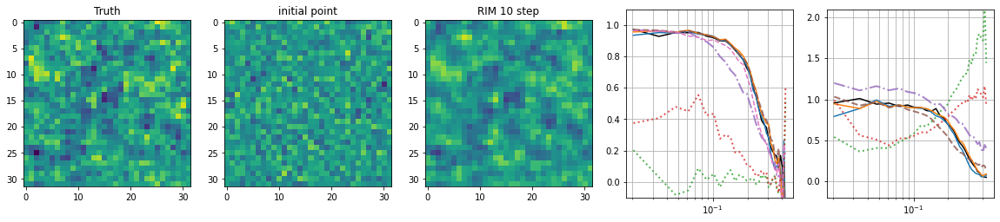

Time taken for 5 iterations :  11.766494750976562
Loss at iteration 385 :  0.67719126
Time taken for 5 iterations :  10.580498218536377
Loss at iteration 390 :  0.6742773
Time taken for 5 iterations :  10.637693166732788
Loss at iteration 395 :  0.67838335
Time taken for 5 iterations :  10.600616216659546
Loss at iteration 400 :  0.68520314


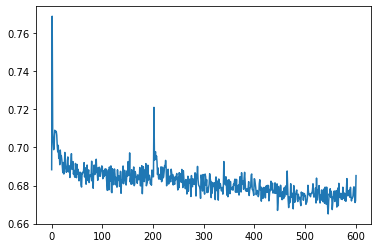

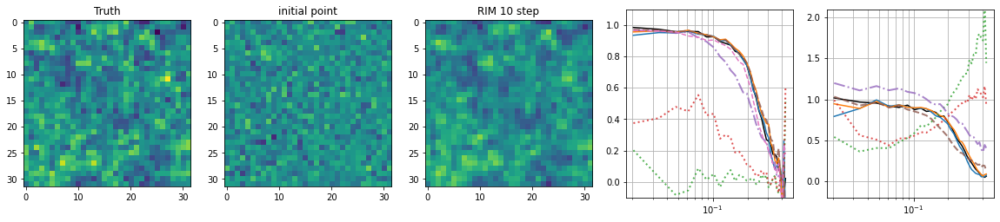

Time taken for 5 iterations :  11.511558771133423
Loss at iteration 405 :  0.67562014
Time taken for 5 iterations :  10.561046838760376
Loss at iteration 410 :  0.6754637
Time taken for 5 iterations :  10.622459888458252
Loss at iteration 415 :  0.6787214
Time taken for 5 iterations :  10.580896615982056
Loss at iteration 420 :  0.6741278


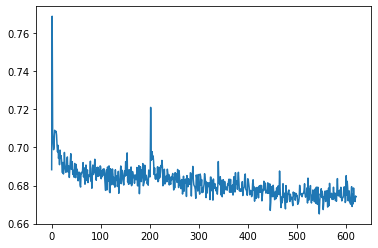

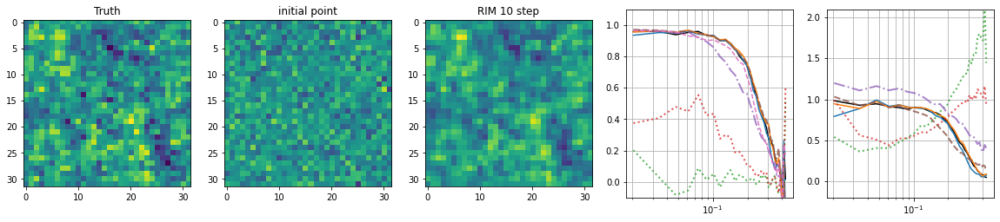

Time taken for 5 iterations :  11.702646493911743
Loss at iteration 425 :  0.6698428
Time taken for 5 iterations :  10.587315559387207
Loss at iteration 430 :  0.6737294
Time taken for 5 iterations :  10.59581732749939
Loss at iteration 435 :  0.66700053
Time taken for 5 iterations :  10.577923774719238
Loss at iteration 440 :  0.6716746


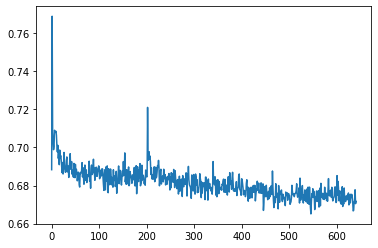

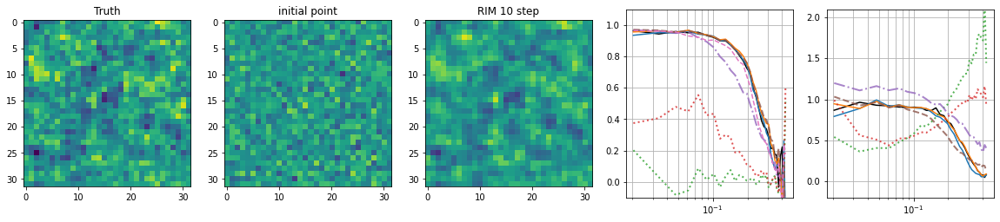

Time taken for 5 iterations :  11.504539251327515
Loss at iteration 445 :  0.67306894
Time taken for 5 iterations :  10.569684028625488
Loss at iteration 450 :  0.6727419
Time taken for 5 iterations :  10.817625045776367
Loss at iteration 455 :  0.6797947
Time taken for 5 iterations :  10.613552808761597
Loss at iteration 460 :  0.67286485


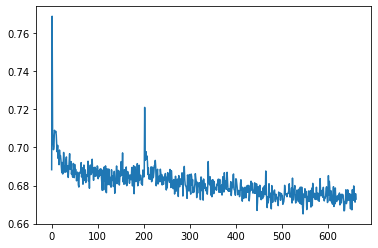

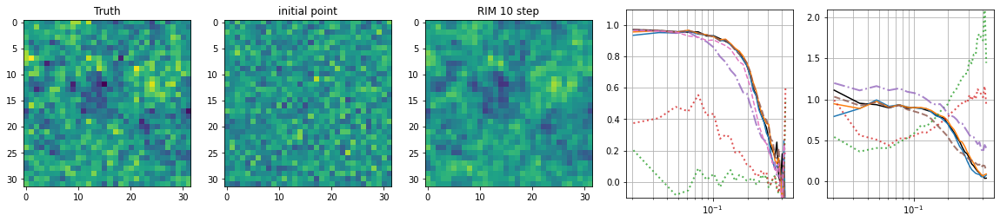

Time taken for 5 iterations :  11.493589401245117
Loss at iteration 465 :  0.6733243
Time taken for 5 iterations :  10.591450929641724
Loss at iteration 470 :  0.6734911
Time taken for 5 iterations :  10.601693391799927
Loss at iteration 475 :  0.6707081
Time taken for 5 iterations :  10.555727243423462
Loss at iteration 480 :  0.66998863


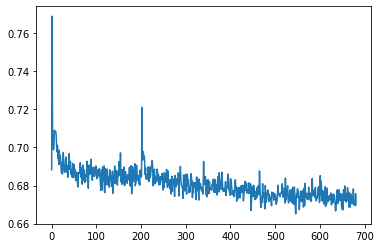

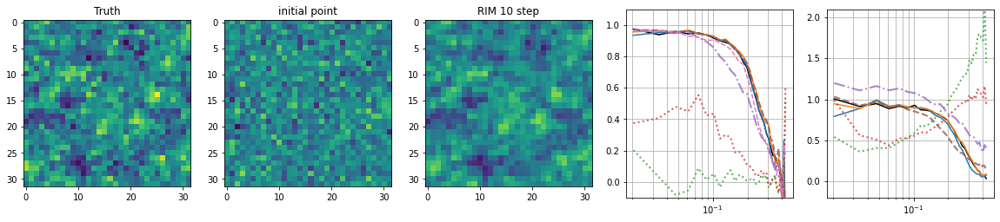

Time taken for 5 iterations :  11.736055374145508
Loss at iteration 485 :  0.6694241
Time taken for 5 iterations :  10.541289329528809
Loss at iteration 490 :  0.6721597
Time taken for 5 iterations :  10.591319799423218
Loss at iteration 495 :  0.67364544
Time taken for 5 iterations :  10.602019548416138
Loss at iteration 500 :  0.675788


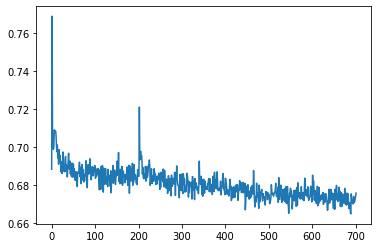

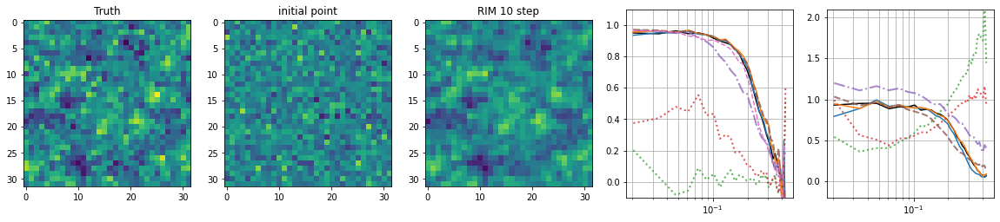

Learning rate = 1.000e-04
Time taken for 5 iterations :  3.1609253883361816
Loss at iteration 0 :  0.6757067


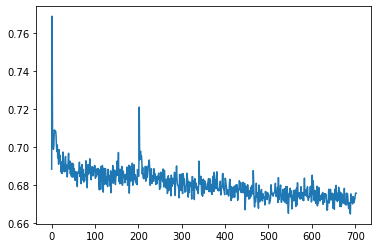

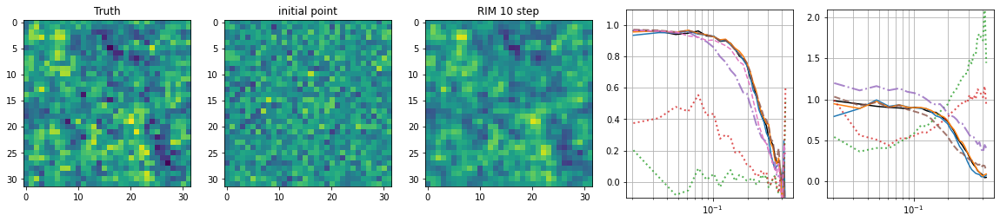

Time taken for 5 iterations :  11.50020694732666
Loss at iteration 5 :  0.668615
Time taken for 5 iterations :  10.615397930145264
Loss at iteration 10 :  0.67143327
Time taken for 5 iterations :  10.837023258209229
Loss at iteration 15 :  0.66756684
Time taken for 5 iterations :  10.566938161849976
Loss at iteration 20 :  0.6737554


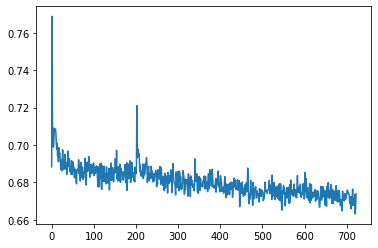

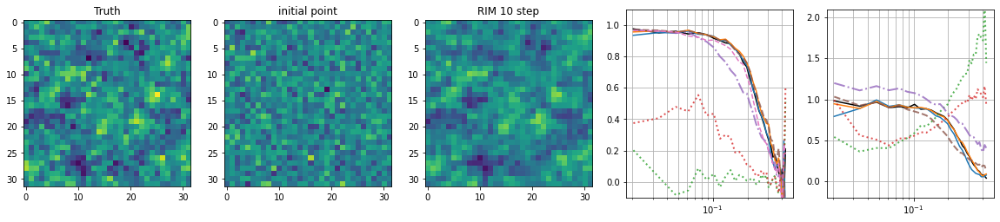

Time taken for 5 iterations :  11.49517273902893
Loss at iteration 25 :  0.67426336
Time taken for 5 iterations :  10.573567152023315
Loss at iteration 30 :  0.66986024
Time taken for 5 iterations :  10.600499391555786
Loss at iteration 35 :  0.6740803
Time taken for 5 iterations :  10.571939468383789
Loss at iteration 40 :  0.67139363


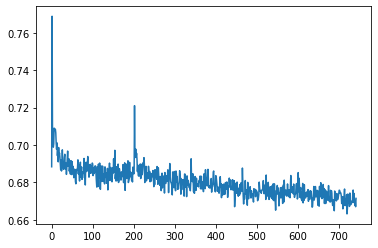

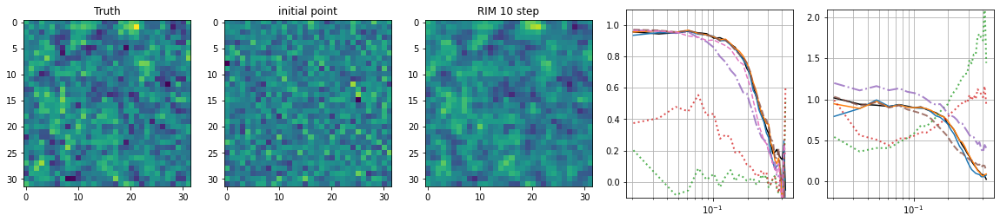

Time taken for 5 iterations :  11.737531423568726
Loss at iteration 45 :  0.6733765
Time taken for 5 iterations :  10.57015609741211
Loss at iteration 50 :  0.673365
Time taken for 5 iterations :  10.609508514404297
Loss at iteration 55 :  0.6755053
Time taken for 5 iterations :  10.558995246887207
Loss at iteration 60 :  0.6731513


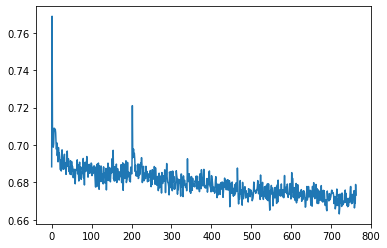

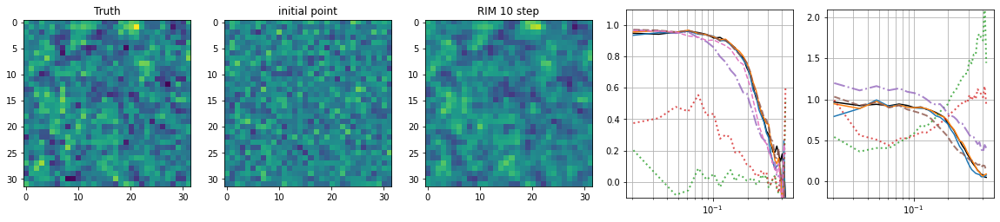

Time taken for 5 iterations :  11.535301208496094
Loss at iteration 65 :  0.66764176
Time taken for 5 iterations :  10.613302230834961
Loss at iteration 70 :  0.6765969
Time taken for 5 iterations :  10.597784757614136
Loss at iteration 75 :  0.6712194
Time taken for 5 iterations :  10.823940992355347
Loss at iteration 80 :  0.6696239


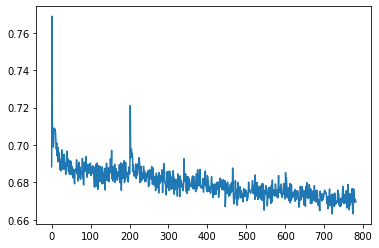

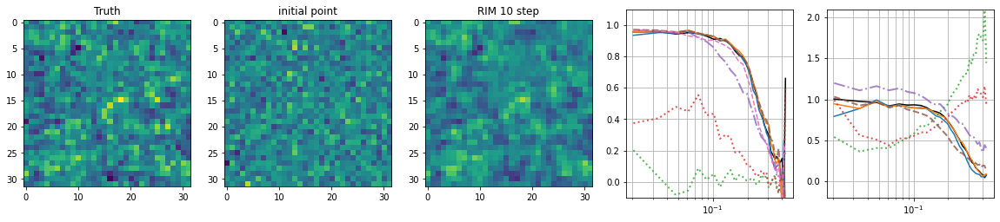

Time taken for 5 iterations :  11.562023639678955
Loss at iteration 85 :  0.67565227
Time taken for 5 iterations :  10.617099285125732
Loss at iteration 90 :  0.6607859
Time taken for 5 iterations :  10.651449918746948
Loss at iteration 95 :  0.6686537
Time taken for 5 iterations :  10.57475471496582
Loss at iteration 100 :  0.6724505


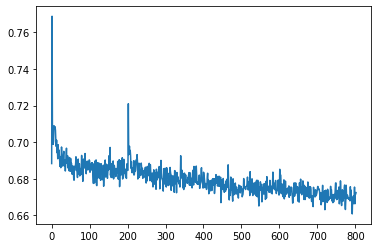

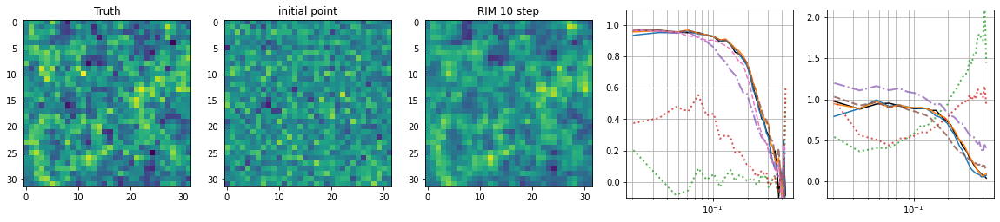

Time taken for 5 iterations :  11.511555194854736
Loss at iteration 105 :  0.66636527
Time taken for 5 iterations :  10.567429780960083
Loss at iteration 110 :  0.6719195
Time taken for 5 iterations :  10.812365770339966
Loss at iteration 115 :  0.6646834
Time taken for 5 iterations :  10.549184322357178
Loss at iteration 120 :  0.6676712


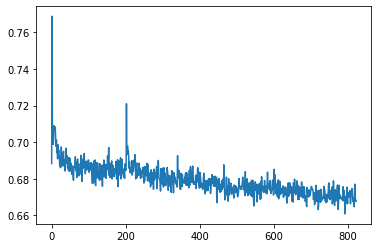

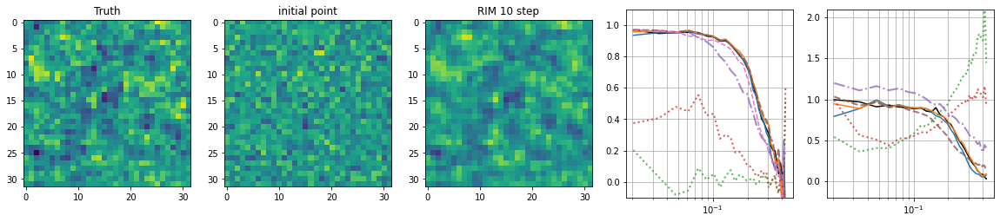

Time taken for 5 iterations :  11.492851972579956
Loss at iteration 125 :  0.6715636
Time taken for 5 iterations :  10.575301170349121
Loss at iteration 130 :  0.66682506
Time taken for 5 iterations :  10.58148980140686
Loss at iteration 135 :  0.6702396
Time taken for 5 iterations :  10.580685377120972
Loss at iteration 140 :  0.67194337


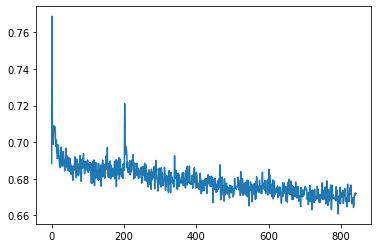

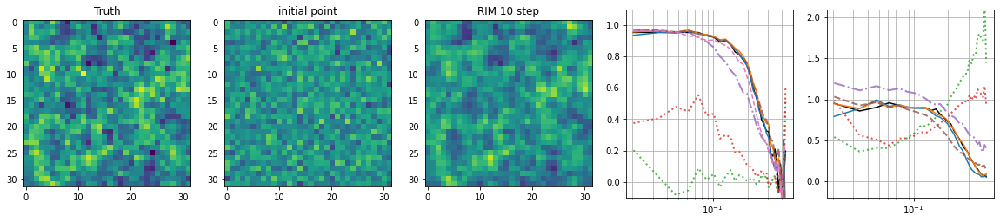

Time taken for 5 iterations :  11.709373235702515
Loss at iteration 145 :  0.66858387
Time taken for 5 iterations :  10.623268127441406
Loss at iteration 150 :  0.668839
Time taken for 5 iterations :  10.585036754608154
Loss at iteration 155 :  0.67209905
Time taken for 5 iterations :  10.5787193775177
Loss at iteration 160 :  0.66617644


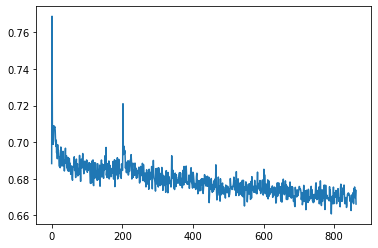

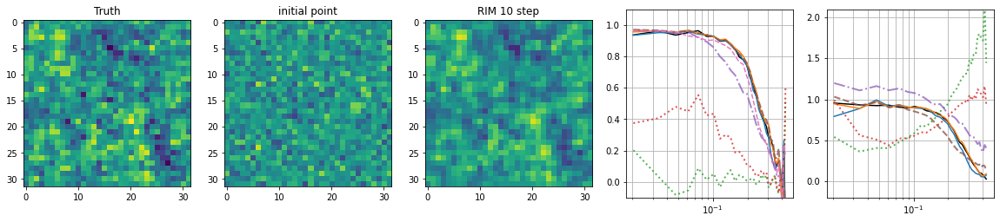

Time taken for 5 iterations :  11.447607517242432
Loss at iteration 165 :  0.6643541
Time taken for 5 iterations :  10.623554468154907
Loss at iteration 170 :  0.6669475
Time taken for 5 iterations :  10.611113786697388
Loss at iteration 175 :  0.66910607
Time taken for 5 iterations :  10.54761552810669
Loss at iteration 180 :  0.66750443


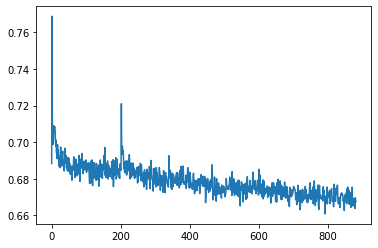

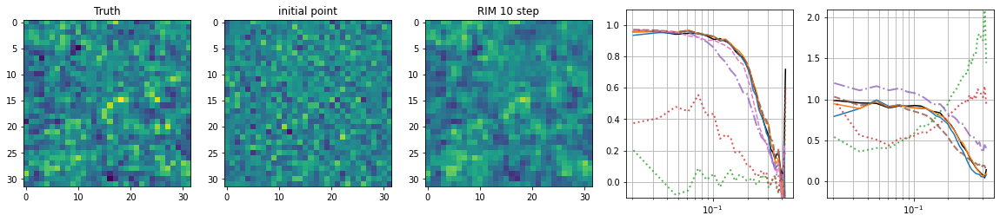

Time taken for 5 iterations :  11.699329853057861
Loss at iteration 185 :  0.6672964
Time taken for 5 iterations :  10.56416940689087
Loss at iteration 190 :  0.6740695
Time taken for 5 iterations :  10.562293529510498
Loss at iteration 195 :  0.67051375
Time taken for 5 iterations :  10.574728965759277
Loss at iteration 200 :  0.6660422


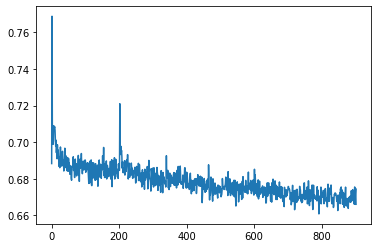

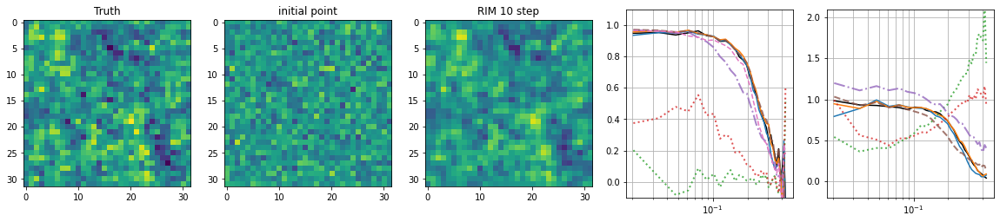

Time taken for 5 iterations :  11.492738008499146
Loss at iteration 205 :  0.67410684
Time taken for 5 iterations :  10.634312629699707
Loss at iteration 210 :  0.6709203
Time taken for 5 iterations :  10.828752040863037
Loss at iteration 215 :  0.67168176
Time taken for 5 iterations :  10.569839477539062
Loss at iteration 220 :  0.6682626


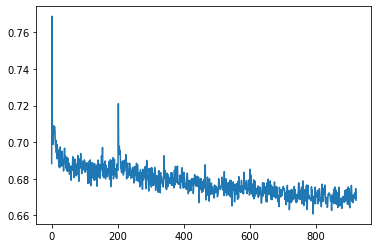

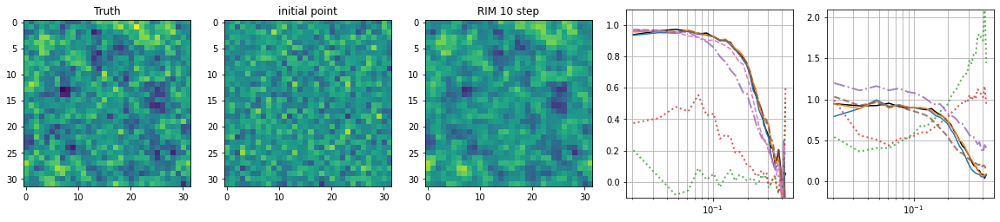

Time taken for 5 iterations :  11.486217975616455
Loss at iteration 225 :  0.6747587
Time taken for 5 iterations :  10.578891277313232
Loss at iteration 230 :  0.67699677
Time taken for 5 iterations :  10.559520721435547
Loss at iteration 235 :  0.6709213
Time taken for 5 iterations :  10.588302612304688
Loss at iteration 240 :  0.66779345


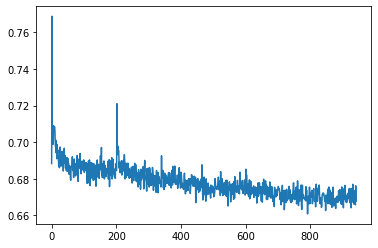

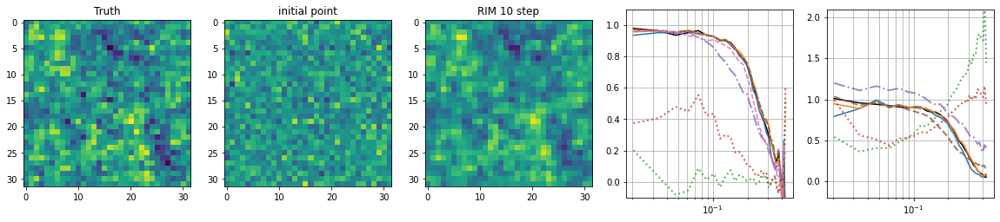

Time taken for 5 iterations :  11.735987186431885
Loss at iteration 245 :  0.6694082
Time taken for 5 iterations :  10.611439943313599
Loss at iteration 250 :  0.66904944
Time taken for 5 iterations :  10.557836771011353
Loss at iteration 255 :  0.6732722
Time taken for 5 iterations :  10.594055414199829
Loss at iteration 260 :  0.674609


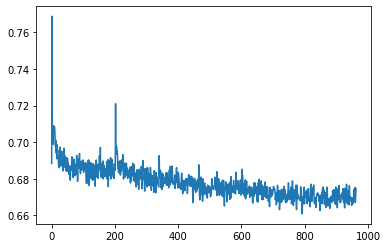

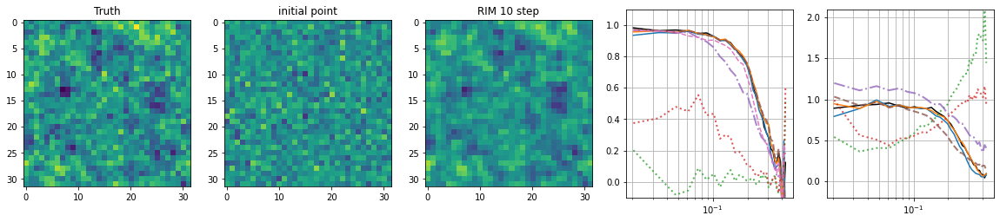

Time taken for 5 iterations :  11.561697959899902
Loss at iteration 265 :  0.6668975
Time taken for 5 iterations :  10.61539912223816
Loss at iteration 270 :  0.6711446
Time taken for 5 iterations :  10.602676630020142
Loss at iteration 275 :  0.6712389
Time taken for 5 iterations :  10.60787582397461
Loss at iteration 280 :  0.66699606


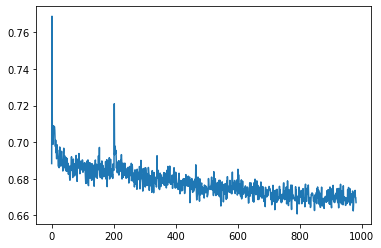

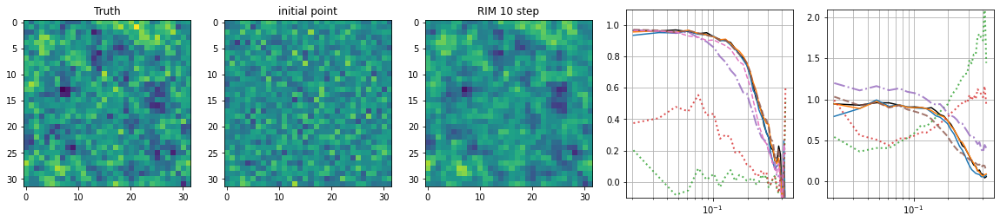

Time taken for 5 iterations :  11.820311307907104
Loss at iteration 285 :  0.6624201
Time taken for 5 iterations :  10.558769464492798
Loss at iteration 290 :  0.6696095
Time taken for 5 iterations :  10.539683103561401
Loss at iteration 295 :  0.66920453
Time taken for 5 iterations :  10.578035593032837
Loss at iteration 300 :  0.67011636


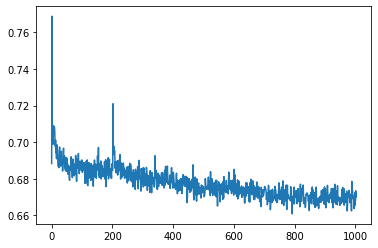

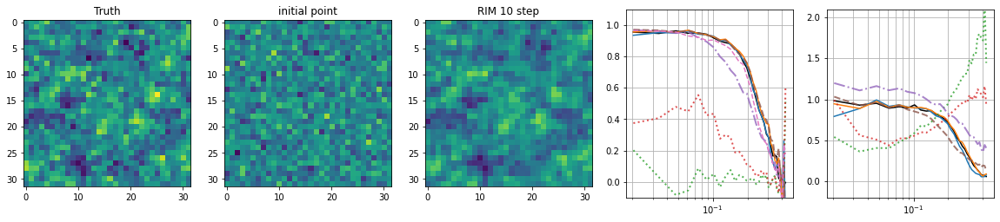

Time taken for 5 iterations :  11.548501968383789
Loss at iteration 305 :  0.6730527
Time taken for 5 iterations :  10.569136381149292
Loss at iteration 310 :  0.6694936
Time taken for 5 iterations :  10.794727563858032
Loss at iteration 315 :  0.66672355
Time taken for 5 iterations :  10.563467025756836
Loss at iteration 320 :  0.66987187


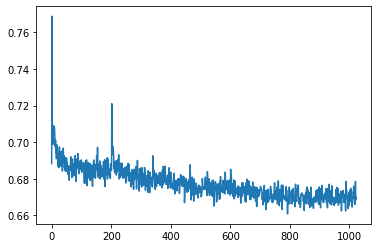

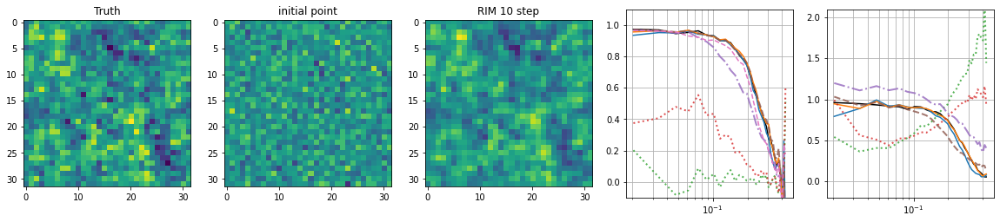

Time taken for 5 iterations :  11.552597284317017
Loss at iteration 325 :  0.6708507
Time taken for 5 iterations :  10.55566930770874
Loss at iteration 330 :  0.6670571
Time taken for 5 iterations :  10.560601711273193
Loss at iteration 335 :  0.6718657
Time taken for 5 iterations :  10.60846996307373
Loss at iteration 340 :  0.66796315


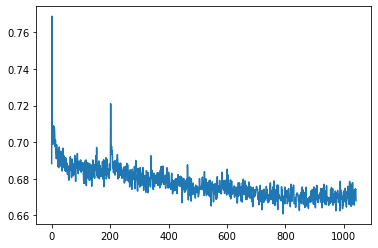

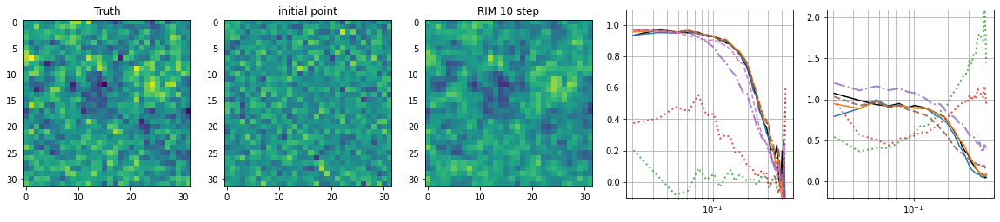

Time taken for 5 iterations :  11.682825565338135
Loss at iteration 345 :  0.667903
Time taken for 5 iterations :  10.584087371826172
Loss at iteration 350 :  0.6716675
Time taken for 5 iterations :  10.551872730255127
Loss at iteration 355 :  0.67505145
Time taken for 5 iterations :  10.581735134124756
Loss at iteration 360 :  0.6717139


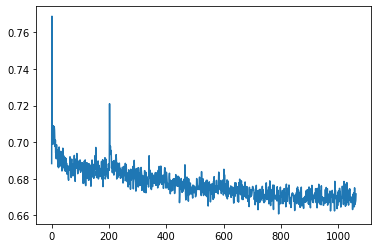

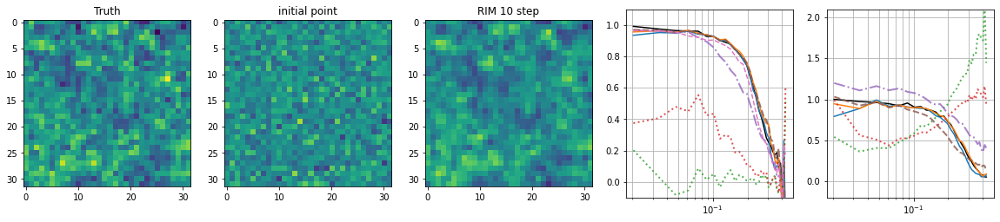

Time taken for 5 iterations :  11.53408145904541
Loss at iteration 365 :  0.66934484
Time taken for 5 iterations :  10.588644742965698
Loss at iteration 370 :  0.669313
Time taken for 5 iterations :  10.590565919876099
Loss at iteration 375 :  0.6698415
Time taken for 5 iterations :  10.59041452407837
Loss at iteration 380 :  0.673285


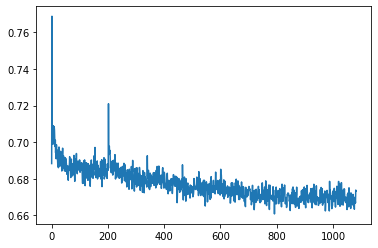

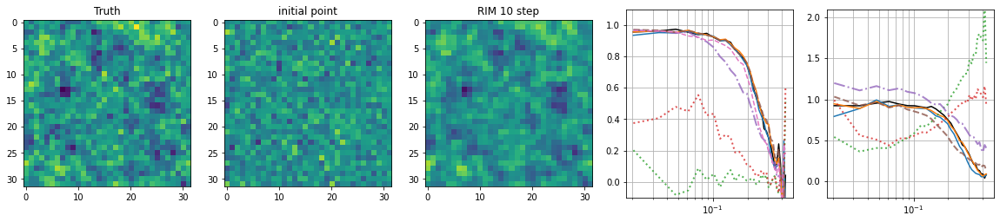

Time taken for 5 iterations :  11.711443185806274
Loss at iteration 385 :  0.6706332
Time taken for 5 iterations :  10.570249795913696
Loss at iteration 390 :  0.67130715
Time taken for 5 iterations :  10.554904699325562
Loss at iteration 395 :  0.67166305
Time taken for 5 iterations :  10.579370021820068
Loss at iteration 400 :  0.66878676


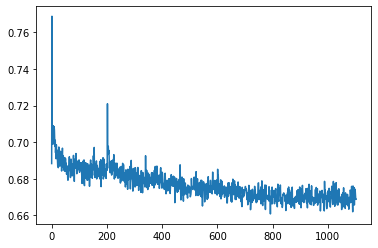

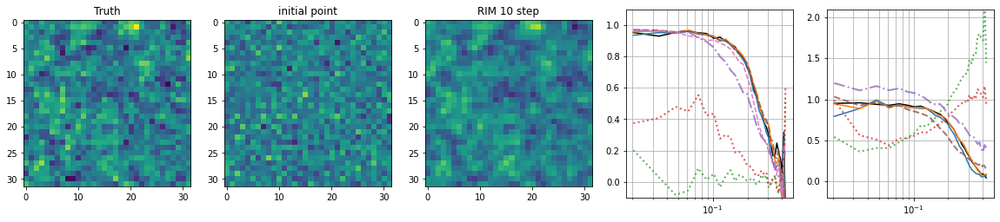

Time taken for 5 iterations :  11.491011619567871
Loss at iteration 405 :  0.67118925
Time taken for 5 iterations :  10.581712484359741
Loss at iteration 410 :  0.66910934
Time taken for 5 iterations :  10.850110530853271
Loss at iteration 415 :  0.67203736
Time taken for 5 iterations :  10.572766780853271
Loss at iteration 420 :  0.672446


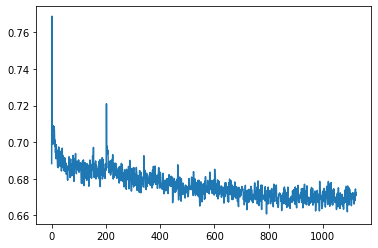

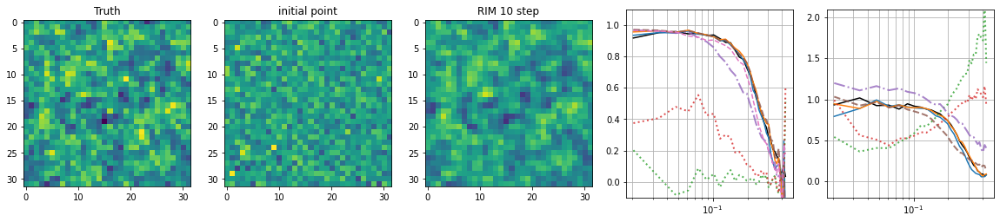

Time taken for 5 iterations :  11.477898359298706
Loss at iteration 425 :  0.6673603
Time taken for 5 iterations :  10.559679746627808
Loss at iteration 430 :  0.6682305
Time taken for 5 iterations :  10.582140445709229
Loss at iteration 435 :  0.66936797
Time taken for 5 iterations :  10.589246273040771
Loss at iteration 440 :  0.6693488


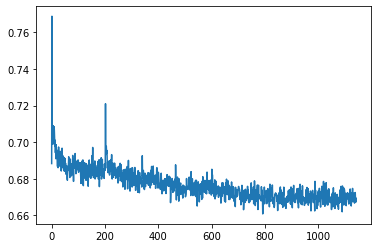

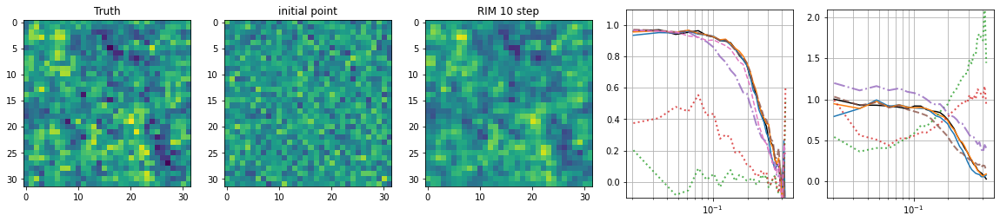

Time taken for 5 iterations :  11.736876487731934
Loss at iteration 445 :  0.6738358
Time taken for 5 iterations :  10.595062732696533
Loss at iteration 450 :  0.6698031
Time taken for 5 iterations :  10.573676824569702
Loss at iteration 455 :  0.66569895
Time taken for 5 iterations :  10.61061143875122
Loss at iteration 460 :  0.66663843


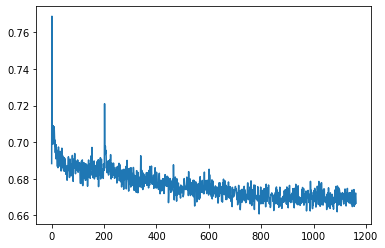

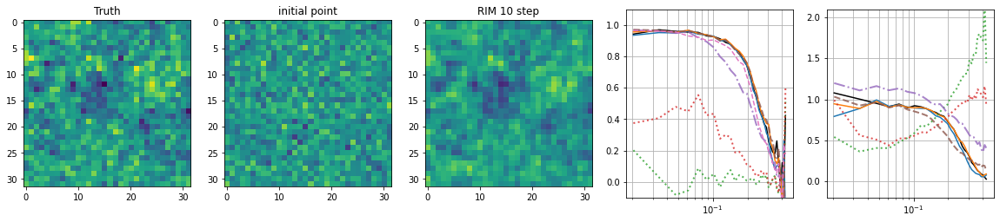

Time taken for 5 iterations :  11.472476243972778
Loss at iteration 465 :  0.6664161
Time taken for 5 iterations :  10.55162000656128
Loss at iteration 470 :  0.6662936
Time taken for 5 iterations :  10.5914785861969
Loss at iteration 475 :  0.6683829
Time taken for 5 iterations :  10.574772834777832
Loss at iteration 480 :  0.66718954


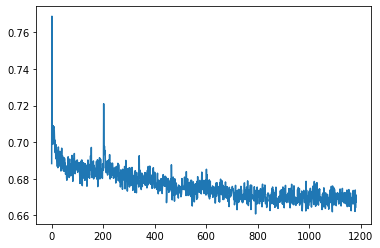

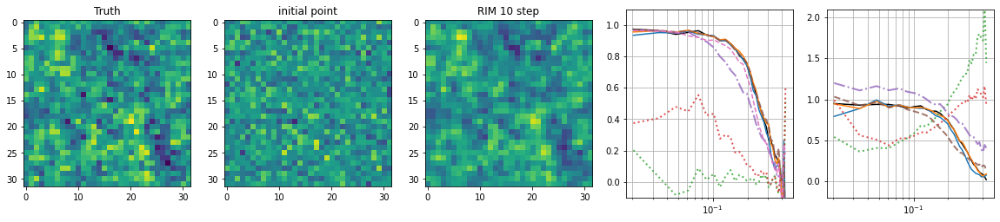

Time taken for 5 iterations :  11.749168395996094
Loss at iteration 485 :  0.672351
Time taken for 5 iterations :  10.552728414535522
Loss at iteration 490 :  0.6708726
Time taken for 5 iterations :  10.592963695526123
Loss at iteration 495 :  0.6666686
Time taken for 5 iterations :  10.586299657821655
Loss at iteration 500 :  0.66507417


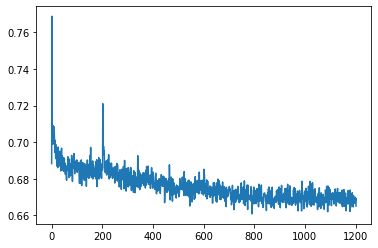

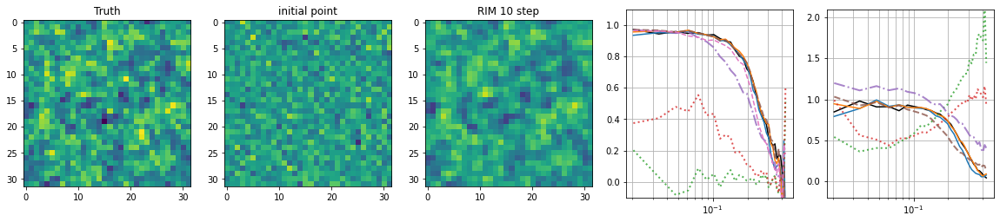

Time taken for 5 iterations :  11.478577852249146
Loss at iteration 505 :  0.66701704
Time taken for 5 iterations :  10.56953477859497
Loss at iteration 510 :  0.66863906
Time taken for 5 iterations :  10.825304746627808
Loss at iteration 515 :  0.672764
Time taken for 5 iterations :  10.564769744873047
Loss at iteration 520 :  0.6750744


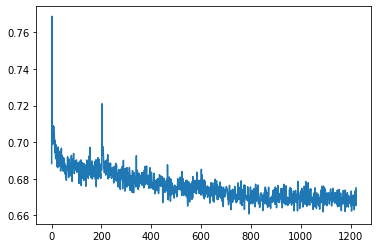

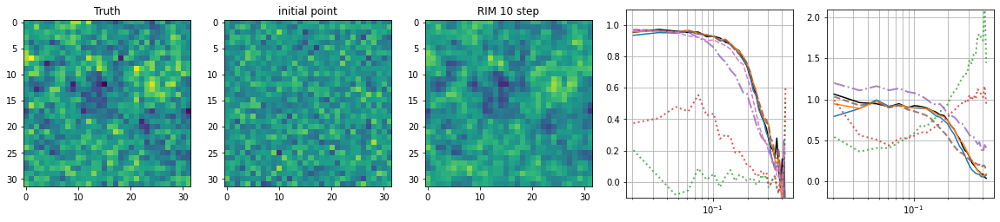

Time taken for 5 iterations :  11.506418466567993
Loss at iteration 525 :  0.66775024
Time taken for 5 iterations :  10.570038318634033
Loss at iteration 530 :  0.6678114
Time taken for 5 iterations :  10.5988929271698
Loss at iteration 535 :  0.669504
Time taken for 5 iterations :  10.58017086982727
Loss at iteration 540 :  0.6712896


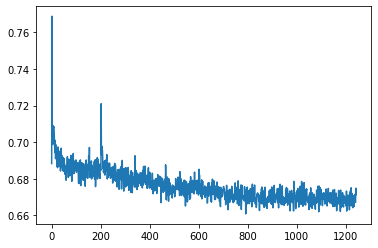

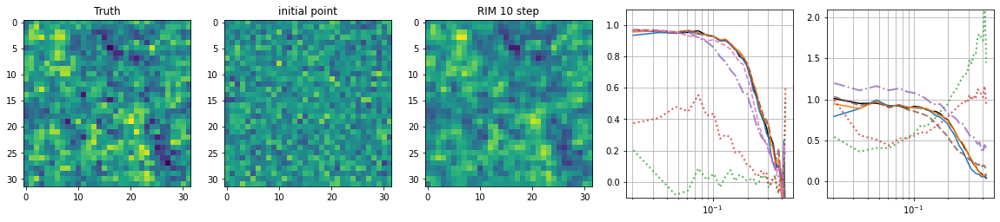

Time taken for 5 iterations :  11.722949028015137
Loss at iteration 545 :  0.66645616
Time taken for 5 iterations :  10.566579341888428
Loss at iteration 550 :  0.67378145
Time taken for 5 iterations :  10.572621583938599
Loss at iteration 555 :  0.6675996
Time taken for 5 iterations :  10.612940073013306
Loss at iteration 560 :  0.67141235


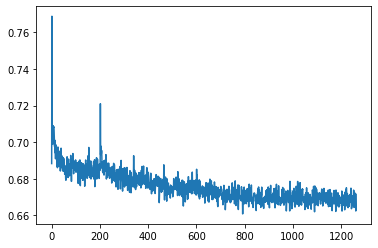

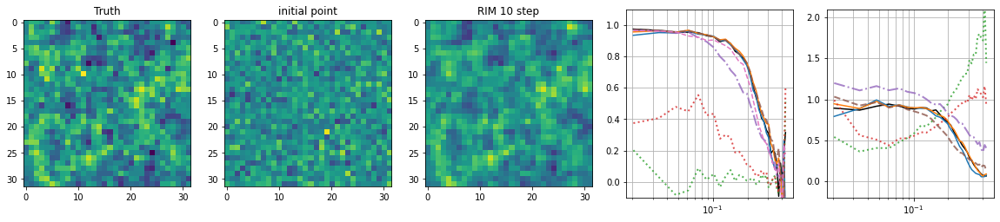

Time taken for 5 iterations :  11.47169804573059
Loss at iteration 565 :  0.6667136
Time taken for 5 iterations :  10.573359251022339
Loss at iteration 570 :  0.67391527
Time taken for 5 iterations :  10.577640533447266
Loss at iteration 575 :  0.6697983
Time taken for 5 iterations :  10.559104919433594
Loss at iteration 580 :  0.665897


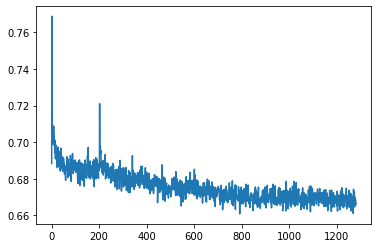

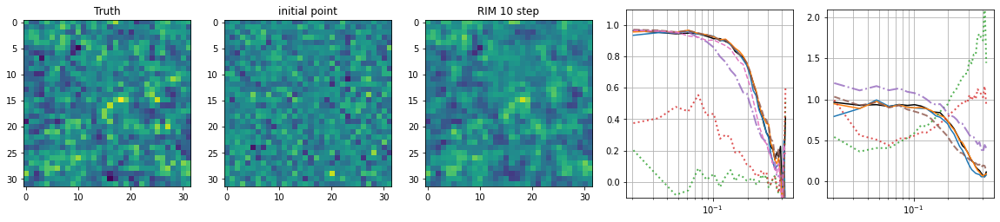

Time taken for 5 iterations :  11.742900609970093
Loss at iteration 585 :  0.6651135
Time taken for 5 iterations :  10.566566467285156
Loss at iteration 590 :  0.67044634
Time taken for 5 iterations :  10.662363529205322
Loss at iteration 595 :  0.6711304
Time taken for 5 iterations :  10.563236474990845
Loss at iteration 600 :  0.6685843


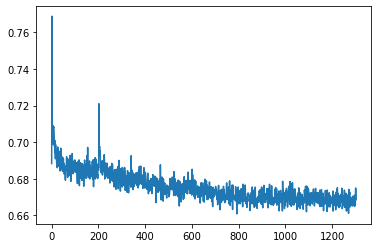

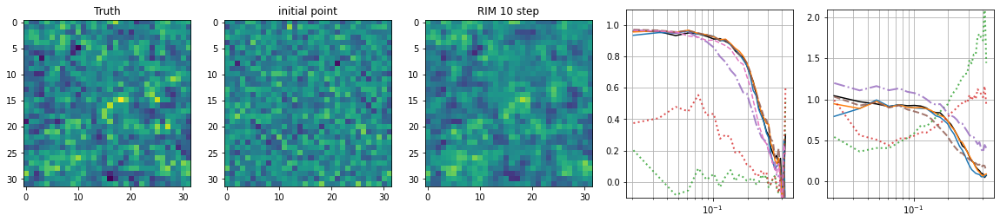

Time taken for 5 iterations :  11.58081340789795
Loss at iteration 605 :  0.66645116
Time taken for 5 iterations :  10.592462301254272
Loss at iteration 610 :  0.66807336
Time taken for 5 iterations :  10.823628664016724
Loss at iteration 615 :  0.67137855
Time taken for 5 iterations :  10.573529243469238
Loss at iteration 620 :  0.6739194


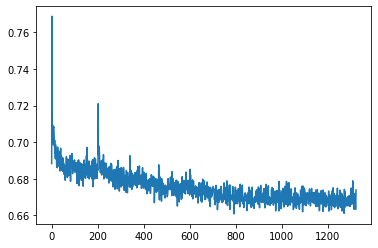

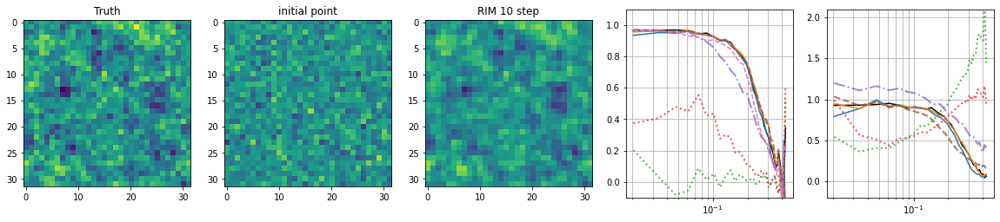

Time taken for 5 iterations :  11.514471769332886
Loss at iteration 625 :  0.667866
Time taken for 5 iterations :  10.59140920639038
Loss at iteration 630 :  0.6672383
Time taken for 5 iterations :  10.602911710739136
Loss at iteration 635 :  0.6658605
Time taken for 5 iterations :  10.601786375045776
Loss at iteration 640 :  0.66205823


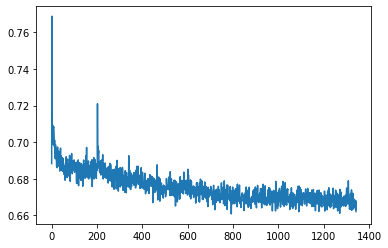

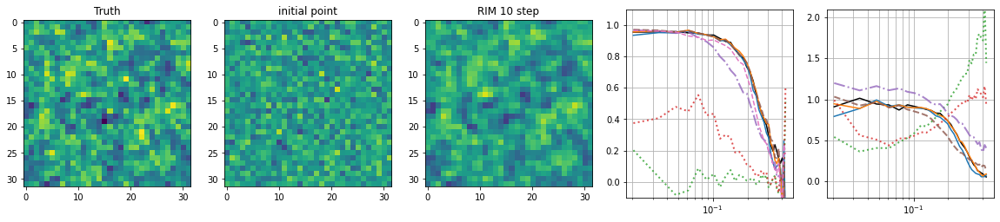

Time taken for 5 iterations :  11.787572622299194
Loss at iteration 645 :  0.6636112
Time taken for 5 iterations :  10.621942043304443
Loss at iteration 650 :  0.6644806
Time taken for 5 iterations :  10.582437992095947
Loss at iteration 655 :  0.66073227
Time taken for 5 iterations :  10.58267593383789
Loss at iteration 660 :  0.6658809


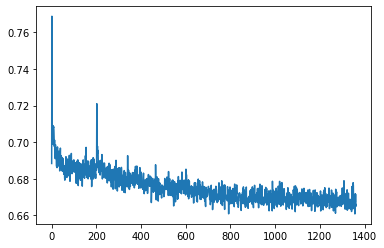

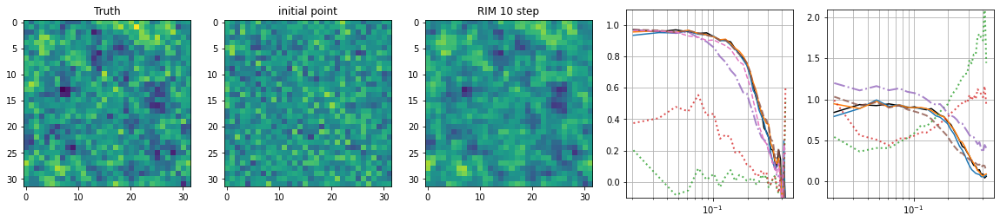

Time taken for 5 iterations :  11.525830507278442
Loss at iteration 665 :  0.6768493
Time taken for 5 iterations :  10.5691397190094
Loss at iteration 670 :  0.6684689
Time taken for 5 iterations :  10.573975563049316
Loss at iteration 675 :  0.6638823
Time taken for 5 iterations :  10.60811734199524
Loss at iteration 680 :  0.66182715


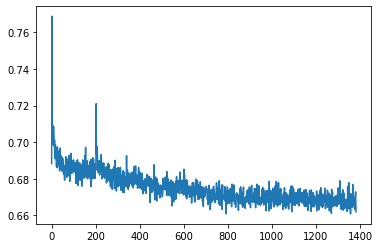

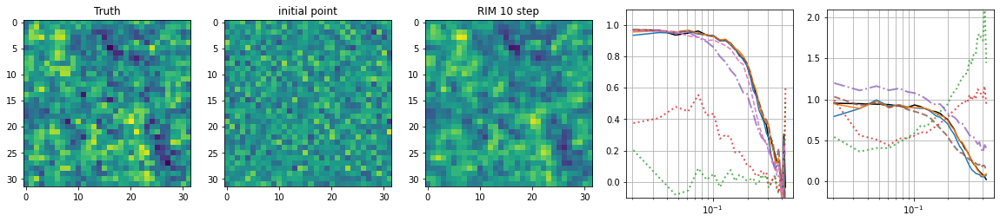

Time taken for 5 iterations :  11.744630813598633
Loss at iteration 685 :  0.66887987
Time taken for 5 iterations :  10.620200872421265
Loss at iteration 690 :  0.6699052
Time taken for 5 iterations :  10.623673677444458
Loss at iteration 695 :  0.6700804
Time taken for 5 iterations :  10.589046478271484
Loss at iteration 700 :  0.6658647


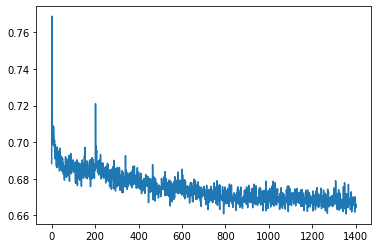

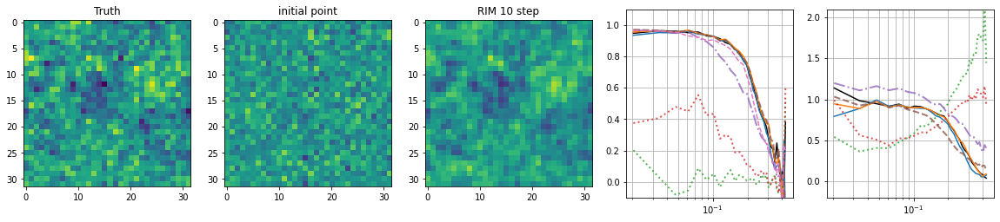

Time taken for 5 iterations :  11.492242574691772
Loss at iteration 705 :  0.6733166
Time taken for 5 iterations :  10.56813669204712
Loss at iteration 710 :  0.6735337
Time taken for 5 iterations :  10.802552461624146
Loss at iteration 715 :  0.6698213
Time taken for 5 iterations :  10.614892959594727
Loss at iteration 720 :  0.6588826


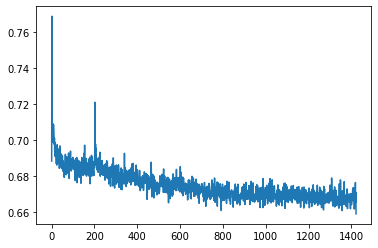

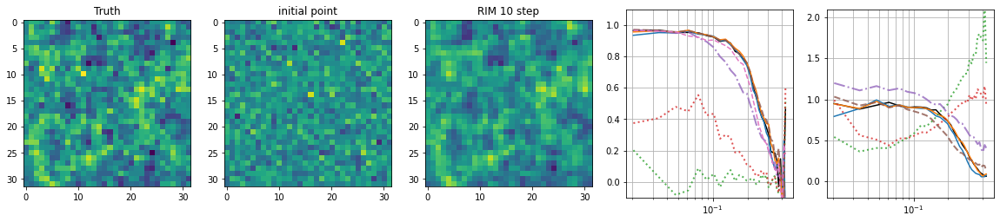

Time taken for 5 iterations :  11.509936332702637
Loss at iteration 725 :  0.6640072
Time taken for 5 iterations :  10.62584400177002
Loss at iteration 730 :  0.6723214
Time taken for 5 iterations :  10.646262168884277
Loss at iteration 735 :  0.6609832
Time taken for 5 iterations :  10.597150802612305
Loss at iteration 740 :  0.6671137


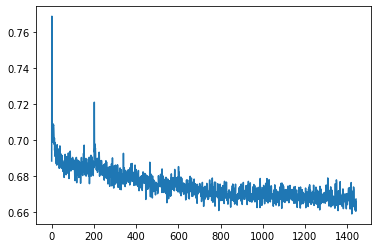

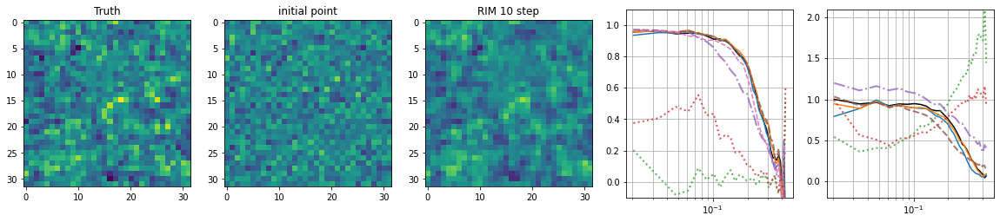

Time taken for 5 iterations :  11.70466661453247
Loss at iteration 745 :  0.671037
Time taken for 5 iterations :  10.59542202949524
Loss at iteration 750 :  0.6688624
Time taken for 5 iterations :  10.619226217269897
Loss at iteration 755 :  0.67309135
Time taken for 5 iterations :  10.537980318069458
Loss at iteration 760 :  0.6705513


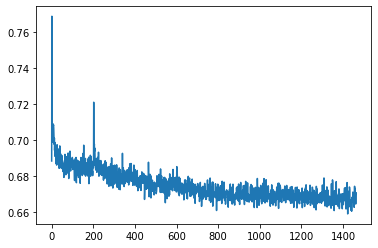

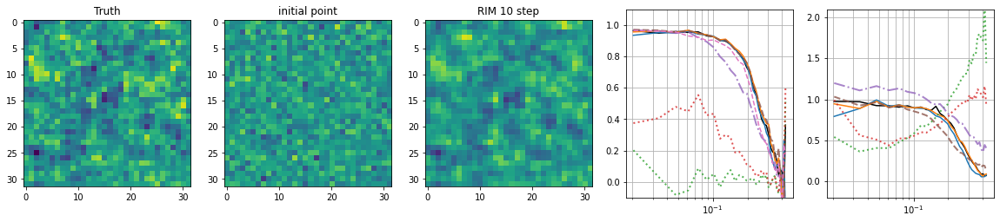

Time taken for 5 iterations :  11.49282431602478
Loss at iteration 765 :  0.66946405
Time taken for 5 iterations :  10.64407753944397
Loss at iteration 770 :  0.6686649
Time taken for 5 iterations :  10.593313932418823
Loss at iteration 775 :  0.6687049
Time taken for 5 iterations :  10.563970804214478
Loss at iteration 780 :  0.6682177


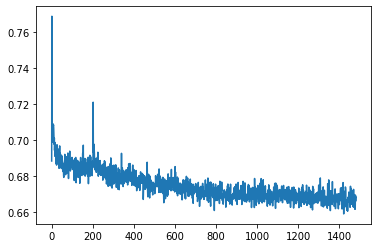

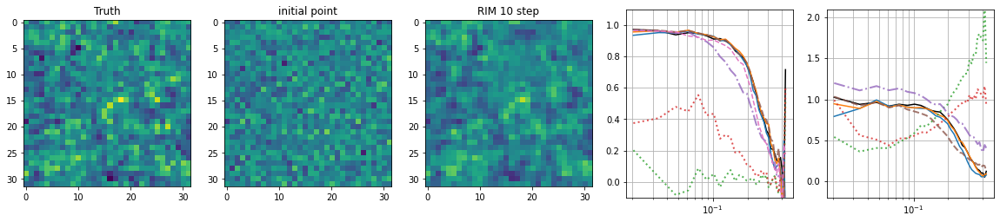

Time taken for 5 iterations :  11.728724241256714
Loss at iteration 785 :  0.6710928
Time taken for 5 iterations :  10.537933588027954
Loss at iteration 790 :  0.6664828
Time taken for 5 iterations :  10.571033477783203
Loss at iteration 795 :  0.66705334
Time taken for 5 iterations :  10.610077619552612
Loss at iteration 800 :  0.66945136


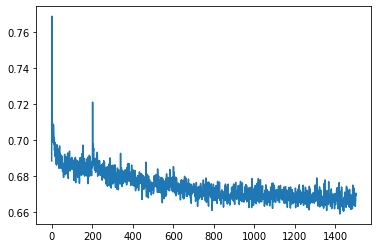

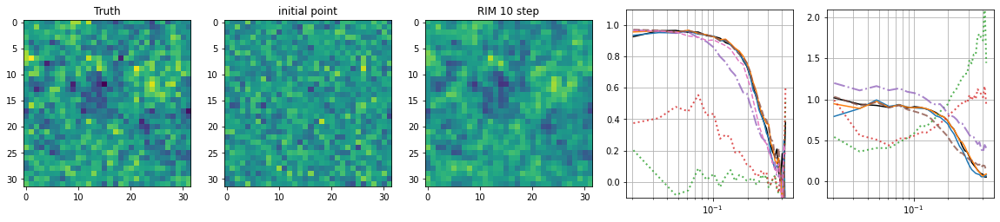

Time taken for 5 iterations :  11.510683536529541
Loss at iteration 805 :  0.6701183
Time taken for 5 iterations :  10.60505986213684
Loss at iteration 810 :  0.6696271
Time taken for 5 iterations :  10.826984405517578
Loss at iteration 815 :  0.66233915
Time taken for 5 iterations :  10.580907106399536
Loss at iteration 820 :  0.6631083


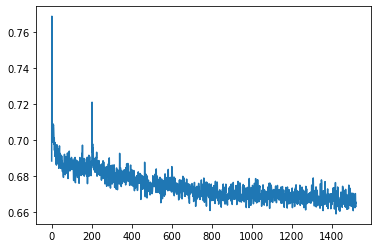

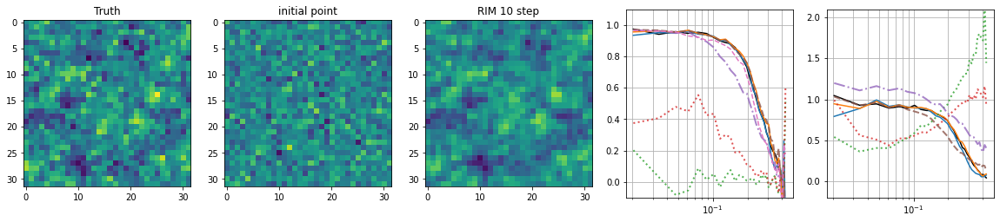

Time taken for 5 iterations :  11.53030776977539
Loss at iteration 825 :  0.6688114
Time taken for 5 iterations :  10.601714134216309
Loss at iteration 830 :  0.66252154
Time taken for 5 iterations :  10.5563325881958
Loss at iteration 835 :  0.6673657
Time taken for 5 iterations :  10.59402346611023
Loss at iteration 840 :  0.66392916


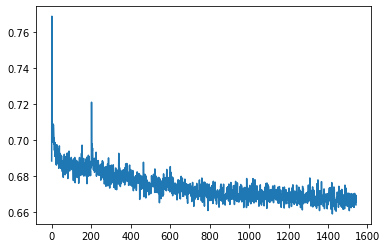

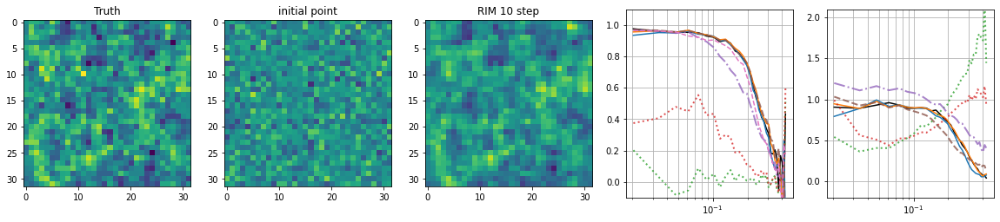

Time taken for 5 iterations :  11.748852014541626
Loss at iteration 845 :  0.6680302
Time taken for 5 iterations :  10.581477642059326
Loss at iteration 850 :  0.6707318
Time taken for 5 iterations :  10.572360038757324
Loss at iteration 855 :  0.6676692
Time taken for 5 iterations :  10.605124711990356
Loss at iteration 860 :  0.66618323


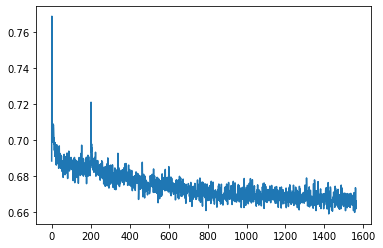

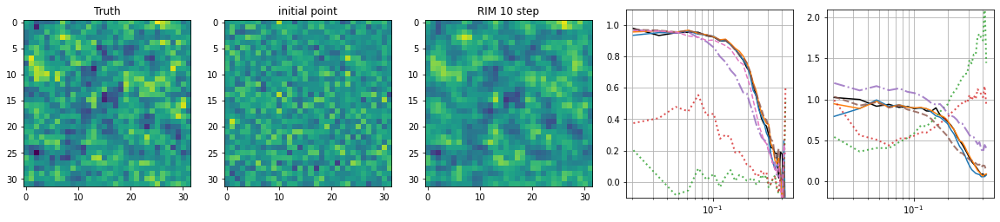

Time taken for 5 iterations :  11.504280805587769
Loss at iteration 865 :  0.6623435
Time taken for 5 iterations :  10.57118558883667
Loss at iteration 870 :  0.6692955
Time taken for 5 iterations :  10.538557052612305
Loss at iteration 875 :  0.670176
Time taken for 5 iterations :  10.833436012268066
Loss at iteration 880 :  0.6635851


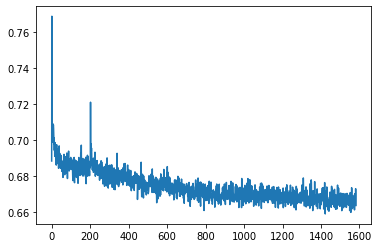

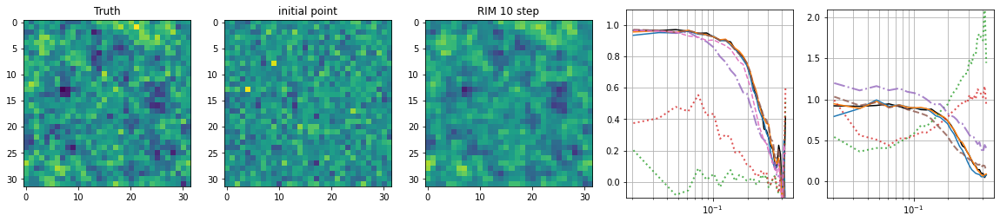

Time taken for 5 iterations :  11.581627368927002
Loss at iteration 885 :  0.6636029
Time taken for 5 iterations :  10.591724157333374
Loss at iteration 890 :  0.66700435
Time taken for 5 iterations :  10.611101388931274
Loss at iteration 895 :  0.66324407
Time taken for 5 iterations :  10.556619882583618
Loss at iteration 900 :  0.6670436


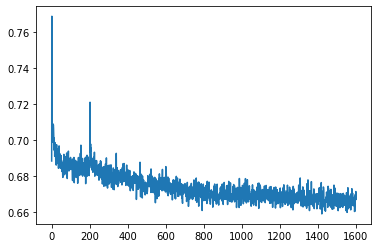

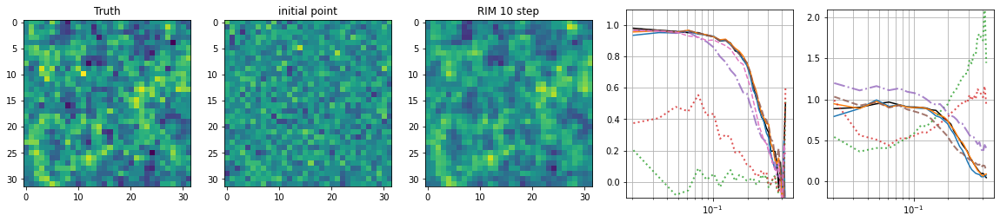

Time taken for 5 iterations :  11.587573289871216
Loss at iteration 905 :  0.66269904
Time taken for 5 iterations :  10.5899076461792
Loss at iteration 910 :  0.6670383
Time taken for 5 iterations :  10.78744649887085
Loss at iteration 915 :  0.6623833
Time taken for 5 iterations :  10.55015516281128
Loss at iteration 920 :  0.6673444


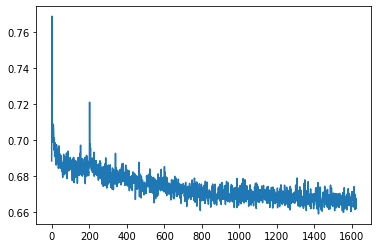

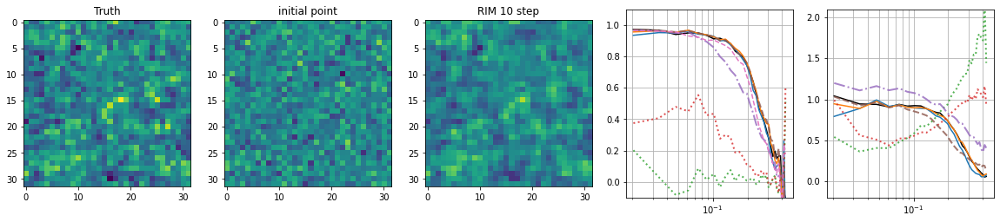

Time taken for 5 iterations :  11.536777973175049
Loss at iteration 925 :  0.66388166
Time taken for 5 iterations :  10.576228141784668
Loss at iteration 930 :  0.6665433
Time taken for 5 iterations :  10.58772087097168
Loss at iteration 935 :  0.664953
Time taken for 5 iterations :  10.581953525543213
Loss at iteration 940 :  0.66709316


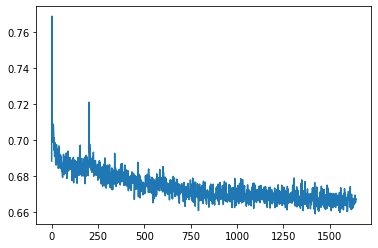

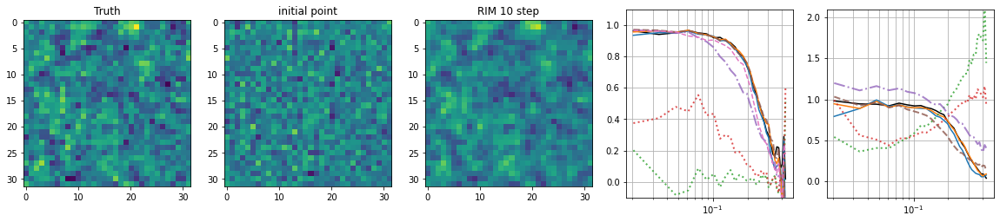

Time taken for 5 iterations :  11.734424114227295
Loss at iteration 945 :  0.66565037
Time taken for 5 iterations :  10.581071853637695
Loss at iteration 950 :  0.67315763
Time taken for 5 iterations :  10.583504676818848
Loss at iteration 955 :  0.6681828
Time taken for 5 iterations :  10.544162511825562
Loss at iteration 960 :  0.665402


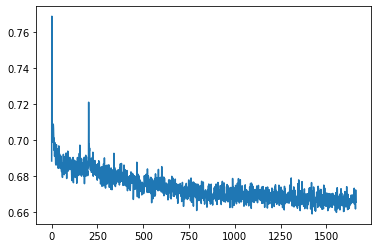

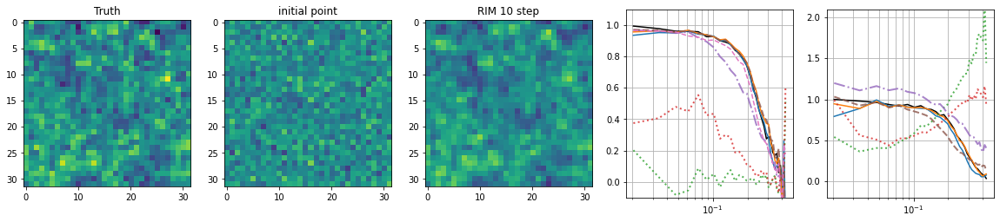

Time taken for 5 iterations :  11.491202592849731
Loss at iteration 965 :  0.66342956
Time taken for 5 iterations :  10.581055879592896
Loss at iteration 970 :  0.6618735
Time taken for 5 iterations :  10.588361501693726
Loss at iteration 975 :  0.6649069
Time taken for 5 iterations :  10.574053049087524
Loss at iteration 980 :  0.6702969


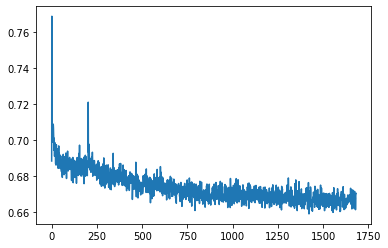

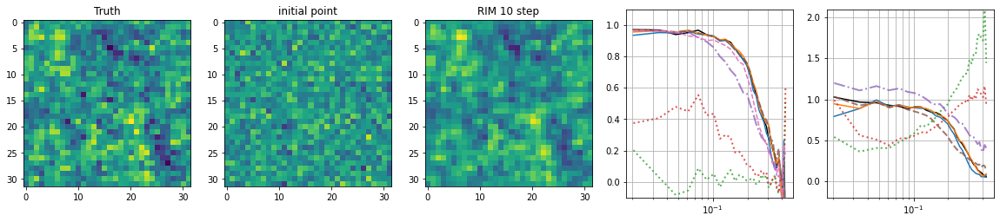

Time taken for 5 iterations :  11.734475135803223
Loss at iteration 985 :  0.66311
Time taken for 5 iterations :  10.570158004760742
Loss at iteration 990 :  0.6669193
Time taken for 5 iterations :  10.626192331314087
Loss at iteration 995 :  0.668895
Time taken for 5 iterations :  10.55004334449768
Loss at iteration 1000 :  0.66705936


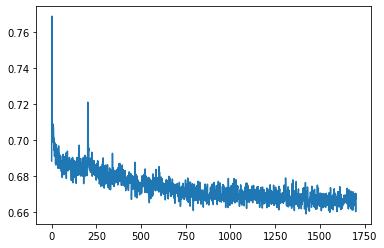

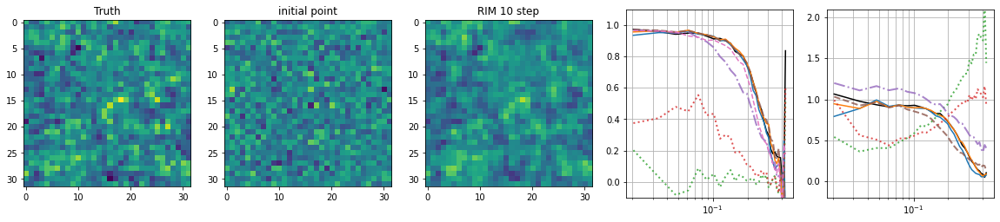

In [149]:
piter = 5
testiter = 20
# @tf.function
def rim_trainhybrid(x_true, x_init, y):

    with tf.GradientTape() as tape:
        x_pred, states = rimhybrid(x_init, y, 
                grad_fn=rim_grad_fn, grad_args = grad_params, training=True)
        res  = (x_true - x_pred)
        loss = tf.reduce_mean(tf.square(res))
        
    gradients = tape.gradient(loss, rimhybrid.trainable_variables)
    return loss, gradients
        
    
    
lrs = [0.0005, 0.0005, 0.0001]
liters = [201, 501, 1001]
trainiter = 0 
losses = []
start = time.time()
for il in range(3):
    print('Learning rate = %0.3e'%lrs[il])
    opt = tf.keras.optimizers.Adam(learning_rate=lrs[il])
    
    for i in range(liters[il]):
        idx = np.random.randint(0, traindata.shape[0], 8)
        xx2, yy2 = traindata[idx, 0].astype(float32), traindata[idx, 1].astype(float32), 
        x_init = np.random.normal(size=xx2.size).reshape(xx2.shape).astype(float32)


        loss, gradients = rim_trainhybrid(x_true=tf.constant(xx2), 
                                x_init=tf.constant(x_init), 
                                y=tf.constant(yy2))

        losses.append(loss.numpy())    
        opt.apply_gradients(zip(gradients, rimhybrid.trainable_variables))
        
        if i%piter == 0: 
            print("Time taken for %d iterations : "%piter, time.time() - start)
            print("Loss at iteration %d : "%i, losses[-1])
            start = time.time()
        if i%testiter == 0: 
            plt.plot(losses)
            plt.show()
            plt.close()
            test_callbackhybrid()
        trainiter  += 1